# Recommendation System development for paintings through Image Classification - *Part 2*

The purpose of this assignment was to develop a recommendation system that classifies paintings based on specific target labels and suggests similar artworks to enhance user engagement. Below are the key objectives and steps taken during the project:
- Deep-learning classification model: The primary goal was to create a multi-output classifier to predict five target labels—artist, subject, style, materials, and period of the painting.
- Recommendation system: The second goal was to develop a system that recommends similar paintings based on the predicted labels and extracted image features, to maximize user engagement.
- Model architectures: Two deep learning approaches were used—Convolutional Neural Networks (EfficientNetB3, VGG16, VGG19) and Vision Transformer (Google's ViT model).
- Performance comparison: After evaluating the models, the custom Vision Transformer (ViT) classifier outperformed the CNN-based models in terms of accuracy.
- Embedding-based recommendation: The selected ViT model was used to extract both visual and label features as embeddings, which were then utilized to calculate the similarity between paintings for the recommendation system.

<br/>

The initial dataset utilized has been collected from "Best Artworks of All Time", the "data.csv" file and can be accessed at [kaggle](https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time?fbclid=IwY2xjawFiYOBleHRuA2FlbQIxMAABHSNw_G7kJ3z-yZSqa6CRmeXTRPDIOA1eF8HZV92KjPmy-NzeE0QYRyTtdw_aem_oKhEYzZut1CgX1-bduN3NA) .

<br/>

In this part (part 2), the development of the multi-output classification model and recommendation system was implemented, utilizing various architectures to enhance the predictive capabilities and suggest artworks to users effectively.

<br/>

To conduct file management and data manipulation, several libraries have been employed, including:
#### Library for Data Manipulation and Management
- `google.colab`
- `os`
- `pandas`
- `collections`

#### Library for Model Development and Training
- `tensorflow`
- `tensorflow.keras.preprocessing.image`
- `tensorflow.keras.applications`
- `tensorflow.keras.models`
- `tensorflow.keras.layers`
- `tensorflow.keras.optimizers`
- `tensorflow.keras.utils`
- `tensorflow.keras.callbacks`

#### Library for Data Processing and Evaluation
- `sklearn.model_selection`
- `sklearn.preprocessing`
- `sklearn.metrics`
- `numpy`

#### Library for Data Visualization
- `matplotlib.pyplot`
- `seaborn`

#### Library for Image Processing
- `PIL`

#### Library for Saving and Loading Models
- `pickle`

#### Library for Transformers
- `transformers`

---

> MSc Business Analytics   <br/>
> Athens University of Economics and Business  <br/>
> Machine Learning and Content Analytics <br/>
>  <br/>
> Papadimitriou Anna, Registration number: f2822311  <br/>
> Ralli Eleni, Registration number: f2822312  <br/>
> Lakkas-Pyknis Evangelos, Registration number: f2822306 <br/>
> Mesolora Stamatoula Gerasimoula, Registration number: f2822308  <br/>

In [ ]:
from google.colab import drive
import os
import pandas as pd
from collections import Counter
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.applications import EfficientNetB3, EfficientNetB7, VGG16, VGG19
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback, ModelCheckpoint, LearningRateScheduler
import seaborn as sns
import pickle
from transformers import ViTModel, ViTFeatureExtractor
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.image as mpimg

## Forming the dataset and data exploration

### Mounting Google Drive and Loading the Dataset

1. **Mounting Google Drive**:
   - `drive.mount('/content/drive')`: This line mounts the user's Google Drive to the Colab environment, making it accessible for loading and saving files.
   
2. **Setting up paths**:
   - The variable `collab_notebooks_path` is defined to point to the "Colab Notebooks/Project_ML" directory in Google Drive, where the project files are stored.
   - `os.listdir(collab_notebooks_path)` prints the list of all files and folders in this directory, helping to ensure that the right files are accessible.

3. **Defining additional paths**:
   - `base_path`: The base directory for the project.
   - `filtered_paintings_path`: The path where filtered paintings are stored.
   - `excel_path`: The path to the Excel file `'pinakes teliko 1.xlsx'`, which contains the dataset.

4. **Listing contents of the base path**:
   - `print(os.listdir(base_path))`: This line prints the contents of the base directory, allowing verification of the files available.

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
collab_notebooks_path = '/content/drive/My Drive/Colab Notebooks/Project_ML '

In [ ]:
base_path = '/content/drive/My Drive/Colab Notebooks/Project_ML '
filtered_paintings_path = os.path.join(base_path, 'filtered_paintings')
excel_path = os.path.join(base_path, 'pinakes teliko 1.xlsx')

We load the Excel file containing paintings data into a pandas DataFrame.

<br/>

The dataset consists of 400 rows and 8 columns:
- Image ID: The ID of each painting
- Title: The title of each painting
- Artist: The artist of each painting  
- Subject: The subject of each painting
- Style: The style of each painting
- Materials: The materials used for each painting  
- Start: The first year of the period during which the painting was created (counting years by 10)
- End: The last year of the period during which the painting was created (counting years by 10)

In [ ]:
df= pd.read_excel(excel_path)
print(df.shape)
df.head(10)

(400, 8)


,Image ID,Title,Artist,Subject,Style,Materials,Start,End
0,Gustave_Courbet_13,The Wounded Man,Gustave Courbet,Portrait,Realism,Oil on canvas,1840,1860
1,Gustave_Courbet_16,Man with a Pipe,Gustave Courbet,Portrait,Realism,Oil on canvas,1840,1860
2,Gustave_Courbet_59,The Desperate Man,Gustave Courbet,Portrait,Realism,Oil on canvas,1840,1860
3,Gustave_Courbet_8,Young Women from the Village,Gustave Courbet,Genre painting,Realism,Oil on canvas,1840,1860
4,Gustave_Courbet_58,After Dinner at Ornans,Gustave Courbet,Genre painting,Realism,Oil on canvas,1840,1860
5,Gustave_Courbet_6,The Woman in the Waves,Gustave Courbet,Nude painting,Realism,Oil on canvas,1860,1880
6,Gustave_Courbet_37,The Artist's Studio,Gustave Courbet,Allegorical,Realism,Oil on canvas,1840,1860
7,Gustave_Courbet_31,The Bathers,Gustave Courbet,Genre painting,Realism,Oil on canvas,1840,1860
8,Gustave_Courbet_30,The Wave,Gustave Courbet,Landscape,Realism,Oil on canvas,1860,1880
9,Gustave_Courbet_23,A Burial at Ornans,Gustave Courbet,Genre painting,Realism,Oil on canvas,1840,1860


## Creating and Inspecting the Dataset with Image Paths and Labels

### Building the dataset

A list called `dataset` is initialized to store information about each image and its corresponding labels. Then, the code iterates through all image files in the `filtered_paintings_path` directory using `os.listdir()`.
- For each image file:
    - The `image_id` is extracted by removing the file extension.
    - A row in the `df` DataFrame is found where the `'Image ID'` matches the `image_id`.
    - If a matching row is found, relevant label information such as `'Artist'`, `'Subject'`, `'Style'`, `'Materials'`, `'Start'`, and `'End'` is extracted from the DataFrame.
    - A dictionary `image_data` is created that contains the image file path and the corresponding labels.
    - This dictionary is appended to the `dataset` list.
     
<br/>

The `dataset` list of dictionaries is converted into a pandas DataFrame `df` for easier manipulation and analysis.
The dataset consists of 400 rows and 7 columns:
- Column `Image ID` has been replaced by column `image_path`.
- Column `Title` has been deleted.

<br/>

After that, we make sure that every image ID has been replaced to an image path and we check the number of unique classes for each field, ensuring that there are no duplicate images.

In [ ]:
dataset = []

for image_file in os.listdir(filtered_paintings_path):
        image_id = os.path.splitext(image_file)[0]

        row = df[df['Image ID'] == image_id]

        if not row.empty:
            artist = row['Artist'].values[0]
            subject = row['Subject'].values[0]
            style = row['Style'].values[0]
            materials = row['Materials'].values[0]
            start = row['Start'].values[0]
            end = row['End'].values[0]

            image_data = {
                'image_path': os.path.join(filtered_paintings_path, image_file),
                'artist': artist,
                'subject': subject,
                'style': style,
                'materials': materials,
                'start': start,
                'end': end
            }

            dataset.append(image_data)

df = pd.DataFrame(dataset)

In [ ]:
print(df.shape)
df.head()

(400, 7)


,image_path,artist,subject,style,materials,start,end
0,/content/drive/My Drive/Colab Notebooks/Projec...,Jan van Eyck,Portrait,Northern Renaissance,Oil on panel,1420,1440
1,/content/drive/My Drive/Colab Notebooks/Projec...,Alfred Sisley,Landscape,Impressionism,Oil on canvas,1860,1880
2,/content/drive/My Drive/Colab Notebooks/Projec...,Gustave Courbet,Genre painting,Realism,Oil on canvas,1840,1860
3,/content/drive/My Drive/Colab Notebooks/Projec...,Mikhail Vrubel,Cityscape,Symbolism,Watercolor on paper,1880,1900
4,/content/drive/My Drive/Colab Notebooks/Projec...,Jackson Pollock,Abstract,Abstract Art,Enamel on canvas,1940,1960


In [ ]:
df.isna().sum()

,0
image_path,0
artist,0
subject,0
style,0
materials,0
start,0
end,0


In [ ]:
print(len(df['artist'].unique()))
print(len(df['subject'].unique()))
print(len(df['style'].unique()))
print(len(df['materials'].unique()))
print(len(df['start'].unique()))
print(len(df['end'].unique()))

40
29
29
23
25
25


### Cleaning and Saving the Dataset

The str.lower() and str.strip() methods are applied to several columns ('subject', 'style', 'materials', and 'artist') to ensure consistency in the text data:
- `.str.lower()` : Converts all strings to lowercase, eliminating case-sensitivity issues.
- `.str.strip()` : Removes any leading or trailing whitespace, ensuring clean and uniform values across the dataset.


In [ ]:
df['subject'] = df['subject'].str.lower().str.strip()
df['style'] = df['style'].str.lower().str.strip()
df['materials'] = df['materials'].str.lower().str.strip()
df['artist'] = df['artist'].str.lower().str.strip()

In [ ]:
print(len(df['artist'].unique()))
print(len(df['subject'].unique()))
print(len(df['style'].unique()))
print(len(df['materials'].unique()))
print(len(df['start'].unique()))
print(len(df['end'].unique()))

40
21
28
21
25
25


## Analyzing and Modifying the Dataset

### Counting occurrences of categorical labels
The dataset is grouped by different categorical columns (`'subject'`, `'style'`, `'artist'`, and `'materials'`) and the number of occurrences of each unique value is counted.
These counts are useful for understanding the distribution of labels in the dataset, which may affect model performance (e.g., class imbalance).

In [ ]:
art = df.groupby('artist').size()
art_df = art.reset_index(name='count')
art_df

,artist,count
0,albrecht durer,10
1,alfred sisley,10
2,amedeo modigliani,10
3,andrei rublev,10
4,andy warhol,10
5,camille pissarro,10
6,caravaggio,10
7,claude monet,10
8,diego rivera,10
9,diego velázquez,10


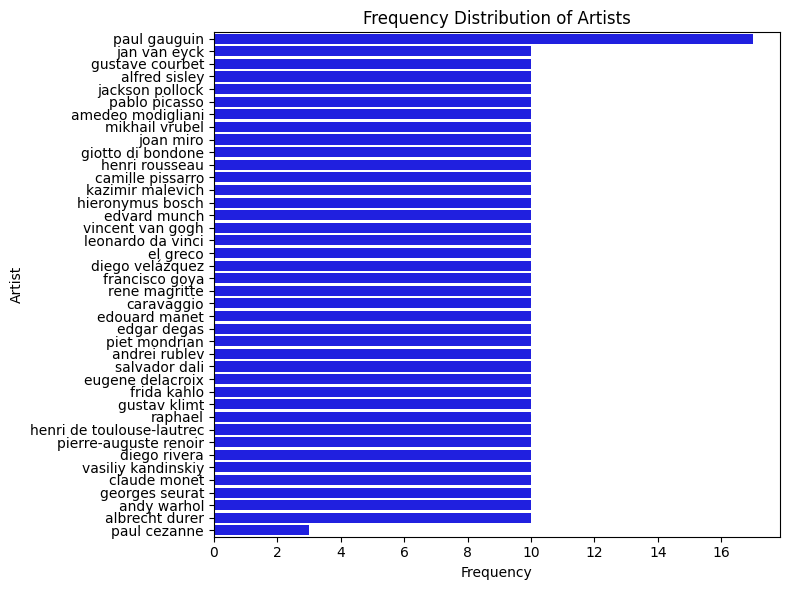

In [ ]:
artist_counts = df['artist'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(8, 6))
sns.barplot(y=artist_counts.index, x=artist_counts.values, color='blue')

plt.ylabel('Artist')
plt.xlabel('Frequency')
plt.title('Frequency Distribution of Artists')
plt.tight_layout()
plt.show()

In [ ]:
subject_counts = df.groupby('subject').size().sort_values(ascending=False)
subject_counts_df = subject_counts.reset_index(name='count')
subject_counts_df

,subject,count
0,portrait,74
1,religious painting,71
2,landscape,62
3,genre painting,41
4,abstract,25
5,still life,22
6,figurative,21
7,self-portrait,11
8,cityscape,11
9,symbolic painting,11


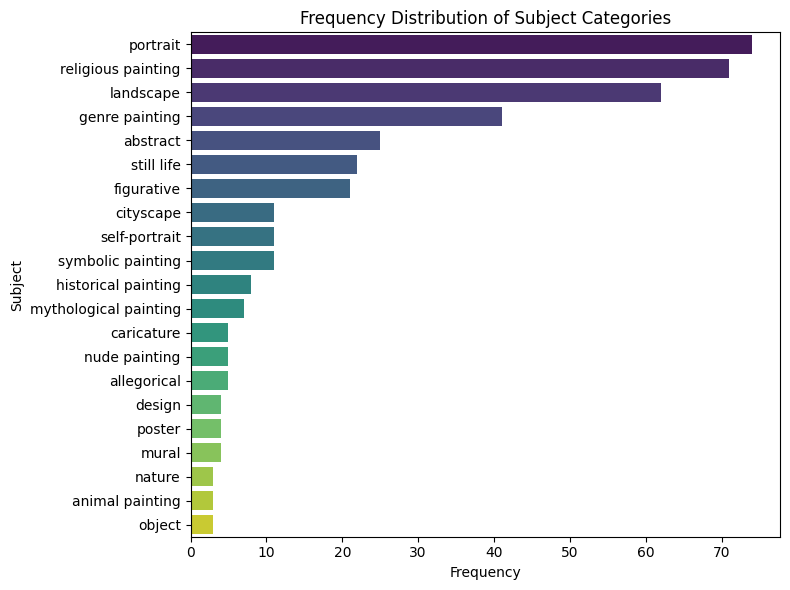

In [ ]:
subject_counts = df['subject'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(y=subject_counts.index, x=subject_counts.values, hue=subject_counts.index, palette='viridis')

plt.ylabel('Subject')
plt.xlabel('Frequency')
plt.title('Frequency Distribution of Subject Categories')
plt.tight_layout()
plt.show()

In [ ]:
style_counts = df.groupby('style').size().sort_values(ascending=False)
style_counts_df = style_counts.reset_index(name='count')
style_counts_df

,style,count
0,impressionism,69
1,post-impressionism,30
2,surrealism,30
3,romanticism,21
4,northern renaissance,20
5,baroque,20
6,primitivism,18
7,realism,18
8,abstract art,18
9,high renaissance,16


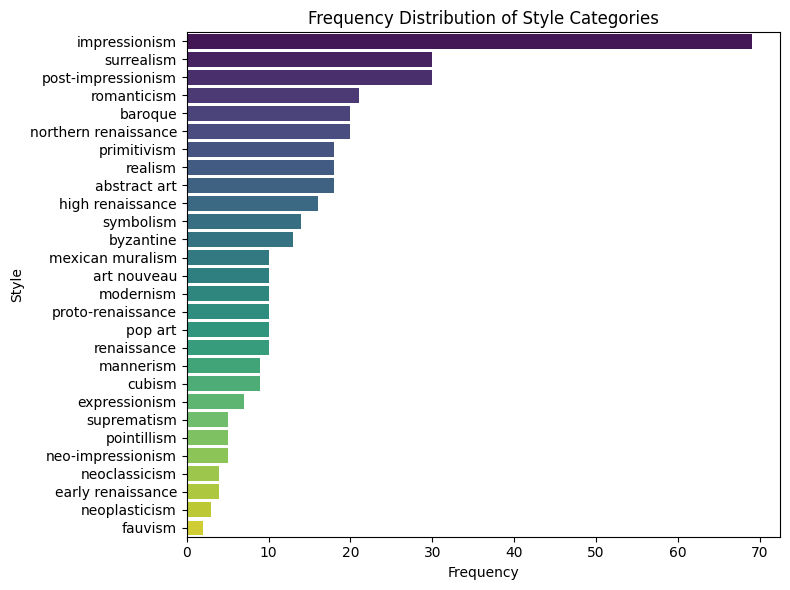

In [ ]:
style_counts = df['style'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(y=style_counts.index, x=style_counts.values, hue=style_counts.index, palette='viridis')

plt.ylabel('Style')
plt.xlabel('Frequency')
plt.title('Frequency Distribution of Style Categories')
plt.tight_layout()
plt.show()

In [ ]:
material_counts = df.groupby('materials').size().sort_values(ascending=False)
material_counts_df = material_counts.reset_index(name='count')
material_counts_df

,materials,count
0,oil on canvas,259
1,oil on panel,48
2,tempera on panel,17
3,fresco,12
4,silkscreen,10
5,watercolor on paper,9
6,etching,7
7,pastel on paper,6
8,oil on cardboard,5
9,engraving,4


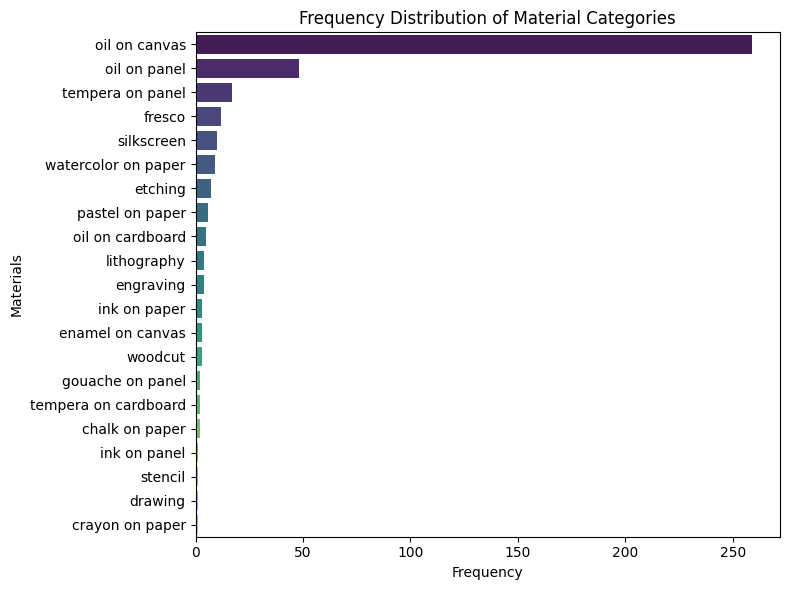

In [ ]:
materials_counts = df['materials'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(y=materials_counts.index, x=materials_counts.values, hue=materials_counts.index, palette='viridis')

plt.ylabel('Materials')
plt.xlabel('Frequency')
plt.title('Frequency Distribution of Material Categories')
plt.tight_layout()
plt.show()

## Creating 'period' column
The `start` and `end` columns, which represent the time period of each painting, are combined into a single column called `'period'`. In more detail, we convert the `start` and `end` values to strings and concatenates them with a hyphen (-) to create a new `'period'` column. Now the dataset has 6 columns left.

<br/>

Then, we group the dataset by the new `'period'` column and count the number of paintings for each time period.

In [ ]:
df['period'] = df['start'].astype(str) + '-' + df['end'].astype(str)
df.head()

,image_path,artist,subject,style,materials,start,end,period
0,/content/drive/My Drive/Colab Notebooks/Projec...,jan van eyck,portrait,northern renaissance,oil on panel,1420,1440,1420-1440
1,/content/drive/My Drive/Colab Notebooks/Projec...,alfred sisley,landscape,impressionism,oil on canvas,1860,1880,1860-1880
2,/content/drive/My Drive/Colab Notebooks/Projec...,gustave courbet,genre painting,realism,oil on canvas,1840,1860,1840-1860
3,/content/drive/My Drive/Colab Notebooks/Projec...,mikhail vrubel,cityscape,symbolism,watercolor on paper,1880,1900,1880-1900
4,/content/drive/My Drive/Colab Notebooks/Projec...,jackson pollock,abstract,abstract art,enamel on canvas,1940,1960,1940-1960


In [ ]:
df = df.drop(columns=['start', 'end'])
print(df.shape)
df.head()

(400, 6)


,image_path,artist,subject,style,materials,period
0,/content/drive/My Drive/Colab Notebooks/Projec...,jan van eyck,portrait,northern renaissance,oil on panel,1420-1440
1,/content/drive/My Drive/Colab Notebooks/Projec...,alfred sisley,landscape,impressionism,oil on canvas,1860-1880
2,/content/drive/My Drive/Colab Notebooks/Projec...,gustave courbet,genre painting,realism,oil on canvas,1840-1860
3,/content/drive/My Drive/Colab Notebooks/Projec...,mikhail vrubel,cityscape,symbolism,watercolor on paper,1880-1900
4,/content/drive/My Drive/Colab Notebooks/Projec...,jackson pollock,abstract,abstract art,enamel on canvas,1940-1960


In [ ]:
yearly_counts = df.groupby('period').size().sort_values(ascending=False)
yearly_counts_df = yearly_counts.reset_index(name='count')
yearly_counts_df

,period,count
0,1880-1900,89
1,1900-1920,63
2,1920-1940,48
3,1860-1880,35
4,1500-1520,25
5,1940-1960,24
6,1960-1980,13
7,1840-1860,12
8,1480-1500,11
9,1600-1620,11


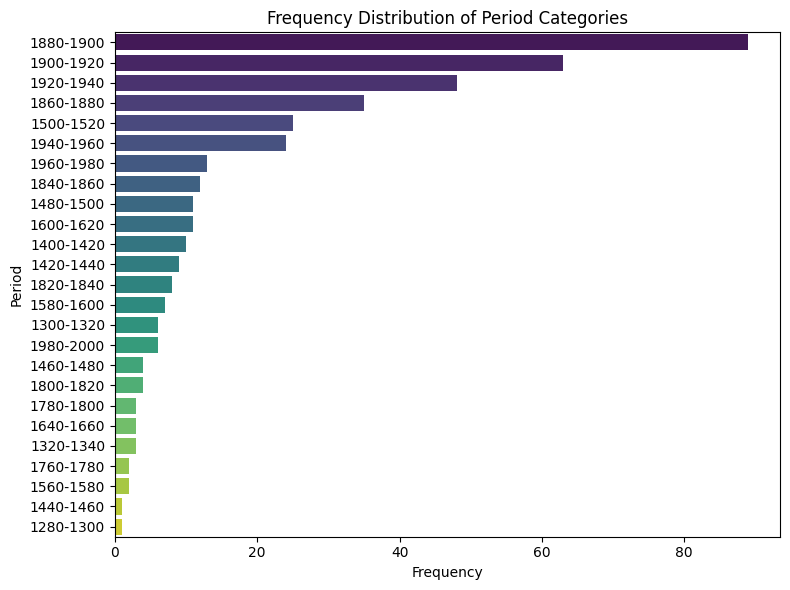

In [ ]:
period_counts = df['period'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(y=period_counts.index, x=period_counts.values, hue=period_counts.index, palette='viridis')

plt.ylabel('Period')
plt.xlabel('Frequency')
plt.title('Frequency Distribution of Period Categories')
plt.tight_layout()
plt.show()

## Encoding Categorical Labels

The `df` is copied into new DataFrames, `label_encoded_df` to ensure that the original data remains unchanged, while the label encoding process is applied to the copied version.

<br/>

   - A dictionary `label_encoders` is created to store `LabelEncoder` objects for each categorical column (`'artist'`, `'subject'`, `'style'`, `'materials'`, and `'period'`).
   - A loop iterates over these categorical columns:
     - For each column, a `LabelEncoder` is initialized (`le = LabelEncoder()`).
     - The `fit_transform()` method is used to encode the unique categorical values in the dataset for that column, converting each category into a numerical label.
     - The trained `LabelEncoder` is stored in the `label_encoders` dictionary, allowing it to be reused if necessary.


In [ ]:
label_encoded_df = df.copy()
label_encoders = {}
for column in ['artist', 'subject', 'style', 'materials', 'period']:
    le = LabelEncoder()
    label_encoded_df[column] = le.fit_transform(label_encoded_df[column])
    label_encoders[column] = le

label_encoded_df.head()

,image_path,artist,subject,style,materials,period
0,/content/drive/My Drive/Colab Notebooks/Projec...,25,15,16,13,4
1,/content/drive/My Drive/Colab Notebooks/Projec...,1,9,9,11,18
2,/content/drive/My Drive/Colab Notebooks/Projec...,20,7,22,11,17
3,/content/drive/My Drive/Colab Notebooks/Projec...,29,4,27,19,19
4,/content/drive/My Drive/Colab Notebooks/Projec...,24,0,0,3,22


## Stratified Splitting

## Creating a stratification column

- The `label_encoded_df` is copied into new DataFrames, `df_strat` to ensure that the original data remains unchanged, while the label stratification process is applied to the copied version.

- A new column `stratify_col` is created by concatenating the values of the `'subject'`, `'style'`, `'materials'`, `'period'`, and `'artist'` columns using `apply` and `lambda` functions.

- This ensures that the data is stratified based on a combination of these five categorical features during the train-test split.

In [ ]:
df_strat = label_encoded_df
df_strat.head()

,image_path,artist,subject,style,materials,period
0,/content/drive/My Drive/Colab Notebooks/Projec...,25,15,16,13,4
1,/content/drive/My Drive/Colab Notebooks/Projec...,1,9,9,11,18
2,/content/drive/My Drive/Colab Notebooks/Projec...,20,7,22,11,17
3,/content/drive/My Drive/Colab Notebooks/Projec...,29,4,27,19,19
4,/content/drive/My Drive/Colab Notebooks/Projec...,24,0,0,3,22


In [ ]:
df_strat['stratify_col'] = df.apply(lambda x: f"{x['artist']}{x['subject']}_{x['style']}_{x['materials']}_{x['period']}", axis=1)

### Identifying rare classes
We count the occurrences of each unique stratification group and calculate how many stratification groups have fewer than 2 occurrences and how many have more than 1, respectively. Then, groups with only 1 occurrence are identified as `rare classes`.

In [ ]:
strat_counts = df_strat['stratify_col'].value_counts()

In [ ]:
rare_classes = strat_counts[strat_counts == 1].index

### Separating rare classes and creating the filtered dataset
In ths part we ensure that the dataset is splitted in a stratified manner based on multiple categorical features.

We extract all rows corresponding to rare classes, which will be used solely in the training set. After that, we filter them out, to create the main dataset that will be split into training and testing sets.

<br/>

A `StratifiedShuffleSplit` object is created with a single split (`n_splits=1`), using 35% of the data as the test set (`test_size=0.35`).
   - The `split.split()` method is used to split the filtered dataset (`df_filtered`) based on the `stratify_col`, ensuring that the training and test sets are stratified according to the combination of categorical features.
   - The resulting training and testing sets are stored in `strat_train_set` and `strat_test_set`.
   - The rare classes (`rare_train_set`) are added back to the training set to ensure no rare samples are lost during the split.

<br/>

Column `stratify_col` is then dropped, as it's no longer needed after the split.

In [ ]:
rare_train_set = df_strat[df_strat['stratify_col'].isin(rare_classes)]
df_filtered = df_strat[~df_strat['stratify_col'].isin(rare_classes)]

In [ ]:
df_filtered = df_filtered.reset_index(drop=True)  # Reset index to start from 0

split = StratifiedShuffleSplit(n_splits=1, test_size=0.35, random_state=42)

for train_index, test_index in split.split(df_filtered, df_filtered['stratify_col']):
    strat_train_set = df_filtered.loc[train_index]
    strat_test_set = df_filtered.loc[test_index]

strat_train_set = pd.concat([strat_train_set, rare_train_set])

### Analyzing label distribution
The distribution of each categorical label in both the training and testing sets is analyzed using `value_counts()` for the following columns:
- `'subject'`
- `'style'`
- `'materials'`
- `'period'`
- `'artist'`

These counts help verify that the stratified splitting process has maintained similar distributions of categories across the train and test sets.

In [ ]:
strat_train_set = strat_train_set.drop('stratify_col', axis=1)
strat_test_set = strat_test_set.drop('stratify_col', axis=1)

print(strat_train_set.shape) ; print(strat_test_set.shape)

print(strat_train_set.columns)
print(strat_test_set.columns)

(321, 6)
(79, 6)
Index(['image_path', 'artist', 'subject', 'style', 'materials', 'period'], dtype='object')
Index(['image_path', 'artist', 'subject', 'style', 'materials', 'period'], dtype='object')


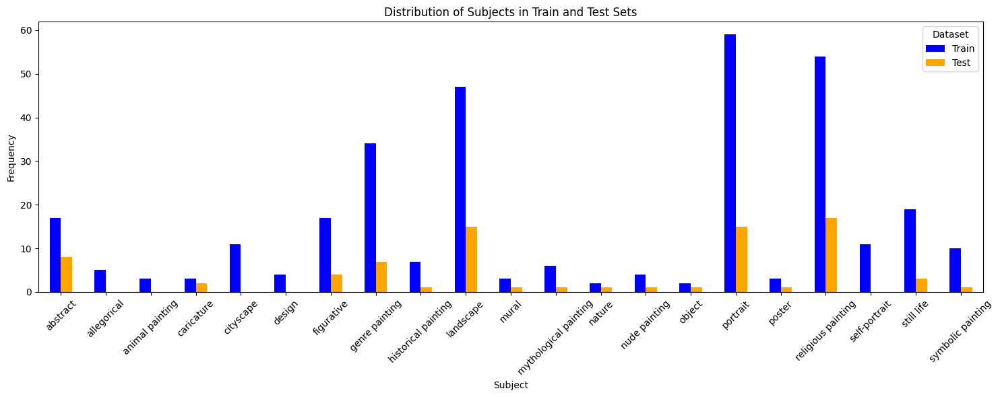

In [ ]:
subject_mapping = {
    15: "portrait",
    17: "religious painting",
    9: "landscape",
    7: "genre painting",
    0: "abstract",
    19: "still life",
    6: "figurative",
    20: "symbolic painting",
    4: "cityscape",
    18: "self-portrait",
    8: "historical painting",
    11: "mythological painting",
    1: "allegorical",
    13: "nude painting",
    3: "caricature",
    16: "poster",
    5: "design",
    10: "mural",
    2: "animal painting",
    12: "nature",
    14: "object"
}

train_counts = strat_train_set['subject'].value_counts()
test_counts = strat_test_set ['subject'].value_counts()

combined_counts = pd.DataFrame({
    'Train': train_counts,
    'Test': test_counts
}).fillna(0)

combined_counts.index = combined_counts.index.map(subject_mapping)

combined_counts.plot(kind='bar', figsize=(15, 6), color=['blue', 'orange'])
plt.title('Distribution of Subjects in Train and Test Sets')
plt.xlabel('Subject')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()

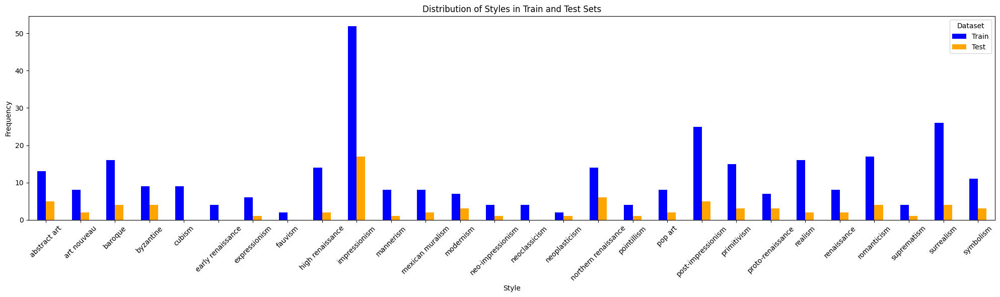

In [ ]:
style_mapping = {
    9: "impressionism",
    19: "post-impressionism",
    26: "surrealism",
    24: "romanticism",
    16: "northern renaissance",
    2: "baroque",
    20: "primitivism",
    22: "realism",
    0: "abstract art",
    8: "high renaissance",
    27: "symbolism",
    3: "byzantine",
    21: "proto-renaissance",
    23: "renaissance",
    1: "art nouveau",
    12: "modernism",
    11: "mexican muralism",
    18: "pop art",
    10: "mannerism",
    4: "cubism",
    6: "expressionism",
    13: "neo-impressionism",
    17: "pointillism",
    25: "suprematism",
    5: "early renaissance",
    14: "neoclassicism",
    15: "neoplasticism",
    7: "fauvism"
}

train_counts = strat_train_set['style'].value_counts()
test_counts = strat_test_set ['style'].value_counts()

combined_counts = pd.DataFrame({
    'Train': train_counts,
    'Test': test_counts
}).fillna(0)

combined_counts.index = combined_counts.index.map(style_mapping)

combined_counts.plot(kind='bar', figsize=(20, 6), color=['blue', 'orange'])
plt.title('Distribution of Styles in Train and Test Sets')
plt.xlabel('Style')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()

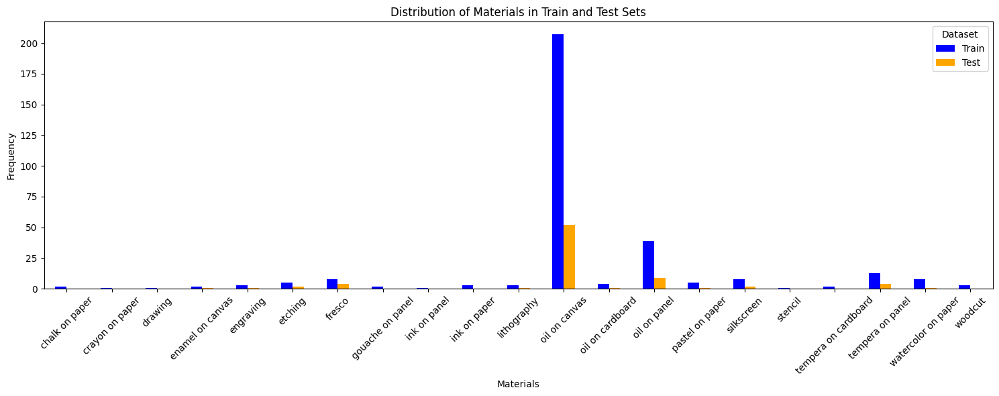

In [ ]:
material_mapping = {
    11: "oil on canvas",
    13: "oil on panel",
    18: "tempera on panel",
    6: "fresco",
    15: "silkscreen",
    19: "watercolor on paper",
    5: "etching",
    14: "pastel on paper",
    12: "oil on cardboard",
    4: "engraving",
    10: "lithography",
    20: "woodcut",
    3: "enamel on canvas",
    9: "ink on paper",
    0: "chalk on paper",
    7: "gouache on panel",
    17: "tempera on cardboard",
    16: "stencil",
    2: "drawing",
    1: "crayon on paper",
    8: "ink on panel"
}

train_counts = strat_train_set['materials'].value_counts()
test_counts = strat_test_set['materials'].value_counts()

combined_counts = pd.DataFrame({
    'Train': train_counts,
    'Test': test_counts
}).fillna(0)

combined_counts.index = combined_counts.index.map(material_mapping)

combined_counts.plot(kind='bar', figsize=(15, 6), color=['blue', 'orange'])
plt.title('Distribution of Materials in Train and Test Sets')
plt.xlabel('Materials')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()

In [ ]:
train_subject_counts = strat_train_set['subject'].value_counts()
train_style_counts = strat_train_set['style'].value_counts()
train_materials_counts = strat_train_set['materials'].value_counts()
train_period_counts = strat_train_set['period'].value_counts()
train_artist_counts = strat_train_set['artist'].value_counts()

test_subject_counts = strat_test_set['subject'].value_counts()
test_style_counts = strat_test_set['style'].value_counts()
test_materials_counts = strat_test_set['materials'].value_counts()
test_period_counts = strat_test_set['period'].value_counts()
test_artist_counts = strat_test_set['artist'].value_counts()

print("Training set subject distribution:")
print(train_subject_counts)
print("\nTest set subject distribution:")
print(test_subject_counts)
print("Training set subject distribution:")
print(train_subject_counts/len(strat_train_set))
print("\nTest set subject distribution:")
print(test_subject_counts/len(strat_test_set))
print("Training set style distribution:")
print(train_style_counts)
print("\nTest set style distribution:")
print(test_style_counts)

Training set subject distribution:
subject
15    59
17    54
9     47
7     34
19    19
0     17
6     17
18    11
4     11
20    10
8      7
11     6
1      5
13     4
5      4
3      3
16     3
2      3
10     3
12     2
14     2
Name: count, dtype: int64

Test set subject distribution:
subject
17    17
9     15
15    15
0      8
7      7
6      4
19     3
3      2
16     1
14     1
12     1
13     1
20     1
8      1
11     1
10     1
Name: count, dtype: int64
Training set subject distribution:
subject
15    0.183801
17    0.168224
9     0.146417
7     0.105919
19    0.059190
0     0.052960
6     0.052960
18    0.034268
4     0.034268
20    0.031153
8     0.021807
11    0.018692
1     0.015576
13    0.012461
5     0.012461
3     0.009346
16    0.009346
2     0.009346
10    0.009346
12    0.006231
14    0.006231
Name: count, dtype: float64

Test set subject distribution:
subject
17    0.215190
9     0.189873
15    0.189873
0     0.101266
7     0.088608
6     0.050633
19    0.037975
3

## Preprocessing Images and Preparing Training/Testing Data for Model Input


### Image Preprocessing Function

The below function reads and preprocesses images from the given `image_path`. The key steps are:
- **Resizing**: The image is resized to the target size of 300x300 pixels.
- **Converting to RGB**: Ensures that all images are in RGB format, which is essential for models that expect three-channel input. This also handles black-and-white images.
- **Normalization**: The pixel values are divided by 255.0, scaling them into the range [0, 1].
- **Shape Check**: The function checks that the image has the expected shape `(300, 300, 3)`. If not, it prints a message and skips that image.
- **Error Handling**: Any exceptions that occur during image processing are caught, and the error details are printed, avoiding crashes.

In [ ]:
def preprocess_image(image_path, target_size=(300, 300)):
    try:
        image = Image.open(image_path)
        image = image.resize(target_size)
        image = image.convert('RGB')
        image = np.array(image) / 255.0
        if image.shape == (300, 300, 3):
            return image
        else:
            print(f"Skipping image at {image_path}: Unexpected shape {image.shape}")
            return None
    except Exception as e:
        print(f"Error processing image at {image_path}: {e}")
        return None

### Applying Image Preprocessing

The `preprocess_image` function is applied to each image in the training and test datasets using `apply()`. The processed image data is stored in a new column, `'Image Data'`.

In [ ]:
strat_train_set.loc[:, 'Image Data'] = strat_train_set['image_path'].apply(preprocess_image)
strat_test_set.loc[:, 'Image Data'] = strat_test_set['image_path'].apply(preprocess_image)

In [ ]:
print(strat_train_set.shape)
strat_train_set.head(5)

(321, 7)


,image_path,artist,subject,style,materials,period,Image Data
75,/content/drive/My Drive/Colab Notebooks/Projec...,18,17,21,18,2,"[[[0.23921568627450981, 0.1607843137254902, 0...."
97,/content/drive/My Drive/Colab Notebooks/Projec...,3,17,3,18,3,"[[[1.0, 0.996078431372549, 0.9568627450980393]..."
38,/content/drive/My Drive/Colab Notebooks/Projec...,2,15,12,11,20,"[[[0.13333333333333333, 0.15294117647058825, 0..."
131,/content/drive/My Drive/Colab Notebooks/Projec...,5,9,9,11,18,"[[[0.796078431372549, 0.8666666666666667, 0.87..."
32,/content/drive/My Drive/Colab Notebooks/Projec...,1,9,9,11,19,"[[[0.611764705882353, 0.6549019607843137, 0.61..."


In [ ]:
len(strat_train_set['Image Data'].iloc[0])

300

### Stacking Image Data into Numpy Arrays

The preprocessed image data is converted into numpy arrays using `np.stack()`:
- `Xtrain`: A stacked numpy array containing all preprocessed training images.
- `Xtest`: A stacked numpy array containing all preprocessed test images.

In [ ]:
Xtrain = np.stack(strat_train_set['Image Data'].values)
Xtest = np.stack(strat_test_set['Image Data'].values)

In [ ]:
print(Xtrain.shape)
print(Xtest.shape)

(321, 300, 300, 3)
(79, 300, 300, 3)


### One-Hot Encoding the Labels

The target labels (artist, subject, style, materials, and period) for both the training and test sets are converted to one-hot encoded arrays using `to_categorical()`:

- The `num_classes` parameter specifies the number of unique categories for each label type, ensuring the output arrays have the correct number of columns.

In [ ]:
ytrain_artist = to_categorical(strat_train_set['artist'],num_classes=40)
ytrain_subject = to_categorical(strat_train_set['subject'], num_classes=21)
ytrain_style = to_categorical(strat_train_set['style'], num_classes=28)
ytrain_materials = to_categorical(strat_train_set['materials'],num_classes=21)
ytrain_period = to_categorical(strat_train_set['period'],num_classes=25)

ytest_artist = to_categorical(strat_test_set['artist'],num_classes=40)
ytest_subject = to_categorical(strat_test_set['subject'], num_classes=21)
ytest_style = to_categorical(strat_test_set['style'], num_classes=28)
ytest_materials = to_categorical(strat_test_set['materials'],num_classes=21)
ytest_period = to_categorical(strat_test_set['period'],num_classes=25)

In [ ]:
print(ytrain_artist.shape)
ytrain_artist

(321, 40)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

Finally, we list the contents of the image folder (`filtered_paintings`) and confirm that the correct number of images are present in the folder.

In [ ]:
image_folder = os.path.join(base_path, 'filtered_paintings')
print(os.listdir(image_folder))
len(os.listdir(image_folder))

['Jan_van_Eyck_73.jpg', 'Alfred_Sisley_145.jpg', 'Gustave_Courbet_31.jpg', 'Mikhail_Vrubel_100.jpg', 'Jackson_Pollock_19.jpg', 'Pablo_Picasso_180.jpg', 'Mikhail_Vrubel_106.jpg', 'Amedeo_Modigliani_148.jpg', 'Joan_Miro_26.jpg', 'Giotto_di_Bondone_2.jpg', 'Henri_Rousseau_38.jpg', 'Gustave_Courbet_13.jpg', 'Paul_Gauguin_117.jpg', 'Camille_Pissarro_22.jpg', 'Pablo_Picasso_3.jpg', 'Kazimir_Malevich_1.jpg', 'Hieronymus_Bosch_128.jpg', 'Kazimir_Malevich_43.jpg', 'Amedeo_Modigliani_134.jpg', 'Giotto_di_Bondone_4.jpg', 'Edvard_Munch_5.jpg', 'Vincent_van_Gogh_179.jpg', 'Leonardo_da_Vinci_62.jpg', 'El_Greco_2.jpg', 'Vincent_van_Gogh_116.jpg', 'Amedeo_Modigliani_150.jpg', 'Gustave_Courbet_6.jpg', 'Diego_Velazquez_104.jpg', 'Francisco_Goya_5.jpg', 'Rene_Magritte_97.jpg', 'Caravaggio_25.jpg', 'Pablo_Picasso_18.jpg', 'Joan_Miro_28.jpg', 'Edouard_Manet_7.jpg', 'Edgar_Degas_7.jpg', 'Piet_Mondrian_69.jpg', 'Andrei_Rublev_10.jpg', 'Salvador_Dali_101.jpg', 'Hieronymus_Bosch_26.jpg', 'Paul_Gauguin_1.jpg', 

400

In [ ]:
image_sizes = []

for filename in os.listdir(image_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):
        image_path = os.path.join(image_folder, filename)
        with Image.open(image_path) as img:
            image_sizes.append(img.size)  # Collect the size of the image as a tuple (width, height)

size_counts = Counter(image_sizes)

size_df = pd.DataFrame(size_counts.items(), columns=['Image Size (Width x Height)', 'Count'])
size_df = size_df.sort_values(by='Count', ascending=False)

size_df.head(5)

,Image Size (Width x Height),Count
134,"(445, 614)",2
304,"(614, 437)",2
237,"(354, 288)",2
138,"(448, 614)",2
154,"(466, 614)",2


### Identifying Grayscale Images in Training and Testing Sets

The below function checks whether a given image is in grayscale format.

- A list comprehension is used to create a list of paths (`train_nonrgb_images`) for images in both the training and testing sets that are identified as grayscale:
   - It iterates over each image path and applies the `is_grayscale` function.
   - The total number of grayscale images in the training set is printed.

<br/>

All images are in RGB format.
The preprocessed data is now ready to be fed into a neural network model.

In [ ]:
def is_grayscale(image_path):
    image = load_img(image_path)
    return image.mode != 'RGB'

In [ ]:
train_nonrgb_images = [path for path in strat_train_set['image_path'] if is_grayscale(path)]
print(f"Number of grayscale images in training set: {len(train_nonrgb_images)}")

Number of grayscale images in training set: 0


In [ ]:
test_nonrgb_images = [path for path in strat_test_set['image_path'] if is_grayscale(path)]
print(f"Number of grayscale images in training set: {len(test_nonrgb_images)}")

Number of grayscale images in training set: 0


## BestEpochTracker

The `BestEpochTracker` class is a custom Keras callback designed to monitor and record the best epoch during model training based on validation accuracy. This class extends the `Callback` class from Keras and provides functionality to track the epoch with the highest average validation accuracy across multiple output metrics.

### Key Methods

- **on_train_begin**:
   - Initializes variables to keep track of the best epoch, the best validation accuracy, and the best parameters.
   - Sets `self.best_epoch` to `-1` and `self.best_val_accuracy` to negative infinity to ensure any observed accuracy will be better.

- **on_epoch_end**:
   - This method is called at the end of each epoch.
   - It retrieves the validation accuracy for each output from the logs.
   - It calculates the average validation accuracy across these outputs.
   - If the calculated validation accuracy exceeds the previous best, it updates the best validation accuracy and records the current epoch as the best epoch.

In [ ]:
class BestEpochTracker(Callback):
    def on_train_begin(self, logs=None):
        self.best_epoch = -1
        self.best_val_accuracy = -float('inf')
        self.best_params = None

    def on_epoch_end(self, epoch, logs=None):
        if logs is not None:
            val_accuracy = np.mean([
                logs.get('val_artist_output_accuracy', 0),
                logs.get('val_subject_output_accuracy', 0),
                logs.get('val_style_output_accuracy', 0),
                logs.get('val_materials_output_accuracy', 0),
                logs.get('val_period_output_accuracy', 0)
            ])

            if val_accuracy > self.best_val_accuracy:
                self.best_val_accuracy = val_accuracy
                self.best_epoch = epoch

best_epoch_tracker = BestEpochTracker()

# EfficientNet B3 Model

## Model Initialization with EfficientNetB3

The following code initializes a model using EfficientNetB3 as the base architecture for a multi-output classification task.

### Base Model Configuration

- **Model**: EfficientNetB3
- **Weights**: Pre-trained on ImageNet (`weights='imagenet'`)
- **Top Layer**: Excluded (`include_top=False`) to allow for custom output layers.
- **Input Shape**: Set to (300, 300, 3) to accommodate input images with a resolution of 300x300 pixels and three color channels (RGB).

In [ ]:
base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(300, 300, 3))

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


### Model Output Layers and Class Count Configuration

This section of code defines the output layers for a multi-output classification model built on top of the EfficientNetB3 base model.

After processing the base model's output through a **Global Average Pooling** layer, we can set up the class counts for each output category and defines the output layers of a multi-output classification model.


In [ ]:
x = base_model.output
x = GlobalAveragePooling2D()(x)

In [ ]:
output_artist = Dense(40, activation='softmax', name='artist_output')(x)
output_subject = Dense(21, activation='softmax', name='subject_output')(x)
output_style = Dense(28, activation='softmax', name='style_output')(x)
output_materials = Dense(21, activation='softmax', name='materials_output')(x)
output_period = Dense(25, activation='softmax', name='period_output')(x)

### Model Construction

The following code defines the final multi-output classification model and freezes the layers of the base model (EfficientNetB3) to prevent them from being trained during the initial training phase.

<br/>

A **Keras Model** is created by specifying the input as the base model's input and the outputs as the custom-defined output layers for artist, subject, style, materials, and period classifications. This model will simultaneously predict multiple labels for each painting.

In [ ]:
eff_model = Model(inputs=base_model.input, outputs=[output_artist, output_subject, output_style, output_materials, output_period])

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

### Model Compilation

- The model is compiled using the **Adam** optimizer.
- **Categorical Crossentropy** is used as the loss function for each output layer. This loss function is appropriate for multi-class classification problems.
- **Accuracy** is specified as the evaluation metric for all output layers to assess the model's performance during training and evaluation.

In [ ]:
eff_model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss={'artist_output': 'categorical_crossentropy',
                        'subject_output': 'categorical_crossentropy',
                        'style_output': 'categorical_crossentropy',
                        'materials_output': 'categorical_crossentropy',
                        'period_output': 'categorical_crossentropy'},
                  metrics={'artist_output': 'accuracy',
                           'subject_output': 'accuracy',
                           'style_output': 'accuracy',
                           'materials_output': 'accuracy',
                           'period_output': 'accuracy'})

#### Layers and Parameters
The model architecture consists of several key layers, including:
- **Conv2D**: Standard convolutional layers that apply filters to the input to extract features.
- **DepthwiseConv2D**: These layers perform depthwise separable convolutions, which apply a single filter per input channel, significantly reducing the number of parameters compared to standard convolutions.
- **GlobalAveragePooling2D**: This layer averages the spatial dimensions, reducing the output to a single value per channel, which helps to summarize the feature maps.

The model has a total of **10,991,030** parameters, of which **207,495** are trainable.

In [ ]:
eff_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 300, 300, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 300, 300, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 300, 300, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 300, 300, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 301, 301, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 150, 150, 40)   │          1,080 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 150, 150, 40)   │            160 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 150, 150, 40)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 150, 150, 40)   │            360 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 150, 150, 40)   │            160 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 150, 150, 40)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 40)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 40)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 10)       │            410 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 10,991,030 (41.93 MB)

 Trainable params: 207,495 (810.53 KB)

 Non-trainable params: 10,783,535 (41.14 MB)

### Model Checkpoint Callback

The `ModelCheckpoint` callback is utilized to save the model weights during training.

- **Parameters**:
  - `save_weights_only` is set to `True`, meaning that only the model weights are saved, not the entire model architecture.
  - `save_best_only`: is set to `True`, so the callback will only save the model weights when the monitored metric has improved.


In [ ]:
eff_checkpoint_dir = '/content/drive/My Drive/eff_model_weights/'
os.makedirs(eff_checkpoint_dir, exist_ok=True)

eff_checkpoint_callback = ModelCheckpoint(
    filepath= os.path.join(eff_checkpoint_dir, 'eff_model_epoch_{epoch:02d}.weights.h5'),
    save_weights_only=True,
    save_best_only=False,
    verbose=1, monitor = "val_loss", mode="min"
)

### One-Hot Encoding of Labels

The training and testing labels for the multiple outputs are one-hot encoded using. Each category has a defined number of unique classes, and the labels are transformed into binary matrices suitable for multi-class classification.

In [ ]:
ytrain_artist = to_categorical(strat_train_set['artist'], num_classes=40)
ytrain_subject = to_categorical(strat_train_set['subject'], num_classes=21)
ytrain_style = to_categorical(strat_train_set['style'], num_classes=28)
ytrain_materials = to_categorical(strat_train_set['materials'], num_classes=21)
ytrain_period = to_categorical(strat_train_set['period'], num_classes=25)

ytest_artist = to_categorical(strat_test_set['artist'], num_classes=40)
ytest_subject = to_categorical(strat_test_set['subject'], num_classes=21)
ytest_style = to_categorical(strat_test_set['style'], num_classes=28)
ytest_materials = to_categorical(strat_test_set['materials'], num_classes=21)
ytest_period = to_categorical(strat_test_set['period'], num_classes=25)

## Custom Data Generator for Image Classification
The code defines a custom data generator class CustomDataGenerator that inherits from Sequence, to generate batches of **augmented images** and corresponding labels for training a deep learning model. This generator inherits from the `Sequence` class, making it compatible with Keras' `fit` and `fit_generator` methods. It enables real-time augmentation of training images and outputs multiple labels for a multi-task learning setup.

The main goal of using this custom data generator is to **prevent overfitting** and **improve the model's performance**. By applying random transformations to the training images, the model is exposed to a wider variety of data points. This helps the model generalize better to unseen data, as it avoids memorizing the specific features of the original training images.

<br/>

- Key Components:
    - **`__init__` Method:** Initializes the generator by setting the images, labels, batch size, and the data augmentation parameters. The indices of the data are stored for shuffling between epochs.
    - **`__len__` Method:** Returns the number of batches per epoch, calculated by dividing the total number of images by the batch size.
    - **`__getitem__` Method:** Generates a batch of images and their corresponding labels. It applies augmentation using `ImageDataGenerator` to each batch and returns both augmented images and the associated labels.
    - **`on_epoch_end` Method:** Shuffles the indices at the end of each epoch if shuffling is enabled, ensuring that the model sees the data in a different order in each epoch.

- Data Augmentation Strategy:
    - **Rotation:** Randomly rotates images within a range of 30 degrees.
    - **Width and Height Shifts:** Translates images horizontally or vertically by up to 20% of the total image width or height.
    - **Zooming:** Randomly zooms images by a factor between 0.8x and 1.2x.
    - **Fill Mode:** Handles pixels created by shifts or rotations using the nearest pixel strategy.
    - **Data Format:** Ensures the image format is in `channels_last`, which is standard for TensorFlow models.


In [ ]:
class CustomDataGenerator(Sequence):
    def __init__(self, images, labels, batch_size, datagen, shuffle=True):
        super().__init__()
        self.images = images
        self.labels = labels
        self.batch_size = batch_size
        self.datagen = datagen
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.images))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_images = self.images[indexes]
        batch_labels = [label[indexes] for label in self.labels]

        gen = self.datagen.flow(batch_images, batch_size=self.batch_size, shuffle=False)
        augmented_images = next(gen)

        return augmented_images, tuple(np.array(label) for label in batch_labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=[0.8, 1.2],
    fill_mode='nearest',
    data_format='channels_last'
)

train_generator = CustomDataGenerator(
    images=Xtrain,
    labels=[ytrain_artist, ytrain_subject, ytrain_style, ytrain_materials, ytrain_period],
    batch_size=32,
    datagen=datagen
)

### Model Training with Data Generator and Callbacks

The model is trained using the custom data generator along with validation data and callbacks to track and save the best model during training.

- Training Process:
    - **`train_generator`:** The `CustomDataGenerator` is used to provide augmented batches of training images and their associated labels during each epoch. The generator ensures real-time data augmentation and efficient memory usage, as only a batch of data is processed at a time.
    - **Validation Data:** The model is validated using the unaugmented test data (`Xtest`) along with the multiple label outputs (`ytest_artist`, `ytest_subject`, `ytest_style`, `ytest_materials`, `ytest_period`). This helps monitor the model's performance on unseen data during training.
    - **Epochs:** The model is trained for 50 epochs, giving it sufficient opportunity to learn.

### Model Training Summary

- **Best Epoch:** 33
- **Training Metrics at Best Epoch:**
  - Artist Accuracy: **0.0493**
  - Materials Accuracy: **0.6764**
  - Period Accuracy: **0.2169**
  - Style Accuracy: **0.1881**
  - Subject Accuracy: **0.2010**

- **Validation Metrics at Best Epoch:**
  - Artist Accuracy: **0.0506**
  - Materials Accuracy: **0.6582**
  - Period Accuracy: **0.2532**
  - Style Accuracy: **0.2152**
  - Subject Accuracy: **0.2785**
  - Loss: **13.0419**



In [ ]:
eff_model.fit(
    train_generator,
    epochs=50,
    validation_data=(Xtest, [ytest_artist, ytest_subject, ytest_style, ytest_materials, ytest_period]),
    callbacks=[eff_checkpoint_callback, best_epoch_tracker]
)

print(f"The best model was found at epoch: {best_epoch_tracker.best_epoch + 1}")

Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - artist_output_accuracy: 0.0139 - loss: 15.5377 - materials_output_accuracy: 0.3514 - period_output_accuracy: 0.0792 - style_output_accuracy: 0.1061 - subject_output_accuracy: 0.1094
Epoch 1: saving model to /content/drive/My Drive/eff_model_weights/eff_model_epoch_01.weights.h5
10/10 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - artist_output_accuracy: 0.0140 - loss: 15.4777 - materials_output_accuracy: 0.3675 - period_output_accuracy: 0.0819 - style_output_accuracy: 0.1095 - subject_output_accuracy: 0.1123 - val_artist_output_accuracy: 0.0380 - val_loss: 13.3029 - val_materials_output_accuracy: 0.6582 - val_period_output_accuracy: 0.2532 - val_style_output_accuracy: 0.2152 - val_subject_output_accuracy: 0.1899
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - artist_output_accuracy: 0.0341 - loss: 13.6103 - materials_output_accuracy: 0.6304 - period_output_accuracy: 0.1988 - style_output_accuracy: 0.1864 - subject_output_accuracy: 0.1727


### Saving and Loading Data Generator

The `datagen` object is saved to a file named `datagen.pkl` using the `pickle` library. This allows us to preserve the state of our data generator and ensure that the same data augmentation parameters are used during both training and evaluation.

Loading the Data Generator: To load the previously saved datagen, we again use the pickle library. This retrieves the datagen object from datagen.pkl, enabling us to continue using it for data augmentation without any additional configuration.
    
Loading Model Weights
After setting up the data generator, we proceed to load the weights of the EfficientNet model. The weights from epoch 07 are loaded into the model using the load_weights method. This ensures that the model is initialized with the learned parameters from the specified training epoch.

This process allows us to effectively save our data preprocessing setup and model training state, enabling model evaluation.

In [ ]:
with open('/content/drive/MyDrive/datagen.pkl', 'rb') as f:
    datagen = pickle.load(f)

In [ ]:
weights_epoch33_path = os.path.join(eff_checkpoint_dir, 'eff_model_epoch_33.weights.h5')

In [ ]:
eff_model.load_weights(weights_epoch33_path)

### Model Evaluation

We first obtain predictions for each output class using the `predict` method of the EfficientNet model. This returns probabilities for each class. Then, the predicted probabilities are converted into class labels using np.argmax, which selects the index of the maximum value for each prediction. Similarly, the true labels for each output class are obtained.

<br/>

Then, we compute confusion matrices for each output class using the confusion_matrix function from sklearn.metrics. This provides insights into the number of correct and incorrect predictions for each class.

<br/>

results = viteff_model_model.evaluate(
    train_generator,
    [ytest_artist2, ytest_subject2, ytest_style2, ytest_materials2, ytest_period2],  
    batch_size=32,
    verbose=1
)

In [ ]:
y_pred_artist, y_pred_subject, y_pred_style, y_pred_materials, y_pred_period = eff_model.predict(Xtest)

3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step


In [ ]:
predictions = eff_model.predict(Xtest)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


In [ ]:
y_pred_artist_classes = np.argmax(y_pred_artist, axis=1)
y_pred_subject_classes = np.argmax(y_pred_subject, axis=1)
y_pred_style_classes = np.argmax(y_pred_style, axis=1)
y_pred_materials_classes = np.argmax(y_pred_materials, axis=1)
y_pred_period_classes = np.argmax(y_pred_period, axis=1)

y_true_artist_classes = np.argmax(ytest_artist, axis=1)
y_true_subject_classes = np.argmax(ytest_subject, axis=1)
y_true_style_classes = np.argmax(ytest_style, axis=1)
y_true_materials_classes = np.argmax(ytest_materials, axis=1)
y_true_period_classes = np.argmax(ytest_period, axis=1)

### Evaluation Results

After evaluating the EfficientNetB3 model on the training data, the following accuracy scores were obtained for each classification task:

- **Total Loss:** 13.0986
- **Artist Output Accuracy:** 4.69%
- **Materials Output Accuracy:** 67.19%
- **Period Output Accuracy:** 20.31%
- **Style Output Accuracy:** 20.31%
- **Subject Output Accuracy:** 20.31%





In [ ]:
datagen = ImageDataGenerator(data_format='channels_last')

test_generator = CustomDataGenerator(
    images=Xtest,
    labels=[ytest_artist, ytest_subject, ytest_style, ytest_materials, ytest_period],
    batch_size=32,
    datagen=datagen
)

results = eff_model.evaluate(
    test_generator,
    batch_size=32,
    verbose=1
)

print(results)

2/2 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - artist_output_accuracy: 0.0521 - loss: 12.9981 - materials_output_accuracy: 0.6771 - period_output_accuracy: 0.1979 - style_output_accuracy: 0.2083 - subject_output_accuracy: 0.1979
[13.098543167114258, 0.046875, 0.671875, 0.203125, 0.203125, 0.203125]


In [ ]:
conf_matrix_artist = confusion_matrix(y_true_artist_classes, y_pred_artist_classes)
conf_matrix_subject = confusion_matrix(y_true_subject_classes, y_pred_subject_classes)
conf_matrix_style = confusion_matrix(y_true_style_classes, y_pred_style_classes)
conf_matrix_materials = confusion_matrix(y_true_materials_classes, y_pred_materials_classes)
conf_matrix_period = confusion_matrix(y_true_period_classes, y_pred_period_classes)

def plot_confusion_matrix(conf_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues')
    plt.title(title)
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

 The confusion matrices show that the model performs better in classifying Materials and Period classification. However, it struggles with distinguishing between artists. The model shows moderate success in Subject and Style classifications, with some correct predictions along the diagonal, though misclassifications still occur frequently.

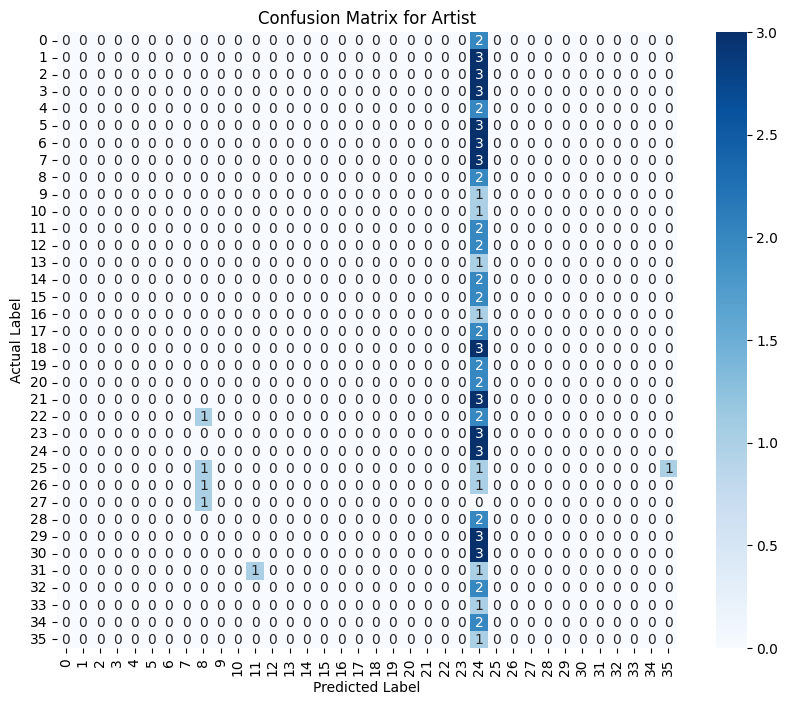

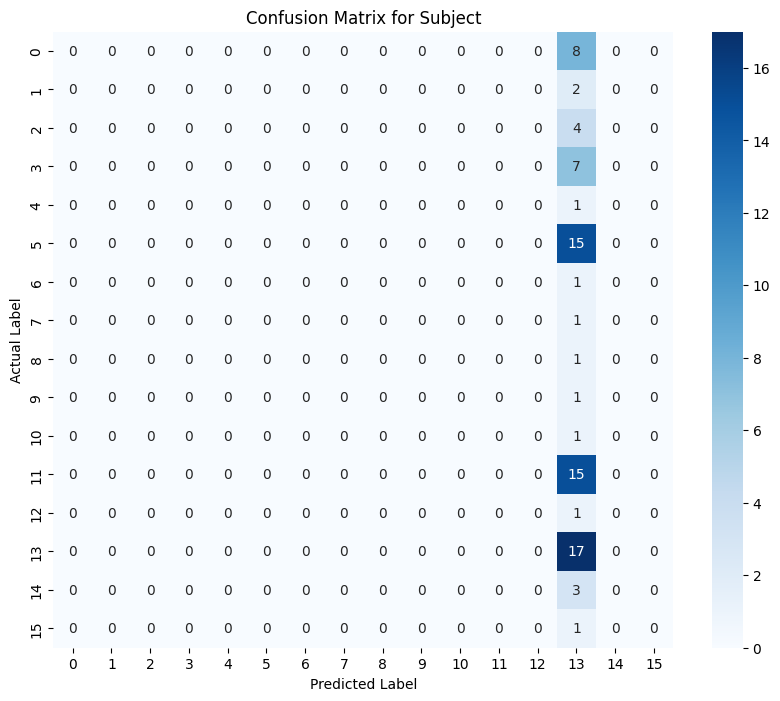

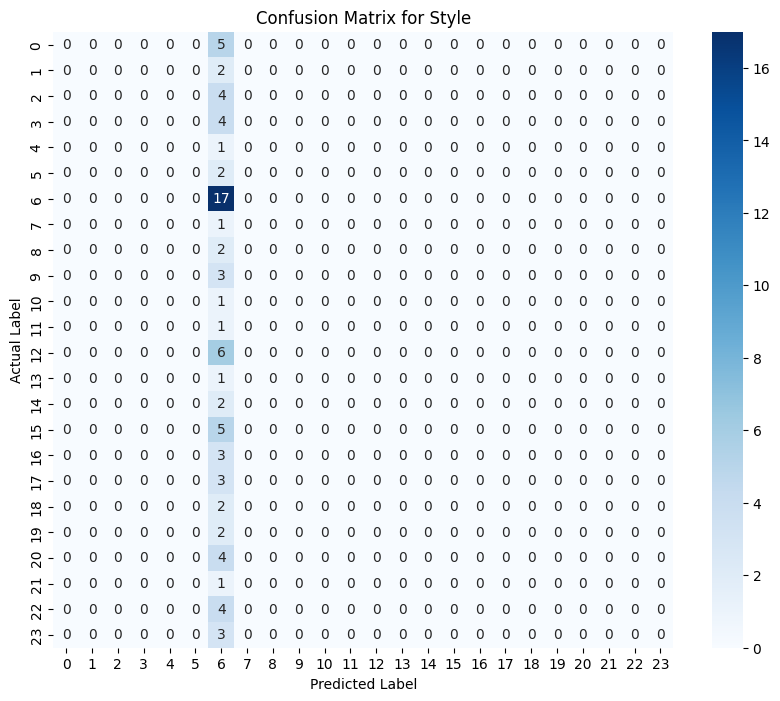

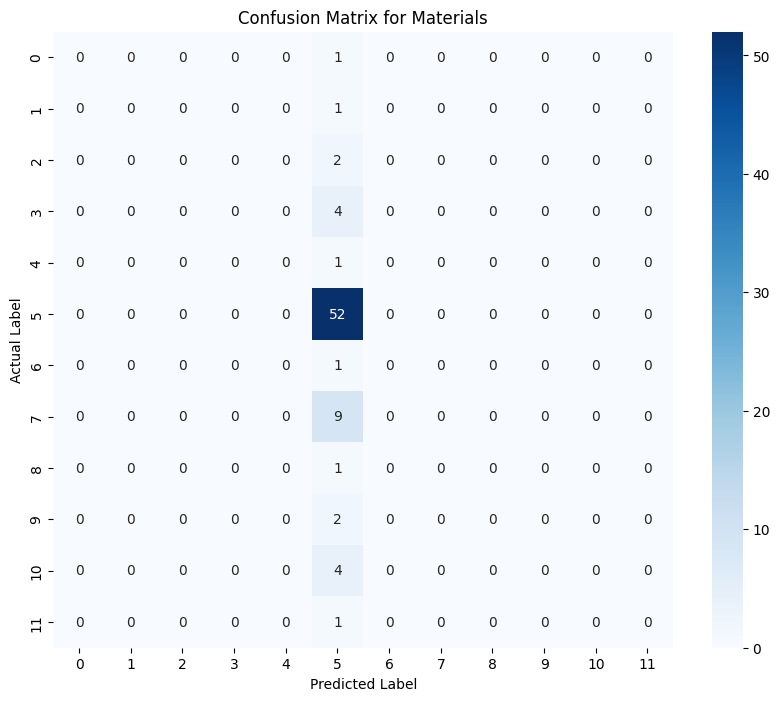

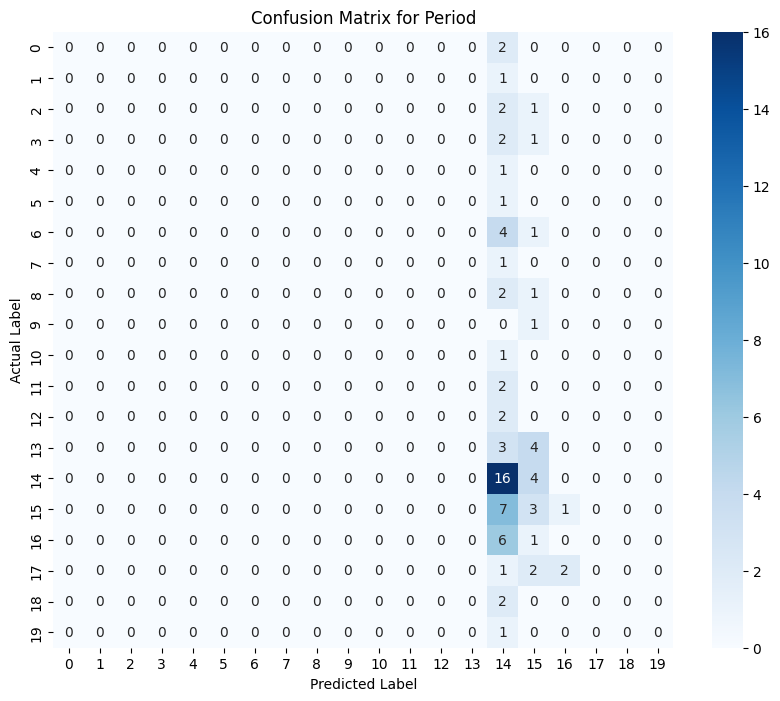

In [ ]:
plot_confusion_matrix(conf_matrix_artist, 'Confusion Matrix for Artist')
plot_confusion_matrix(conf_matrix_subject, 'Confusion Matrix for Subject')
plot_confusion_matrix(conf_matrix_style, 'Confusion Matrix for Style')
plot_confusion_matrix(conf_matrix_materials, 'Confusion Matrix for Materials')
plot_confusion_matrix(conf_matrix_period, 'Confusion Matrix for Period')

In [ ]:
y_pred_artist = np.argmax(predictions[0], axis=1)
y_pred_subject = np.argmax(predictions[1], axis=1)
y_pred_style = np.argmax(predictions[2], axis=1)
y_pred_materials = np.argmax(predictions[3], axis=1)
y_pred_period = np.argmax(predictions[4], axis=1)

In [ ]:
y_true_artist = np.argmax(ytest_artist, axis=1)
y_true_subject = np.argmax(ytest_subject, axis=1)
y_true_style = np.argmax(ytest_style, axis=1)
y_true_materials = np.argmax(ytest_materials, axis=1)
y_true_period = np.argmax(ytest_period, axis=1)

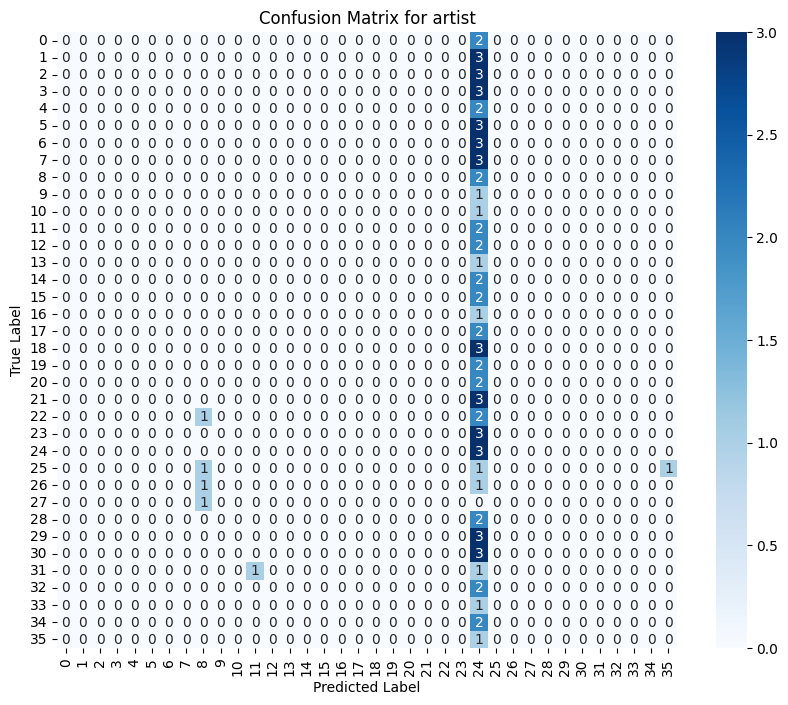

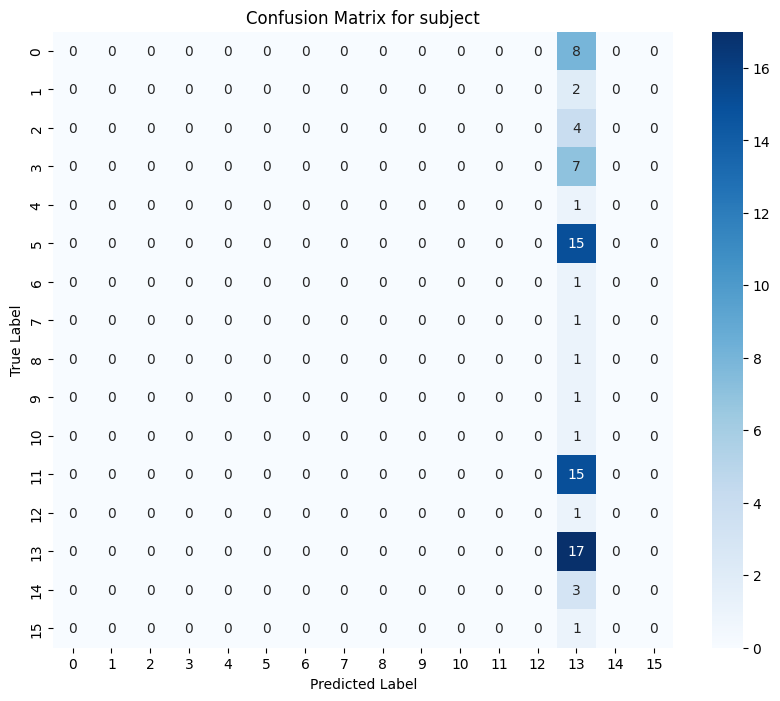

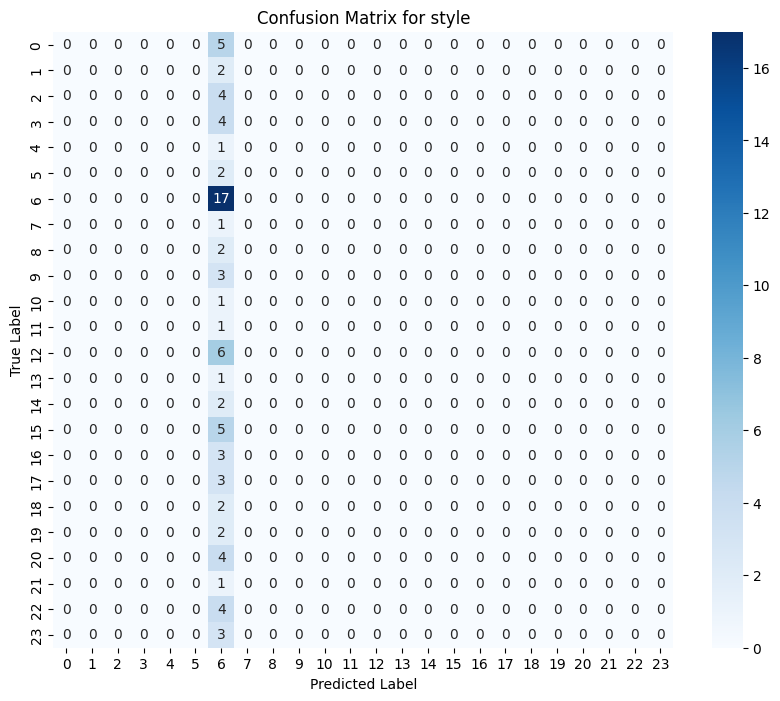

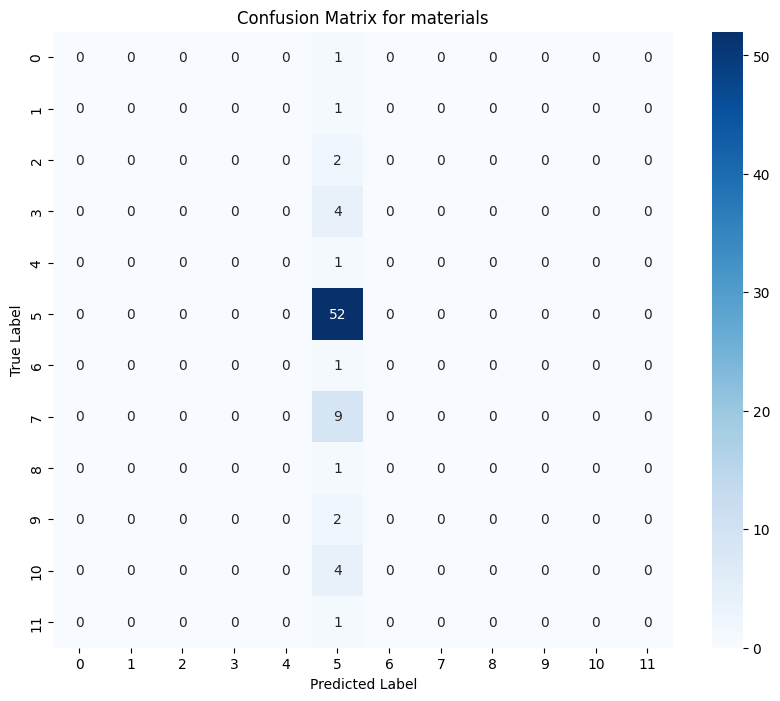

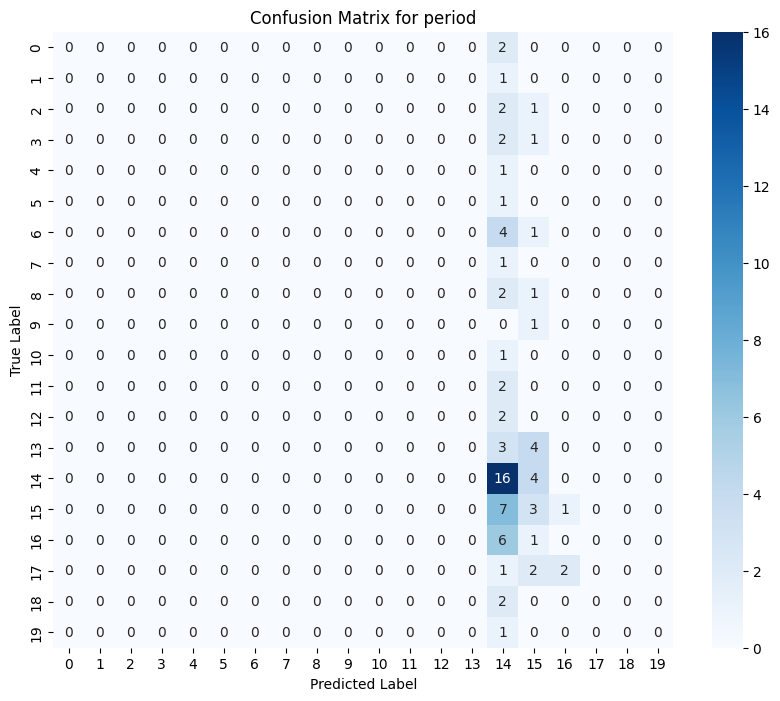

In [ ]:
labels = ['artist', 'subject', 'style', 'materials', 'period']

for i, (y_true, y_pred, label) in enumerate(zip([y_true_artist, y_true_subject, y_true_style, y_true_materials, y_true_period],
                                                [y_pred_artist, y_pred_subject, y_pred_style, y_pred_materials, y_pred_period],
                                                labels)):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {label}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# VGG16 (Visual Geometry Group 16) Model

## Model Initialization with VGG16

The following code initializes a model using VGG16 as the base architecture for a multi-output classification task.

### Base Model Configuration

- **Model**: VGG16
- **Weights**: Pre-trained on ImageNet (`weights='imagenet'`)
- **Top Layer**: Excluded (`include_top=False`) to allow for custom output layers.
- **Input Shape**: Set to (300, 300, 3) to accommodate input images with a resolution of 300x300 pixels and three color channels (RGB).

In [ ]:
vgg16_base_model = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


### Model Output Layers and Class Count Configuration

This section of code defines the output layers for a multi-output classification model built on top of the VGG16 base model.

After processing the base model's output through a **Global Average Pooling** layer, we can set up the class counts for each output category and defines the output layers of a multi-output classification model.

In [ ]:
x16 = vgg16_base_model.output
x16 = GlobalAveragePooling2D()(x16)

In [ ]:
output_artist = Dense(40, activation='softmax', name='artist_output')(x16)
output_subject = Dense(21, activation='softmax', name='subject_output')(x16)
output_style = Dense(28, activation='softmax', name='style_output')(x16)
output_materials = Dense(21, activation='softmax', name='materials_output')(x16)
output_period = Dense(25, activation='softmax', name='period_output')(x16)

### Model Construction

The following code defines the final multi-output classification model and freezes the layers of the base model (VGG16) to prevent them from being trained during the initial training phase.

<br/>

A **Keras Model** is created by specifying the input as the base model's input and the outputs as the custom-defined output layers for artist, subject, style, materials, and period classifications. This model will simultaneously predict multiple labels for each painting.

In [ ]:
vgg16_model = Model(inputs=vgg16_base_model.input, outputs=[output_artist, output_subject, output_style, output_materials, output_period])

In [ ]:
for layer in vgg16_base_model.layers:
    layer.trainable = False

In [ ]:
vgg16_model.compile(optimizer=Adam(),
              loss={'artist_output': 'categorical_crossentropy',
                    'subject_output': 'categorical_crossentropy',
                    'style_output': 'categorical_crossentropy',
                    'materials_output': 'categorical_crossentropy',
                    'period_output': 'categorical_crossentropy'},
              metrics={'artist_output': 'accuracy',
                       'subject_output': 'accuracy',
                       'style_output': 'accuracy',
                       'materials_output': 'accuracy',
                       'period_output': 'accuracy'})

### Layers and Parameters
The VGG16 model architecture consists of several key layers, including:

- **Conv2D:** Standard convolutional layers that apply filters to the input to extract features.
- **MaxPooling2D:** Pooling layers that downsample the feature maps, reducing their spatial dimensions.
- **GlobalAveragePooling2D:** This layer averages the spatial dimensions, reducing the output to a single value per channel, which helps to summarize the feature maps.
- **Dense:** Output layers for multi-class classification tasks.

The model has a total of **14,783,943 parameters**, of which **69,255 are trainable**.


In [ ]:
vgg16_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 300, 300, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 300, 300, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 300, 300, 64)   │         36,928 │ block1_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_pool               │ (None, 150, 150, 64)   │              0 │ block1_conv2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv1 (Conv2D)     │ (None, 150, 150, 128)  │         73,856 │ block1_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv2 (Conv2D)     │ (None, 150, 150, 128)  │        147,584 │ block2_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 75, 75, 128)    │              0 │ block2_conv2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv1 (Conv2D)     │ (None, 75, 75, 256)    │        295,168 │ block2_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv2 (Conv2D)     │ (None, 75, 75, 256)    │        590,080 │ block3_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv3 (Conv2D)     │ (None, 75, 75, 256)    │        590,080 │ block3_conv2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_pool               │ (None, 37, 37, 256)    │              0 │ block3_conv3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv1 (Conv2D)     │ (None, 37, 37, 512)    │      1,180,160 │ block3_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv2 (Conv2D)     │ (None, 37, 37, 512)    │      2,359,808 │ block4_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv3 (Conv2D)     │ (None, 37, 37, 512)    │      2,359,808 │ block4_conv2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_pool               │ (None, 18, 18, 512)    │              0 │ block4_conv3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block5_conv1 (Conv2D)     │ (None, 18, 18, 512)    │      2,359,808 │ block4_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block5_conv2 (Conv2D)     │ (None, 18, 18, 512)    │      2,359,808 │ block5_conv1[0][0]     │
├──────────────────────

 Total params: 14,783,943 (56.40 MB)

 Trainable params: 69,255 (270.53 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
vgg16_checkpoint_dir = '/content/drive/MyDrive/vgg16_model_weights.weights/'
os.makedirs(vgg16_checkpoint_dir, exist_ok=True)

vgg16_checkpoint_callback = ModelCheckpoint(
    filepath= os.path.join(vgg16_checkpoint_dir, 'vgg16_model_epoch_{epoch:02d}.weights.h5'),
    save_weights_only=True,
    save_best_only=False,
    verbose=1, monitor = "val_loss", mode="min"
)

In [ ]:
ytrain_artist = to_categorical(strat_train_set['artist'], num_classes=40)
ytrain_subject = to_categorical(strat_train_set['subject'], num_classes=21)
ytrain_style = to_categorical(strat_train_set['style'], num_classes=28)
ytrain_materials = to_categorical(strat_train_set['materials'], num_classes=21)
ytrain_period = to_categorical(strat_train_set['period'], num_classes=25)

ytest_artist = to_categorical(strat_test_set['artist'], num_classes=40)
ytest_subject = to_categorical(strat_test_set['subject'], num_classes=21)
ytest_style = to_categorical(strat_test_set['style'], num_classes=28)
ytest_materials = to_categorical(strat_test_set['materials'], num_classes=21)
ytest_period = to_categorical(strat_test_set['period'], num_classes=25)

In [ ]:
class CustomDataGenerator(Sequence):
    def __init__(self, images, labels, batch_size, datagen, shuffle=True):
        super().__init__()
        self.images = images
        self.labels = labels
        self.batch_size = batch_size
        self.datagen = datagen
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.images))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_images = self.images[indexes]
        batch_labels = [label[indexes] for label in self.labels]

        gen = self.datagen.flow(batch_images, batch_size=self.batch_size, shuffle=False)
        augmented_images = next(gen)

        return augmented_images, tuple(np.array(label) for label in batch_labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=[0.8, 1.2],
    fill_mode='nearest',
    data_format='channels_last'
)

train_generator = CustomDataGenerator(
    images=Xtrain,
    labels=[ytrain_artist, ytrain_subject, ytrain_style, ytrain_materials, ytrain_period],
    batch_size=32,
    datagen=datagen
)

### Model Training Results Summary

- **Best Epoch:** 47

- **Training Metrics at Best Epoch:**
   - **Artist Output Accuracy**: 0.5620
   - **Materials Output Accuracy**: 0.6329
   - **Period Output Accuracy**: 0.3657
   - **Style Output Accuracy**: 0.3282
   - **Subject Output Accuracy**: 0.4322
  
- **Validation Metrics at Best Epoch:**
  - **Validation Artist Output Accuracy**: 0.3291
  - **Validation Loss**: 10.2141
  - **Validation Materials Output Accuracy**: 0.6582
  - **Validation Period Output Accuracy**: 0.6582
  - **Validation Style Output Accuracy**: 0.3418
  - **Validation Subject Output Accuracy**: 0.5063






In [ ]:
vgg16_model.fit(
    train_generator,
    epochs=50,
    validation_data=(Xtest, [ytest_artist, ytest_subject, ytest_style, ytest_materials, ytest_period]),
    callbacks=[vgg16_checkpoint_callback, best_epoch_tracker]
)

print(f"The best model was found at epoch: {best_epoch_tracker.best_epoch + 1}")

Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - artist_output_accuracy: 0.0183 - loss: 16.3487 - materials_output_accuracy: 0.0610 - period_output_accuracy: 0.0884 - style_output_accuracy: 0.0731 - subject_output_accuracy: 0.0471
Epoch 1: saving model to /content/drive/MyDrive/vgg16_model_weights.weights/vgg16_model_epoch_01.weights.h5
10/10 ━━━━━━━━━━━━━━━━━━━━ 84s 5s/step - artist_output_accuracy: 0.0186 - loss: 16.3038 - materials_output_accuracy: 0.0643 - period_output_accuracy: 0.0949 - style_output_accuracy: 0.0767 - subject_output_accuracy: 0.0493 - val_artist_output_accuracy: 0.0000e+00 - val_loss: 14.6357 - val_materials_output_accuracy: 0.5316 - val_period_output_accuracy: 0.2532 - val_style_output_accuracy: 0.2152 - val_subject_output_accuracy: 0.0886
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step - artist_output_accuracy: 0.0259 - loss: 14.5049 - materials_output_accuracy: 0.4921 - period_output_accuracy: 0.2206 - style_output_accuracy: 0.1461 - subject_output_ac

In [ ]:
with open('/content/drive/MyDrive/datagen.pkl', 'rb') as f:
    datagen = pickle.load(f)

In [ ]:
weights_epoch47_path = os.path.join(vgg16_checkpoint_dir, 'vgg16_model_epoch_47.weights.h5')

In [ ]:
vgg16_model.load_weights(weights_epoch47_path)

### Model Evaluation


In [ ]:
yvgg16_pred_artist, yvgg16_pred_subject, yvgg16_pred_style, yvgg16_pred_materials, yvgg16_pred_period = vgg16_model.predict(Xtest)


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 502ms/step


In [ ]:
yvgg16_pred_artist_classes = np.argmax(yvgg16_pred_artist, axis=1)
yvgg16_pred_subject_classes = np.argmax(yvgg16_pred_subject, axis=1)
yvgg16_pred_style_classes = np.argmax(yvgg16_pred_style, axis=1)
yvgg16_pred_materials_classes = np.argmax(yvgg16_pred_materials, axis=1)
yvgg16_pred_period_classes = np.argmax(yvgg16_pred_period, axis=1)

In [ ]:
y_true_artist_classes = np.argmax(ytest_artist, axis=1)
y_true_subject_classes = np.argmax(ytest_subject, axis=1)
y_true_style_classes = np.argmax(ytest_style, axis=1)
y_true_materials_classes = np.argmax(ytest_materials, axis=1)
y_true_period_classes = np.argmax(ytest_period, axis=1)

### Evaluation Results

The evaluation of the VGG16 model yielded the following accuracy scores for each classification task:

- **Total Loss:** 9.9641
- **Artist Output Accuracy:** 34.38%
- **Materials Output Accuracy:** 68.75%
- **Period Output Accuracy:** 32.81%
- **Style Output Accuracy:** 34.37%
- **Subject Output Accuracy:** 51.56%






In [ ]:
datagen = ImageDataGenerator(data_format='channels_last')

test_generator = CustomDataGenerator(
    images=Xtest,
    labels=[ytest_artist, ytest_subject, ytest_style, ytest_materials, ytest_period],
    batch_size=32,
    datagen=datagen
)

results = vgg16_model.evaluate(
    test_generator,
    batch_size=32,
    verbose=1
)

print(results)

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - artist_output_accuracy: 0.3438 - loss: 9.9221 - materials_output_accuracy: 0.6979 - period_output_accuracy: 0.3125 - style_output_accuracy: 0.3333 - subject_output_accuracy: 0.5000
[9.964058876037598, 0.34375, 0.6875, 0.328125, 0.34375, 0.515625]


In [ ]:
conf_matrix_artist = confusion_matrix(y_true_artist_classes, yvgg16_pred_artist_classes)
conf_matrix_subject = confusion_matrix(y_true_subject_classes, yvgg16_pred_subject_classes)
conf_matrix_style = confusion_matrix(y_true_style_classes, yvgg16_pred_style_classes)
conf_matrix_materials = confusion_matrix(y_true_materials_classes, yvgg16_pred_materials_classes)
conf_matrix_period = confusion_matrix(y_true_period_classes, yvgg16_pred_period_classes)

def plot_confusion_matrix(conf_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues')
    plt.title(title)
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

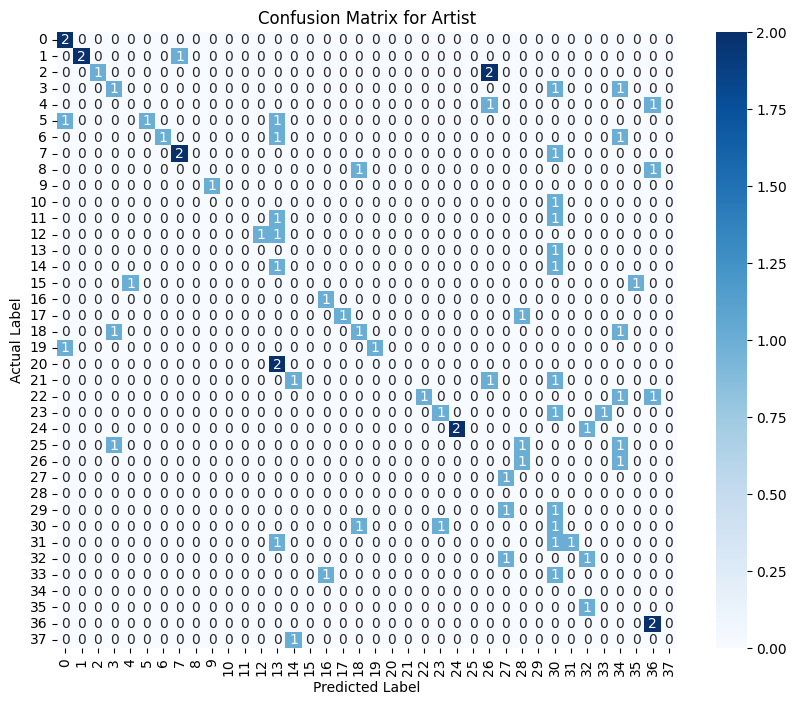

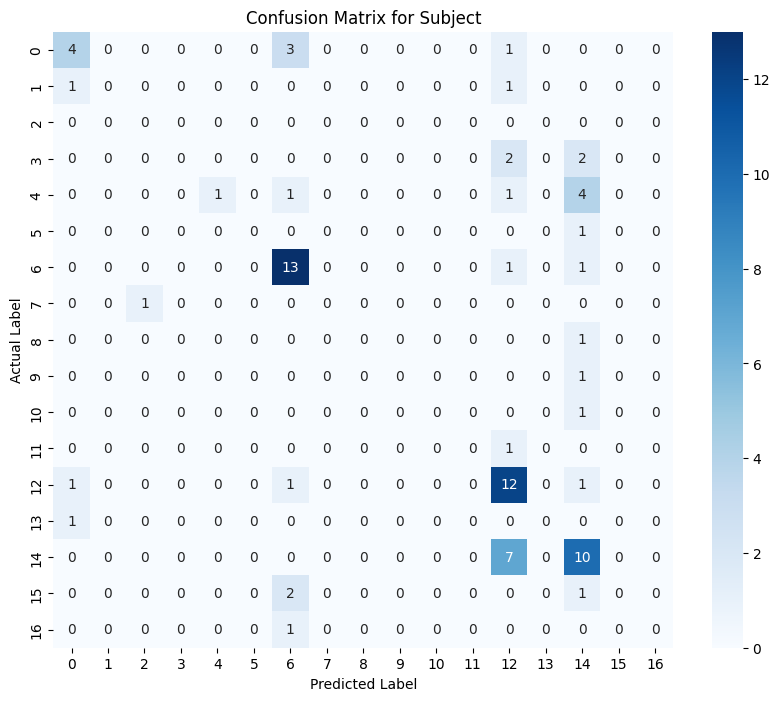

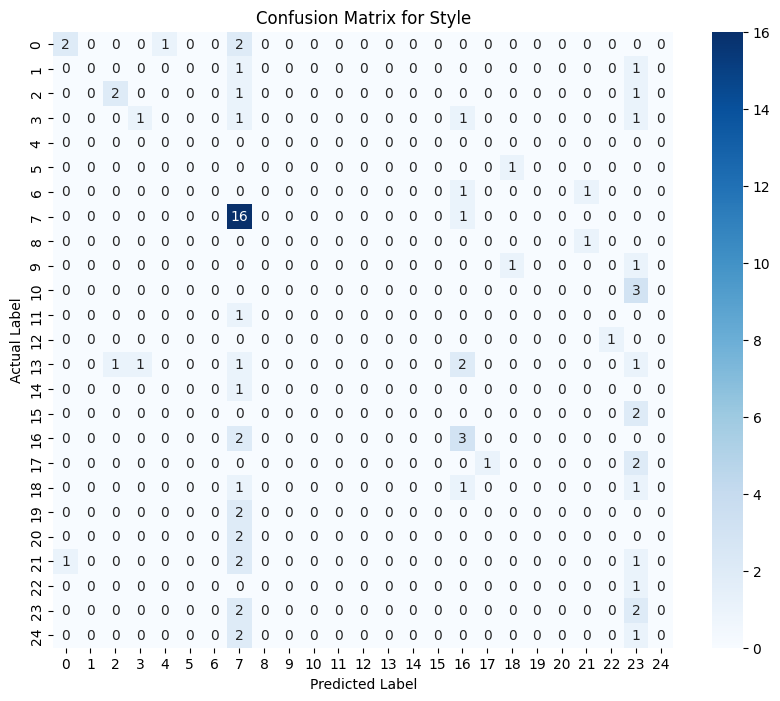

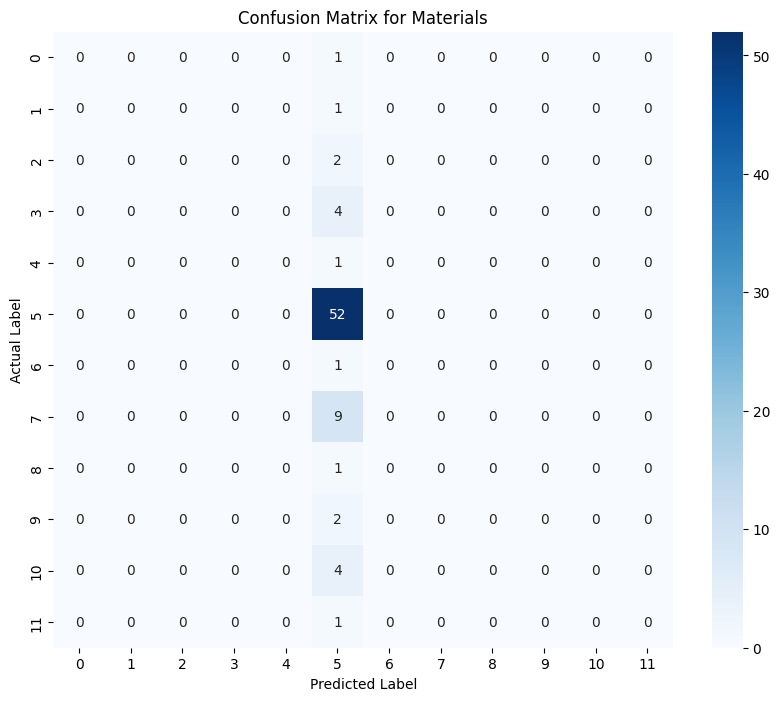

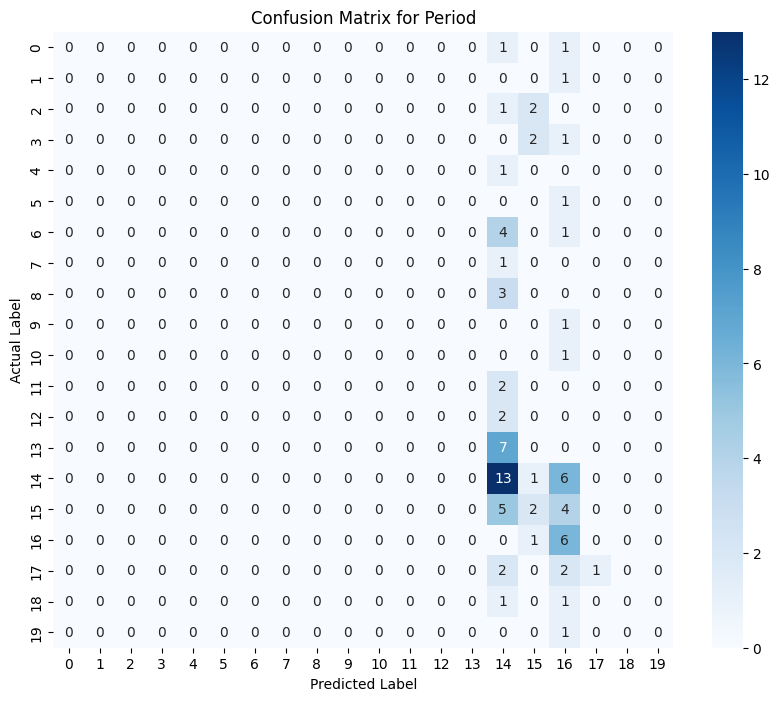

In [ ]:
plot_confusion_matrix(conf_matrix_artist, 'Confusion Matrix for Artist')
plot_confusion_matrix(conf_matrix_subject, 'Confusion Matrix for Subject')
plot_confusion_matrix(conf_matrix_style, 'Confusion Matrix for Style')
plot_confusion_matrix(conf_matrix_materials, 'Confusion Matrix for Materials')
plot_confusion_matrix(conf_matrix_period, 'Confusion Matrix for Period')

In [ ]:
y_pred_artist = np.argmax(predictions[0], axis=1)
y_pred_subject = np.argmax(predictions[1], axis=1)
y_pred_style = np.argmax(predictions[2], axis=1)
y_pred_materials = np.argmax(predictions[3], axis=1)
y_pred_period = np.argmax(predictions[4], axis=1)

In [ ]:
y_true_artist = np.argmax(ytest_artist, axis=1)
y_true_subject = np.argmax(ytest_subject, axis=1)
y_true_style = np.argmax(ytest_style, axis=1)
y_true_materials = np.argmax(ytest_materials, axis=1)
y_true_period = np.argmax(ytest_period, axis=1)

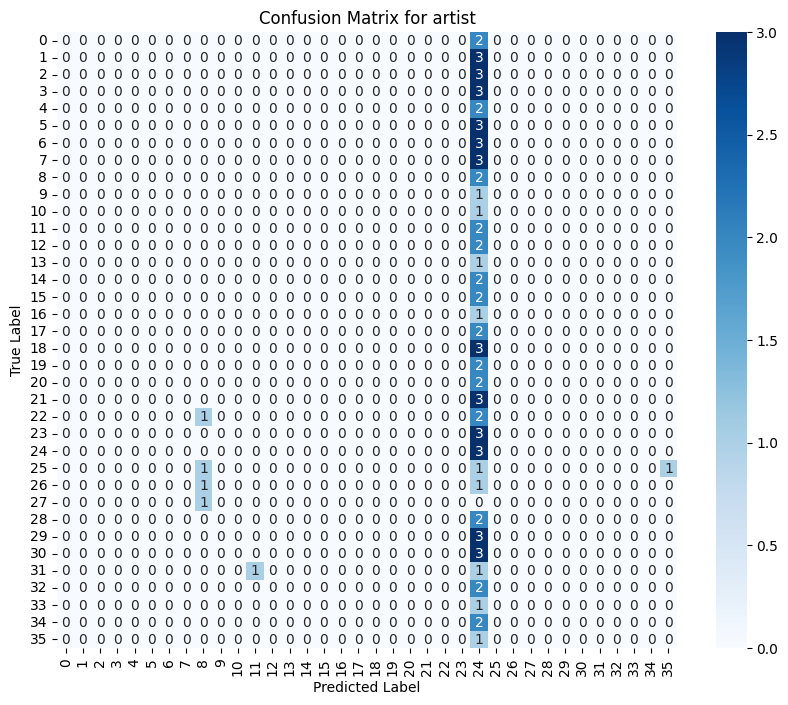

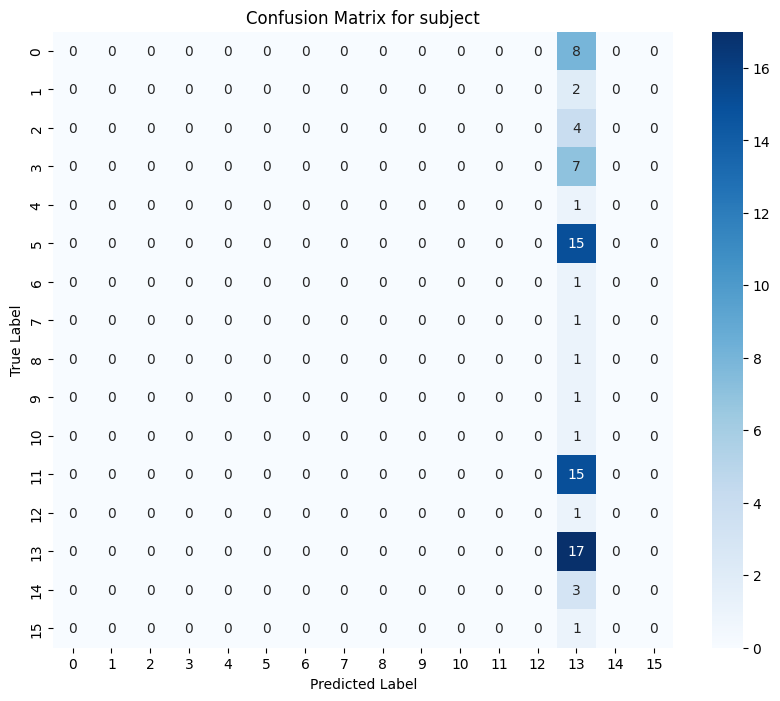

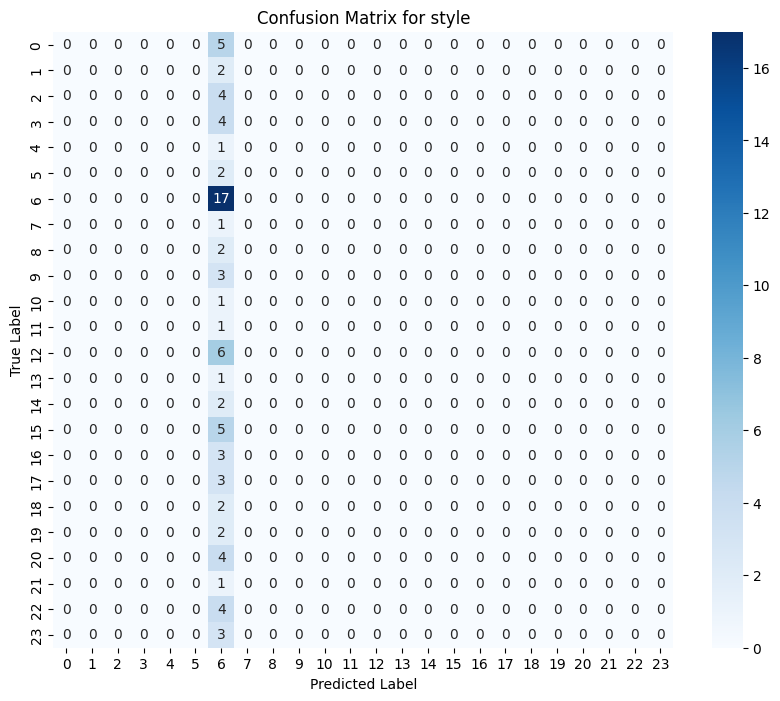

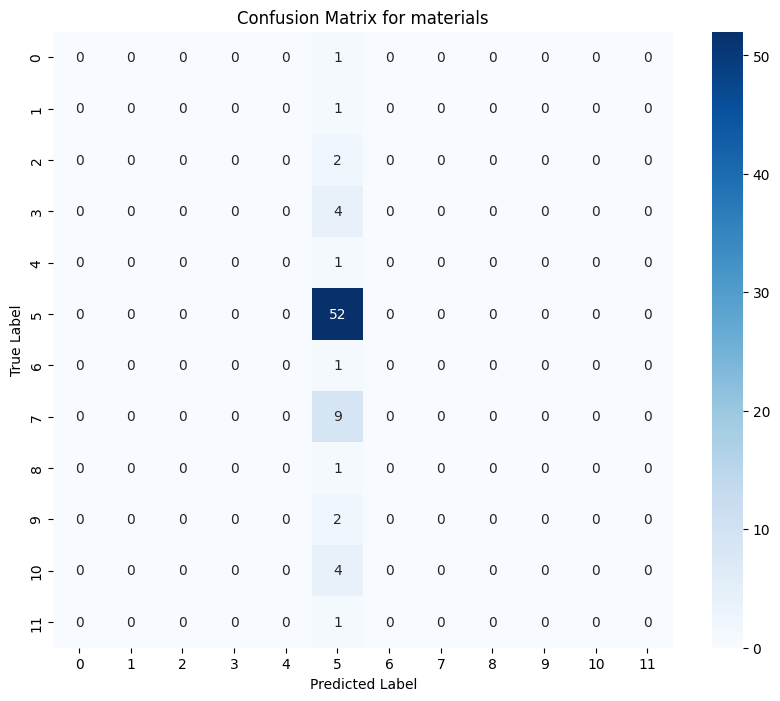

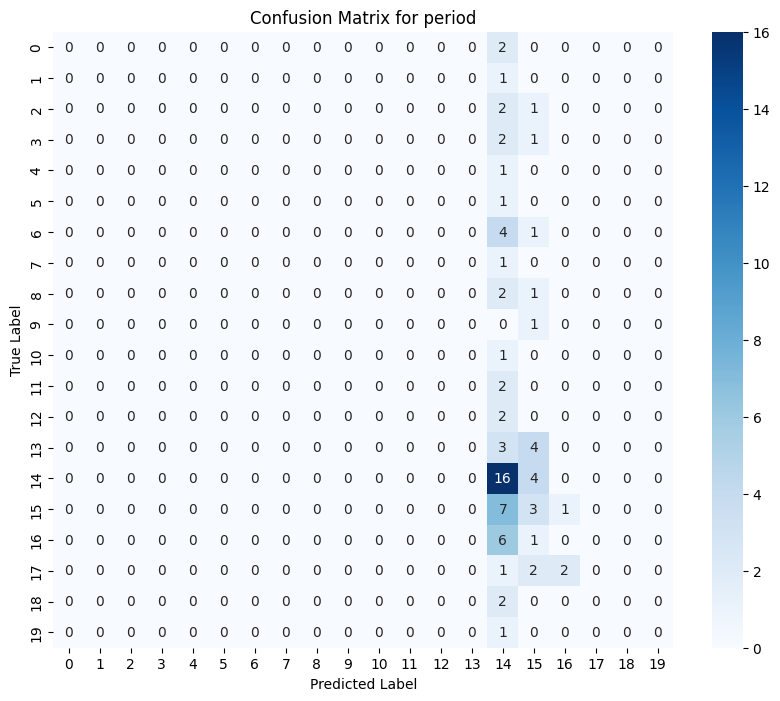

In [ ]:
labels = ['artist', 'subject', 'style', 'materials', 'period']

for i, (y_true, y_pred, label) in enumerate(zip([y_true_artist, y_true_subject, y_true_style, y_true_materials, y_true_period],
                                                [y_pred_artist, y_pred_subject, y_pred_style, y_pred_materials, y_pred_period],
                                                labels)):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {label}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# VGG19 (Visual Geometry Group 19) Model

## Model Initialization with VGG19
The following code initializes a model using VGG16 as the base architecture for a multi-output classification task.

### Base Model Configuration
Model: VGG19
Weights: Pre-trained on ImageNet (weights='imagenet')
Top Layer: Excluded (include_top=False) to allow for custom output layers.
Input Shape: Set to (300, 300, 3) to accommodate input images with a resolution of 300x300 pixels and three color channels (RGB).

In [ ]:
vgg19_base_model = VGG19(weights='imagenet', include_top=False, input_shape=(300, 300, 3))

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


### Model Output Layers and Class Count Configuration

This section of code defines the output layers for a multi-output classification model built on top of the VGG19 base model.

After processing the base model's output through a **Global Average Pooling** layer, we can set up the class counts for each output category and defines the output layers of a multi-output classification model.

In [ ]:
x19 = vgg19_base_model.output
x19 = GlobalAveragePooling2D()(x19)

In [ ]:
output_artist = Dense(40, activation='softmax', name='artist_output')(x19)
output_subject = Dense(21, activation='softmax', name='subject_output')(x19)
output_style = Dense(28, activation='softmax', name='style_output')(x19)
output_materials = Dense(21, activation='softmax', name='materials_output')(x19)
output_period = Dense(25, activation='softmax', name='period_output')(x19)

In [ ]:
vgg19_model = Model(inputs=vgg19_base_model.input, outputs=[output_artist, output_subject, output_style, output_materials, output_period])

In [ ]:
vgg19_model.compile(optimizer=Adam(),
              loss={'artist_output': 'categorical_crossentropy',
                    'subject_output': 'categorical_crossentropy',
                    'style_output': 'categorical_crossentropy',
                    'materials_output': 'categorical_crossentropy',
                    'period_output': 'categorical_crossentropy'},
              metrics={'artist_output': 'accuracy',
                       'subject_output': 'accuracy',
                       'style_output': 'accuracy',
                       'materials_output': 'accuracy',
                       'period_output': 'accuracy'})

### Layers and Parameters
The VGG16 model architecture consists of several key layers, including:

- **Conv2D:** Standard convolutional layers that apply filters to the input to extract features.
- **MaxPooling2D:** Pooling layers that downsample the feature maps, reducing their spatial dimensions.
- **GlobalAveragePooling2D:** This layer averages the spatial dimensions, reducing the output to a single value per channel, which helps to summarize the feature maps.
- **Dense:** Output layers for multi-class classification tasks.

The model has a total of **20,093,639 parameters**, all of which are trainable.


In [ ]:
vgg19_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 300, 300, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 300, 300, 64)   │          1,792 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 300, 300, 64)   │         36,928 │ block1_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_pool               │ (None, 150, 150, 64)   │              0 │ block1_conv2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv1 (Conv2D)     │ (None, 150, 150, 128)  │         73,856 │ block1_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv2 (Conv2D)     │ (None, 150, 150, 128)  │        147,584 │ block2_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 75, 75, 128)    │              0 │ block2_conv2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv1 (Conv2D)     │ (None, 75, 75, 256)    │        295,168 │ block2_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv2 (Conv2D)     │ (None, 75, 75, 256)    │        590,080 │ block3_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv3 (Conv2D)     │ (None, 75, 75, 256)    │        590,080 │ block3_conv2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_conv4 (Conv2D)     │ (None, 75, 75, 256)    │        590,080 │ block3_conv3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block3_pool               │ (None, 37, 37, 256)    │              0 │ block3_conv4[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv1 (Conv2D)     │ (None, 37, 37, 512)    │      1,180,160 │ block3_pool[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv2 (Conv2D)     │ (None, 37, 37, 512)    │      2,359,808 │ block4_conv1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv3 (Conv2D)     │ (None, 37, 37, 512)    │      2,359,808 │ block4_conv2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_conv4 (Conv2D)     │ (None, 37, 37, 512)    │      2,359,808 │ block4_conv3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block4_pool               │ (None, 18, 18, 512)    │              0 │ block4_conv4[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 20,093,639 (76.65 MB)

 Trainable params: 20,093,639 (76.65 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
vgg19_checkpoint_dir = '/content/drive/MyDrive/vgg19_model_weights/'
os.makedirs(vgg19_checkpoint_dir, exist_ok=True)


vgg19_checkpoint_callback = ModelCheckpoint(
    filepath= os.path.join(vgg19_checkpoint_dir, 'vgg19_model_epoch_{epoch:02d}.weights.h5'),
    save_weights_only=True,
    save_best_only=False,
    verbose=1, monitor = "val_loss", mode="min"
)

In [ ]:
ytrain_artist = to_categorical(strat_train_set['artist'], num_classes=40)
ytrain_subject = to_categorical(strat_train_set['subject'], num_classes=21)
ytrain_style = to_categorical(strat_train_set['style'], num_classes=28)
ytrain_materials = to_categorical(strat_train_set['materials'], num_classes=21)
ytrain_period = to_categorical(strat_train_set['period'], num_classes=25)

ytest_artist = to_categorical(strat_test_set['artist'], num_classes=40)
ytest_subject = to_categorical(strat_test_set['subject'], num_classes=21)
ytest_style = to_categorical(strat_test_set['style'], num_classes=28)
ytest_materials = to_categorical(strat_test_set['materials'], num_classes=21)
ytest_period = to_categorical(strat_test_set['period'], num_classes=25)

In [ ]:
class CustomDataGenerator(Sequence):
    def __init__(self, images, labels, batch_size, datagen, shuffle=True):
        super().__init__()
        self.images = images
        self.labels = labels
        self.batch_size = batch_size
        self.datagen = datagen
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.images))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_images = self.images[indexes]
        batch_labels = [label[indexes] for label in self.labels]

        gen = self.datagen.flow(batch_images, batch_size=self.batch_size, shuffle=False)
        augmented_images = next(gen)

        return augmented_images, tuple(np.array(label) for label in batch_labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=[0.8, 1.2],
    fill_mode='nearest',
    data_format='channels_last'
)

train_generator = CustomDataGenerator(
    images=Xtrain,
    labels=[ytrain_artist, ytrain_subject, ytrain_style, ytrain_materials, ytrain_period],
    batch_size=32,
    datagen=datagen
)

### Model Training Results Summary

- **Best Epoch:** 49

- **Training Metrics at Best Epoch:**
   - **Artist Output Accuracy**: 0.1405
   - **Materials Output Accuracy**: 0.6776
   - **Period Output Accuracy**: 0.2568
   - **Style Output Accuracy**: 0.2266
   - **Subject Output Accuracy**: 0.3130
  
- **Validation Metrics at Best Epoch:**
  - **Validation Artist Output Accuracy**: 0.1139
  - **Validation Loss**: 12.1937
  - **Validation Materials Output Accuracy**: 0.6709
  - **Validation Period Output Accuracy**: 0.2658
  - **Validation Style Output Accuracy**: 0.2911
  - **Validation Subject Output Accuracy**: 0.4177




In [ ]:
vgg19_model.fit(
    train_generator,
    epochs=50,
    validation_data=(Xtest, [ytest_artist, ytest_subject, ytest_style, ytest_materials, ytest_period]),
    callbacks=[vgg19_checkpoint_callback, best_epoch_tracker]
)

print(f"The best model was found at epoch: {best_epoch_tracker.best_epoch + 1}")

Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - artist_output_accuracy: 0.0281 - loss: 277.7330 - materials_output_accuracy: 0.2430 - period_output_accuracy: 0.0749 - style_output_accuracy: 0.0510 - subject_output_accuracy: 0.1180
Epoch 1: saving model to /content/drive/MyDrive/vgg19_model_weights/vgg19_model_epoch_01.weights.h5
10/10 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - artist_output_accuracy: 0.0275 - loss: 266.2510 - materials_output_accuracy: 0.2621 - period_output_accuracy: 0.0789 - style_output_accuracy: 0.0532 - subject_output_accuracy: 0.1172 - val_artist_output_accuracy: 0.0380 - val_loss: 14.3791 - val_materials_output_accuracy: 0.6582 - val_period_output_accuracy: 0.2532 - val_style_output_accuracy: 0.2152 - val_subject_output_accuracy: 0.1899
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - artist_output_accuracy: 0.0288 - loss: 14.3362 - materials_output_accuracy: 0.6620 - period_output_accuracy: 0.1942 - style_output_accuracy: 0.1789 - subject_output_accuracy: 0.1332


In [ ]:
with open('/content/drive/MyDrive/datagen.pkl', 'rb') as f:
    datagen = pickle.load(f)

In [ ]:
weights_epoch49_path = os.path.join(vgg19_checkpoint_dir, 'vgg19_model_epoch_49.weights.h5')

In [ ]:
vgg19_model.load_weights(weights_epoch49_path)

### Model Evaluation

In [ ]:
yvgg19_pred_artist, yvgg19_pred_subject, yvgg19_pred_style, yvgg19_pred_materials, yvgg19_pred_period = vgg19_model.predict(Xtest)

2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 522ms/step


In [ ]:
yvgg19_pred_artist_classes = np.argmax(yvgg19_pred_artist, axis=1)
yvgg19_pred_subject_classes = np.argmax(yvgg19_pred_subject, axis=1)
yvgg19_pred_style_classes = np.argmax(yvgg19_pred_style, axis=1)
yvgg19_pred_materials_classes = np.argmax(yvgg19_pred_materials, axis=1)
yvgg19_pred_period_classes = np.argmax(yvgg19_pred_period, axis=1)

In [ ]:
y_true_artist_classes = np.argmax(ytest_artist, axis=1)
y_true_subject_classes = np.argmax(ytest_subject, axis=1)
y_true_style_classes = np.argmax(ytest_style, axis=1)
y_true_materials_classes = np.argmax(ytest_materials, axis=1)
y_true_period_classes = np.argmax(ytest_period, axis=1)

### Evaluation Results

The evaluation of the VGG19 model yielded the following accuracy scores for each classification task:

- **Total Loss:** 12.3073
- **Artist Output Accuracy:** 10.93%
- **Materials Output Accuracy:** 70.31%
- **Period Output Accuracy:** 23.43%
- **Style Output Accuracy:** 28.12%
- **Subject Output Accuracy:** 40.62%








In [ ]:
datagen = ImageDataGenerator(data_format='channels_last')

test_generator = CustomDataGenerator(
    images=Xtest,
    labels=[ytest_artist, ytest_subject, ytest_style, ytest_materials, ytest_period],
    batch_size=32,
    datagen=datagen
)

results = vgg19_model.evaluate(
    test_generator,
    batch_size=32,
    verbose=1
)

print(results)

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 298ms/step - artist_output_accuracy: 0.0833 - loss: 12.6129 - materials_output_accuracy: 0.6979 - period_output_accuracy: 0.2396 - style_output_accuracy: 0.2812 - subject_output_accuracy: 0.3958
[12.307352066040039, 0.109375, 0.703125, 0.234375, 0.28125, 0.40625]


In [ ]:
conf_matrix_artist = confusion_matrix(y_true_artist_classes, yvgg19_pred_artist_classes)
conf_matrix_subject = confusion_matrix(y_true_subject_classes, yvgg19_pred_subject_classes)
conf_matrix_style = confusion_matrix(y_true_style_classes, yvgg19_pred_style_classes)
conf_matrix_materials = confusion_matrix(y_true_materials_classes, yvgg19_pred_materials_classes)
conf_matrix_period = confusion_matrix(y_true_period_classes, yvgg19_pred_period_classes)

def plot_confusion_matrix(conf_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues')
    plt.title(title)
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

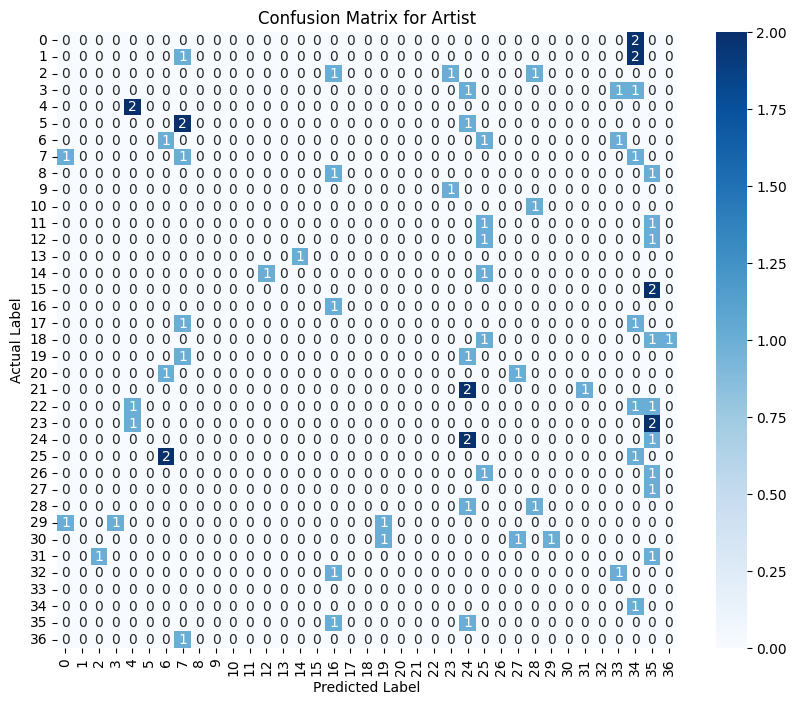

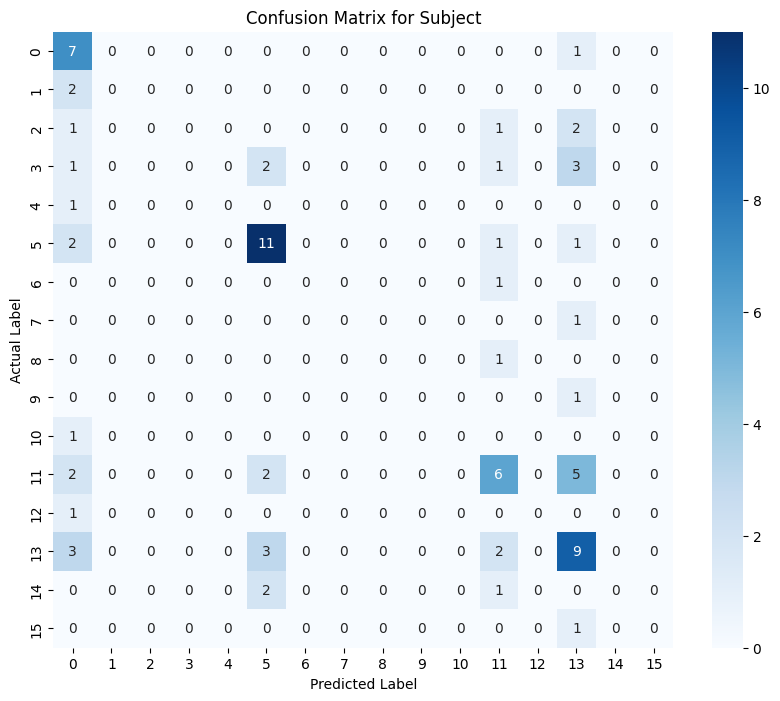

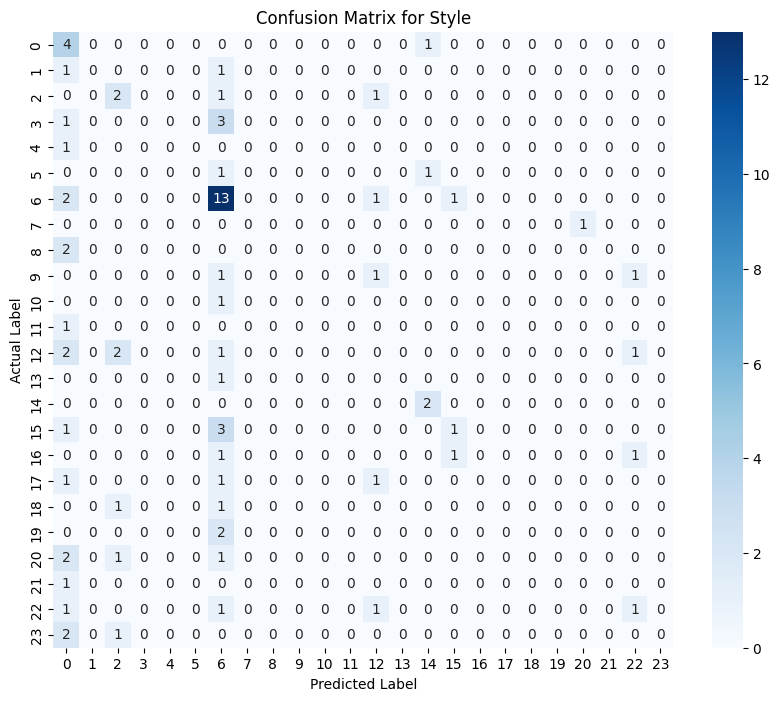

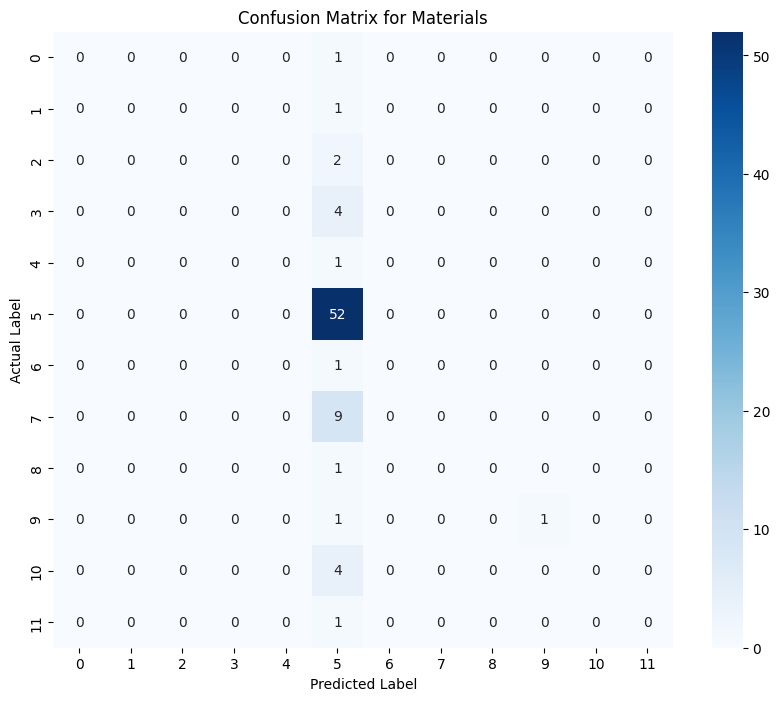

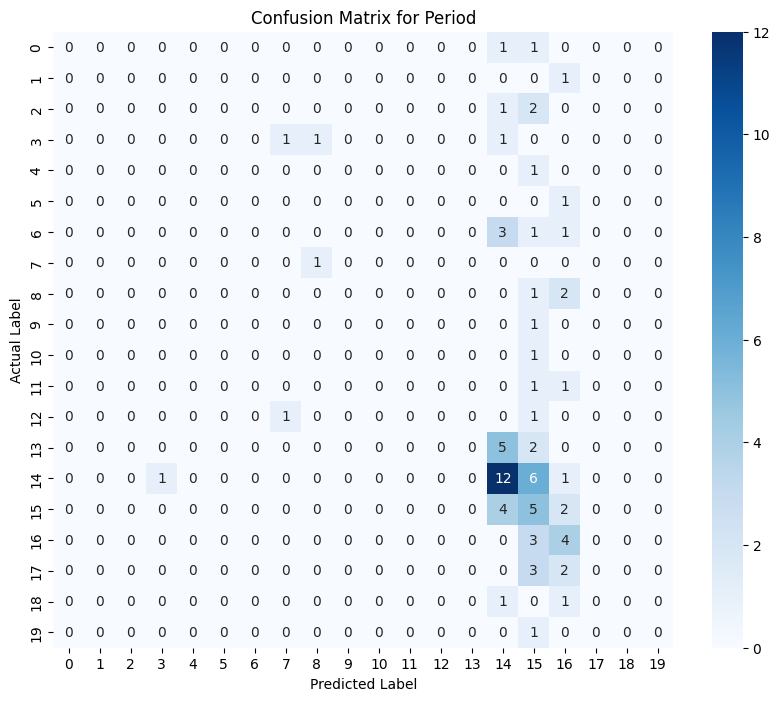

In [ ]:
plot_confusion_matrix(conf_matrix_artist, 'Confusion Matrix for Artist')
plot_confusion_matrix(conf_matrix_subject, 'Confusion Matrix for Subject')
plot_confusion_matrix(conf_matrix_style, 'Confusion Matrix for Style')
plot_confusion_matrix(conf_matrix_materials, 'Confusion Matrix for Materials')
plot_confusion_matrix(conf_matrix_period, 'Confusion Matrix for Period')

In [ ]:
y_pred_artist = np.argmax(predictions[0], axis=1)
y_pred_subject = np.argmax(predictions[1], axis=1)
y_pred_style = np.argmax(predictions[2], axis=1)
y_pred_materials = np.argmax(predictions[3], axis=1)
y_pred_period = np.argmax(predictions[4], axis=1)

In [ ]:
y_true_artist = np.argmax(ytest_artist, axis=1)
y_true_subject = np.argmax(ytest_subject, axis=1)
y_true_style = np.argmax(ytest_style, axis=1)
y_true_materials = np.argmax(ytest_materials, axis=1)
y_true_period = np.argmax(ytest_period, axis=1)

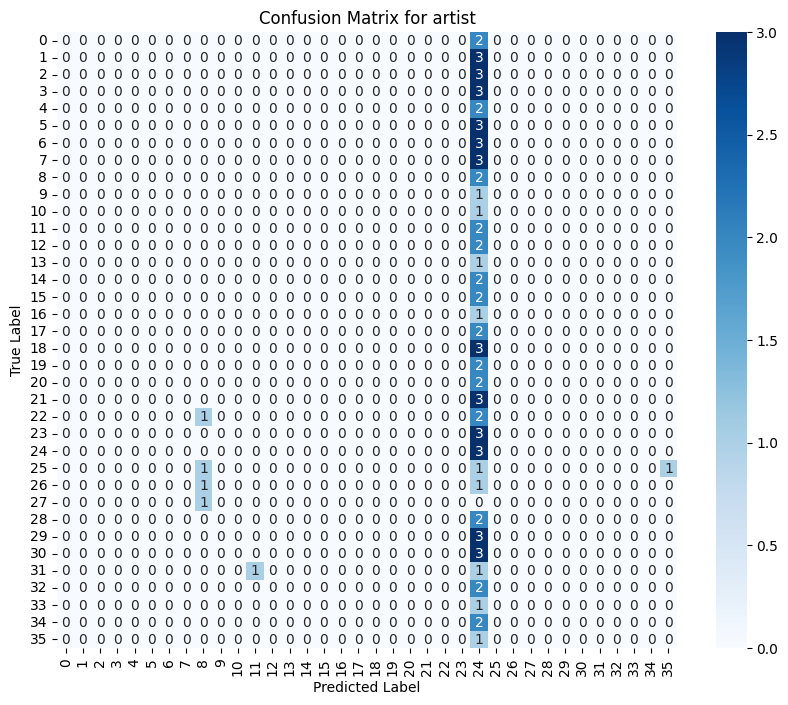

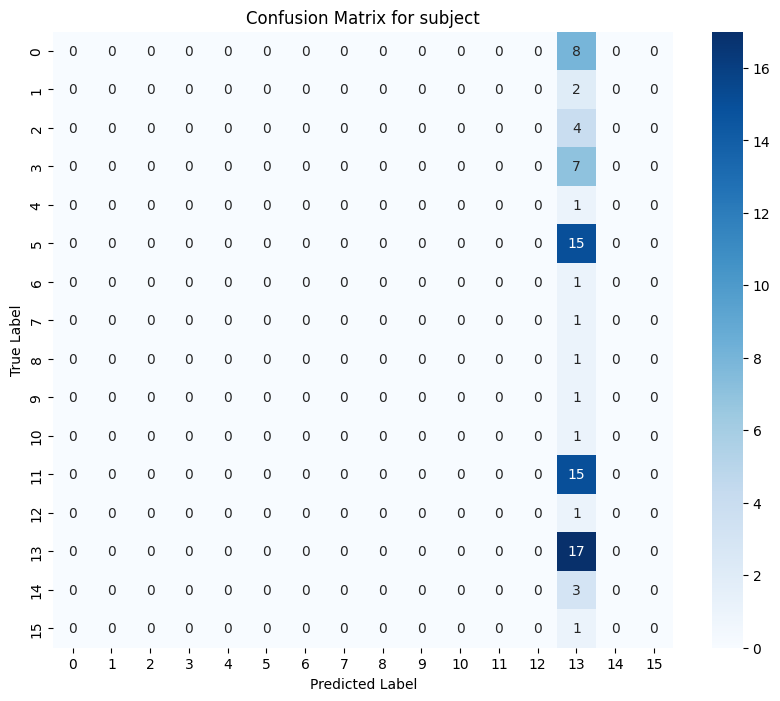

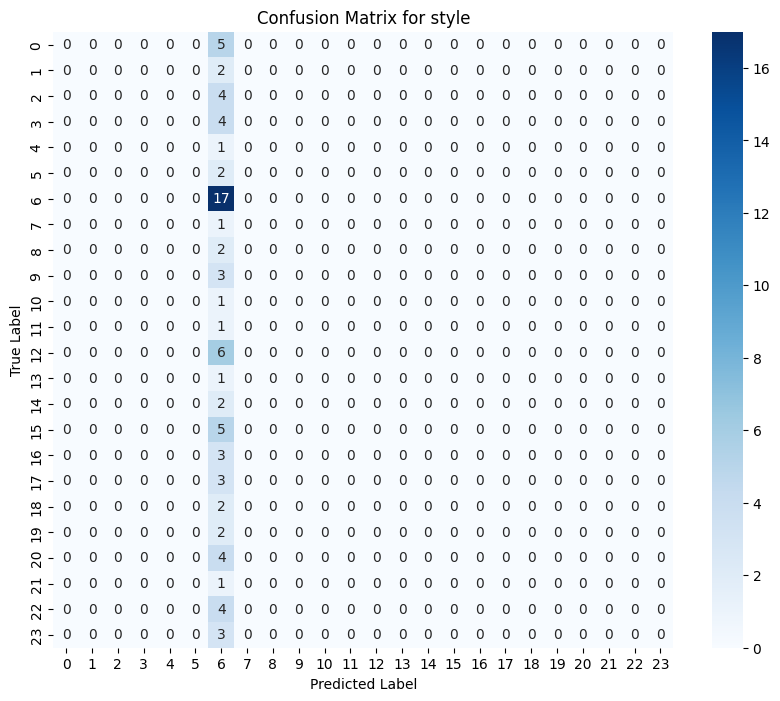

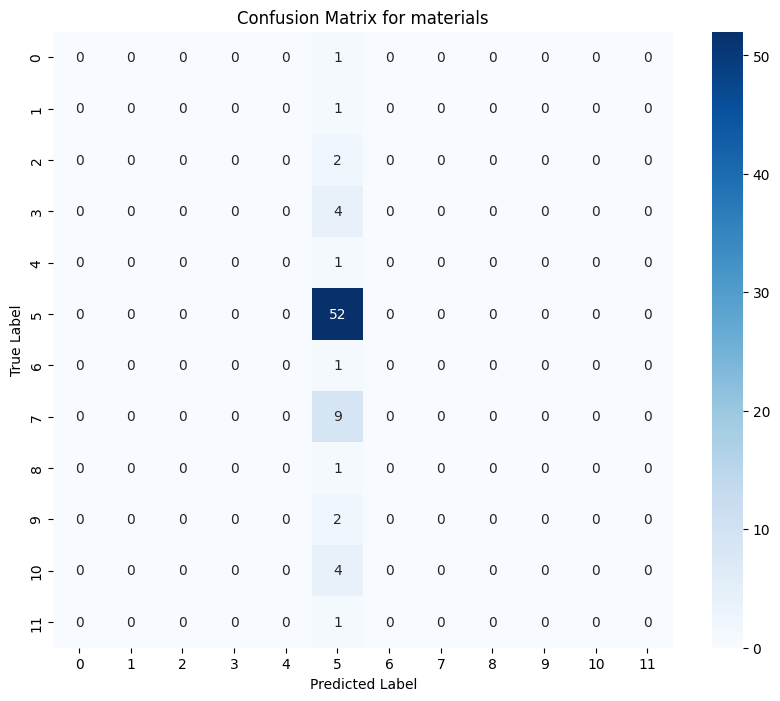

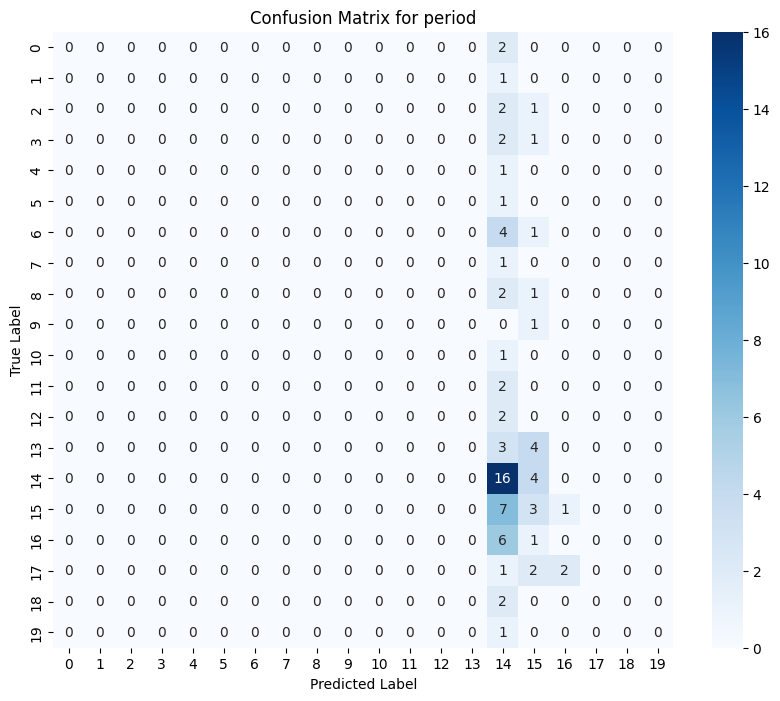

In [ ]:
labels = ['artist', 'subject', 'style', 'materials', 'period']

for i, (y_true, y_pred, label) in enumerate(zip([y_true_artist, y_true_subject, y_true_style, y_true_materials, y_true_period],
                                                [y_pred_artist, y_pred_subject, y_pred_style, y_pred_materials, y_pred_period],
                                                labels)):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {label}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# ViT (Vision Transformer Model) Model

## Importing Transformers and Feature Extractor

- **Transformers Library**: The code imports `TFAutoModel` from the `transformers` library, which allows for the use of various pretrained transformer models in TensorFlow.

- **Feature Extractor**:
  - **`ViTImageProcessor`**: An instance of the ViT (Vision Transformer) image processor is created using the `from_pretrained` method.
  - **Pretrained Model**: The model `google/vit-base-patch16-224-in21k` is specified, which refers to a Vision Transformer model pretrained on the ImageNet-21k dataset.
  
This feature extractor will be used to preprocess images for input into the Vision Transformer model.


In [ ]:
from transformers import TFAutoModel

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


### Image Preprocessing Function

The function `preprocess_image` is designed to preprocess images for model input.

- Resizes the image to the `target_size`.
- Converts the image is in RGB format.
- Converts the image to a NumPy array and scales the pixel values to the range `[0, 1]` by dividing by `255.0`.

If an error occurs during processing, it prints an error message and returns `None`.
This function is essential for preparing images for input into a machine learning model.

In [ ]:
def preprocess_image(image_path, target_size=(224, 224)):
    try:
        image = Image.open(image_path)
        image = image.resize(target_size)
        image = image.convert('RGB')
        image = np.array(image) / 255.0
        if image.shape == (224, 224, 3):
            return image
    except Exception as e:
        print(f"Error processing image at {image_path}: {e}")
        return None

### Data Preparation for Model Training


### Image Preprocessing
- `strat_train_set2` and `test_label_encoded2` are created as copies of the original label-encoded DataFrames.
- The 'Image Data' column in both training and test DataFrames is populated by applying the `preprocess_image` function to the 'image_path' column. This function preprocesses each image for input into the model.

In [ ]:
strat_train_set2 =strat_train_set.copy()
strat_test_set2 = strat_test_set.copy()

In [ ]:
strat_train_set2.columns

Index(['image_path', 'artist', 'subject', 'style', 'materials', 'period',
       'Image Data'],
      dtype='object')

In [ ]:
strat_train_set2['Image Data'].head(5)

,Image Data
75,"[[[0.23921568627450981, 0.1607843137254902, 0...."
97,"[[[1.0, 0.996078431372549, 0.9568627450980393]..."
38,"[[[0.13333333333333333, 0.15294117647058825, 0..."
131,"[[[0.796078431372549, 0.8666666666666667, 0.87..."
32,"[[[0.611764705882353, 0.6549019607843137, 0.61..."


In [ ]:
strat_train_set2.loc[:, 'Image Data'] = strat_train_set2['image_path'].apply(preprocess_image)
strat_test_set2.loc[:, 'Image Data'] = strat_test_set2['image_path'].apply(preprocess_image)

#### Stacking Preprocessed Images
   - The preprocessed image arrays from the 'Image Data' column are stacked into NumPy arrays `Xtrain2` and `Xtest2`.

In [ ]:
Xtrain2 = np.stack(strat_train_set2['Image Data'].values)
Xtest2 = np.stack(strat_test_set2['Image Data'].values)

#### Feature Extraction
- The `ViTImageProcessor` from Hugging Face's Transformers library is used to preprocess the images further, converting them into a format suitable for the Vision Transformer model.
- The output tensors, `Xtrain_preprocessed` and `Xtest_preprocessed`, contain the pixel values of the images.

In [ ]:
Xtrain_preprocessed = feature_extractor(images=Xtrain2, return_tensors="pt", do_rescale=False)['pixel_values']
Xtest_preprocessed = feature_extractor(images=Xtest2, return_tensors="pt",do_rescale=False)['pixel_values']

#### Output Shape
- The shape of the preprocessed training data, `(321, 3, 224, 224)`, indicates there are 321 images, with each image represented by 3 color channels (RGB) and resized to 224x224 pixels.

In [ ]:
print(Xtrain_preprocessed.shape)

torch.Size([321, 3, 224, 224])


### Model Initialization

- **Loading the Vision Transformer Model**:
  - The `vit_base_model` is initialized by loading the pre-trained Vision Transformer (ViT) model using the `TFAutoModel` class from the Hugging Face Transformers library.
  - The specific model used is `"google/vit-base-patch16-224-in21k"`, which has been pre-trained on the ImageNet dataset and is suitable for image classification tasks.


In [ ]:
vit_base_model = TFAutoModel.from_pretrained("google/vit-base-patch16-224-in21k")

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


### Custom Vision Transformer Layer

A class named `CustomViTLayer` is created, inheriting from `tf.keras.layers.Layer`. This custom layer is designed to wrap the Vision Transformer (ViT) model for integration into a Keras model.

In [ ]:
class CustomViTLayer(tf.keras.layers.Layer):
      def __init__(self, vit_model):
        super(CustomViTLayer, self).__init__()
        self.vit_model = vit_model

      def call(self, inputs):
        outputs = self.vit_model(inputs)
        return outputs.last_hidden_state[:, 0]

### Input Layer and Vision Transformer Integration

- **Input Layer**:
  - An input layer is defined with a shape of `(3, 224, 224)`, indicating that the model expects input images with 3 color channels (RGB) and dimensions of 224x224 pixels.

- **Custom Vision Transformer Layer**:
  - The `CustomViTLayer` is instantiated using the previously defined `vit_base_model`. This layer processes the input data, transforming it using the ViT model.

- **Dense Layer**:
  - A fully connected layer is added after the Vision Transformer layer, with 512 units and a ReLU activation function.
  - This layer serves to further process the output from the ViT layer, enabling the model to learn complex representations for classification tasks.


In [ ]:
input_layer = tf.keras.Input(shape=(3, 224, 224))

In [ ]:
vit_layer = CustomViTLayer(vit_base_model)(input_layer)

In [ ]:
x_vit = Dense(512, activation='relu')(vit_layer)

In [ ]:
vit_output_artist = Dense(40, activation='softmax', name='artist_output')(x_vit)
vit_output_subject = Dense(21, activation='softmax', name='subject_output')(x_vit)
vit_output_style = Dense(28, activation='softmax', name='style_output')(x_vit)
vit_output_materials = Dense(21, activation='softmax', name='materials_output')(x_vit)
vit_output_period = Dense(25, activation='softmax', name='period_output')(x_vit)

In [ ]:
vit_model = Model(inputs=input_layer, outputs=[vit_output_artist, vit_output_subject, vit_output_style, vit_output_materials, vit_output_period])

In [ ]:
vit_model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss={'artist_output': 'categorical_crossentropy',
                        'subject_output': 'categorical_crossentropy',
                        'style_output': 'categorical_crossentropy',
                        'materials_output': 'categorical_crossentropy',
                        'period_output': 'categorical_crossentropy'},
                  metrics={'artist_output': 'accuracy',
                           'subject_output': 'accuracy',
                           'style_output': 'accuracy',
                           'materials_output': 'accuracy',
                           'period_output': 'accuracy'})

### Layers and Parameters

The Vision Transformer (ViT) model architecture consists of several key layers, including:

- **CustomViTLayer:** This layer processes the input image by dividing it into patches and applying self-attention mechanisms to extract features.
- **Dense:** Output layers for multi-class classification tasks, where each dense layer corresponds to a specific output category.

The model has a total of **462,983 parameters**, all of which are trainable.

In [ ]:
vit_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 3, 224, 224)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_vi_t_layer         │ (None, 768)            │              0 │ input_layer_3[0][0]    │
│ (CustomViTLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 512)            │        393,728 │ custom_vi_t_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ artist_output (Dense)     │ (None, 40)             │         20,520 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ subject_output (Dense)    │ (None, 21)             │         10,773 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ style_output (Dense)      │ (None, 28)             │         14,364 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ materials_output (Dense)  │ (None, 21)             │         10,773 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ period_output (Dense)     │ (None, 25)             │         12,825 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 462,983 (1.77 MB)

 Trainable params: 462,983 (1.77 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
ytrain_artist2 = to_categorical(strat_train_set2['artist'],num_classes=40)
ytrain_subject2 = to_categorical(strat_train_set2['subject'], num_classes=21)
ytrain_style2 = to_categorical(strat_train_set2['style'], num_classes=28)
ytrain_materials2 = to_categorical(strat_train_set2['materials'],num_classes=21)
ytrain_period2 = to_categorical(strat_train_set2['period'],num_classes=25)

ytest_artist2 = to_categorical(strat_test_set2['artist'],num_classes=40)
ytest_subject2 = to_categorical(strat_test_set2['subject'], num_classes=21)
ytest_style2 = to_categorical(strat_test_set2['style'], num_classes=28)
ytest_materials2 = to_categorical(strat_test_set2['materials'],num_classes=21)
ytest_period2 = to_categorical(strat_test_set2['period'],num_classes=25)

In [ ]:
vit_checkpoint_dir = '/content/drive/MyDrive/vit_model_weights.weights/'
os.makedirs(vit_checkpoint_dir, exist_ok=True)

vit_checkpoint_callback = ModelCheckpoint(
    filepath=os.path.join(vit_checkpoint_dir, 'vit_model_epoch_{epoch:02d}.weights.h5'),
    save_weights_only=True,
    save_best_only=False,
    verbose=1,
    monitor="val_loss",
    mode="min"
)

In [ ]:
class CustomDataGenerator(Sequence):
    def __init__(self, images, labels, batch_size, datagen, shuffle=True):
        super().__init__()
        self.images = images
        self.labels = labels
        self.batch_size = batch_size
        self.datagen = datagen
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.images))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_images = self.images[indexes]
        batch_labels = [label[indexes] for label in self.labels]

        gen = self.datagen.flow(batch_images, batch_size=self.batch_size, shuffle=False)

        augmented_images = next(gen)

        return augmented_images, tuple(np.array(label) for label in batch_labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=[0.8, 1.2],
    validation_split=0.2,
    fill_mode='nearest',
    data_format='channels_first'
)

train_generator = CustomDataGenerator(
    images=Xtrain_preprocessed,
    labels=[ytrain_artist2, ytrain_subject2, ytrain_style2, ytrain_materials2, ytrain_period2],
    batch_size=32,
    datagen=datagen
)


### Model Training Results Summary

- **Best Epoch:** 40

- **Training Metrics at Best Epoch:**
   - **Artist Output Accuracy**: 0.9962
   - **Materials Output Accuracy**: 0.9842
   - **Period Output Accuracy**: 0.9645
   - **Style Output Accuracy**: 0.9854
   - **Subject Output Accuracy**: 0.9832
  
- **Validation Metrics at Best Epoch:**
  - **Validation Artist Output Accuracy**: 0.5316
  - **Validation Loss**: 7.1955
  - **Validation Materials Output Accuracy**: 0.6962
  - **Validation Period Output Accuracy**: 0.4304
  - **Validation Style Output Accuracy**: 0.6203
  - **Validation Subject Output Accuracy**: 0.6329








In [ ]:
vit_model.fit(
    train_generator,
    epochs=50,
    validation_data=(Xtest_preprocessed, [ytest_artist2, ytest_subject2, ytest_style2, ytest_materials2, ytest_period2]),
    callbacks=[vit_checkpoint_callback, best_epoch_tracker]
)

print(f"The best model was found at epoch: {best_epoch_tracker.best_epoch + 1}")

Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - artist_output_accuracy: 0.0270 - loss: 15.7024 - materials_output_accuracy: 0.3660 - period_output_accuracy: 0.1068 - style_output_accuracy: 0.0201 - subject_output_accuracy: 0.0931
Epoch 1: saving model to /content/drive/MyDrive/vit_model_weights.weights/vit_model_epoch_01.weights.h5
10/10 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - artist_output_accuracy: 0.0277 - loss: 15.6292 - materials_output_accuracy: 0.3821 - period_output_accuracy: 0.1104 - style_output_accuracy: 0.0242 - subject_output_accuracy: 0.1000 - val_artist_output_accuracy: 0.0506 - val_loss: 13.1364 - val_materials_output_accuracy: 0.6582 - val_period_output_accuracy: 0.2658 - val_style_output_accuracy: 0.2405 - val_subject_output_accuracy: 0.4430
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step - artist_output_accuracy: 0.1445 - loss: 12.5828 - materials_output_accuracy: 0.6321 - period_output_accuracy: 0.2446 - style_output_accuracy: 0.2149 - subject_output_accuracy: 

In [ ]:
with open('/content/drive/MyDrive/datagen.pkl', 'rb') as f:
    datagen = pickle.load(f)

In [ ]:
weights_epoch40_path = os.path.join(vit_checkpoint_dir, 'vit_model_epoch_40.weights.h5')

In [ ]:
vit_model.load_weights(weights_epoch40_path)

### Image Resizing and Prediction with Vision Transformer (ViT)

The following code resizes the images in the `Xtest` dataset to match the input requirements of the Vision Transformer (ViT) model and then performs predictions across multiple output categories.

- Vision Transformer (ViT) model is (None, 3, 224, 224), but you're passing in data with the shape (32, 300, 300, 3).
- This will change the image dimensions from (32, 224, 224, 3) to (32, 3, 224, 224)

In [ ]:
Xtest_resized = tf.image.resize(Xtest, (224, 224))
Xtest_resized = tf.transpose(Xtest_resized, perm=[0, 3, 1, 2])

yvit_pred_artist, yvit_pred_subject, yvit_pred_style, yvit_pred_materials, yvit_pred_period = vit_model.predict(Xtest_resized, batch_size=32)

3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step


### Model Evaluation

In [ ]:
yvit_pred_artist_classes = np.argmax(yvit_pred_artist, axis=1)
yvit_pred_subject_classes = np.argmax(yvit_pred_subject, axis=1)
yvit_pred_style_classes = np.argmax(yvit_pred_style, axis=1)
yvit_pred_materials_classes = np.argmax(yvit_pred_materials, axis=1)
yvit_pred_period_classes = np.argmax(yvit_pred_period, axis=1)

In [ ]:
y_true_artist_classes = np.argmax(ytest_artist, axis=1)
y_true_subject_classes = np.argmax(ytest_subject, axis=1)
y_true_style_classes = np.argmax(ytest_style, axis=1)
y_true_materials_classes = np.argmax(ytest_materials, axis=1)
y_true_period_classes = np.argmax(ytest_period, axis=1)

### Evaluation Results

The evaluation of the ViT model yielded the following accuracy scores for each classification task:

- **Total Loss:** 6.8873
- **Artist Output Accuracy:** 53.12%
- **Materials Output Accuracy:** 70.31%
- **Period Output Accuracy:** 45.31%
- **Style Output Accuracy:** 65.62%
- **Subject Output Accuracy:** 60.93%





In [ ]:
datagen = ImageDataGenerator(data_format='channels_last')

test_generator = CustomDataGenerator(
    images=Xtest_preprocessed,
    labels=[ytest_artist2, ytest_subject2, ytest_style2, ytest_materials2, ytest_period2],
    batch_size=32,
    datagen=datagen
)

results = vit_model.evaluate(
    test_generator,
    batch_size=32,
    verbose=1
)

print(results)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 417ms/step - artist_output_accuracy: 0.5833 - loss: 6.6078 - materials_output_accuracy: 0.7188 - period_output_accuracy: 0.5104 - style_output_accuracy: 0.6771 - subject_output_accuracy: 0.5833
[6.887356758117676, 0.53125, 0.703125, 0.453125, 0.65625, 0.609375]


In [ ]:
conf_matrix_artist = confusion_matrix(y_true_artist_classes, yvit_pred_artist_classes)
conf_matrix_subject = confusion_matrix(y_true_subject_classes, yvit_pred_subject_classes)
conf_matrix_style = confusion_matrix(y_true_style_classes, yvit_pred_style_classes)
conf_matrix_materials = confusion_matrix(y_true_materials_classes, yvit_pred_materials_classes)
conf_matrix_period = confusion_matrix(y_true_period_classes, yvit_pred_period_classes)

def plot_confusion_matrix(conf_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues')
    plt.title(title)
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

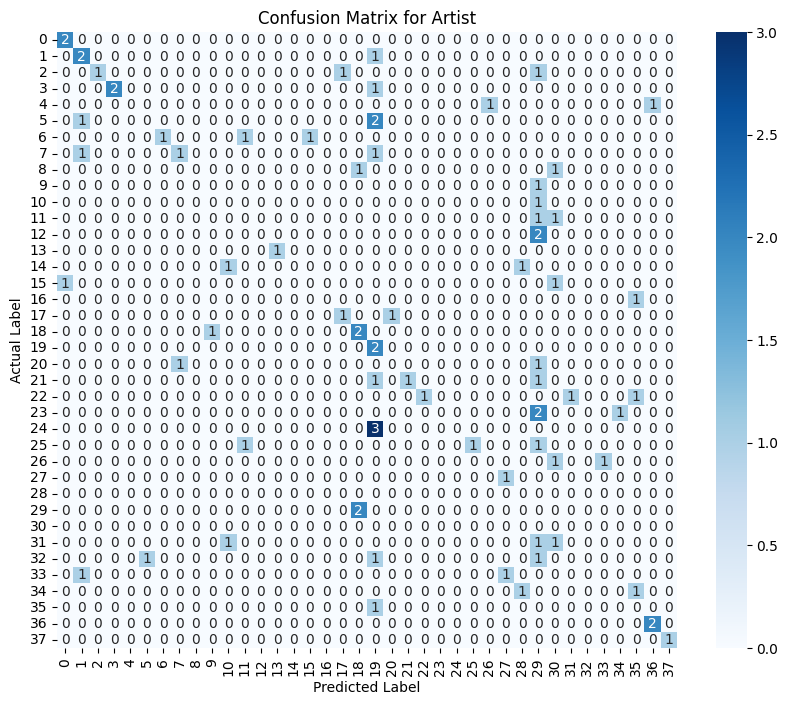

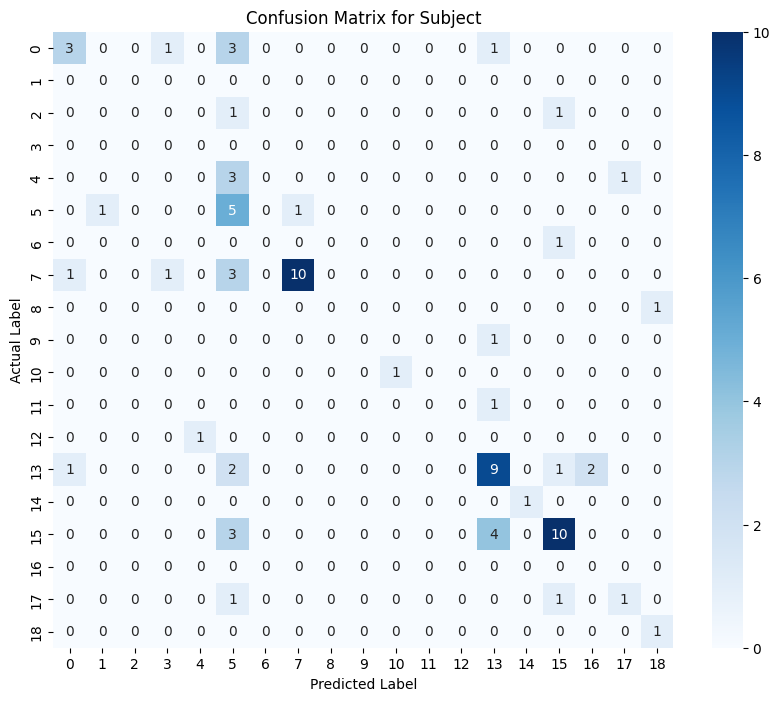

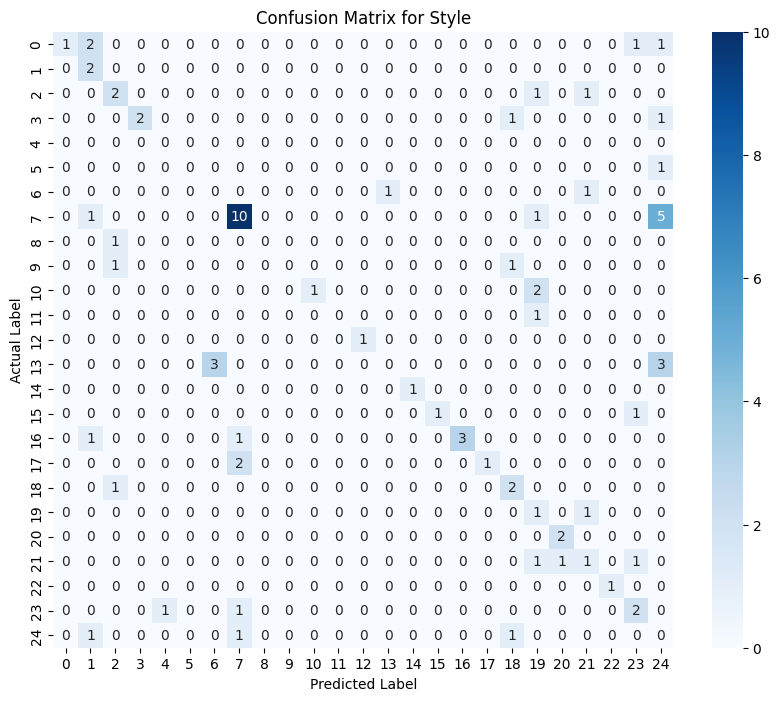

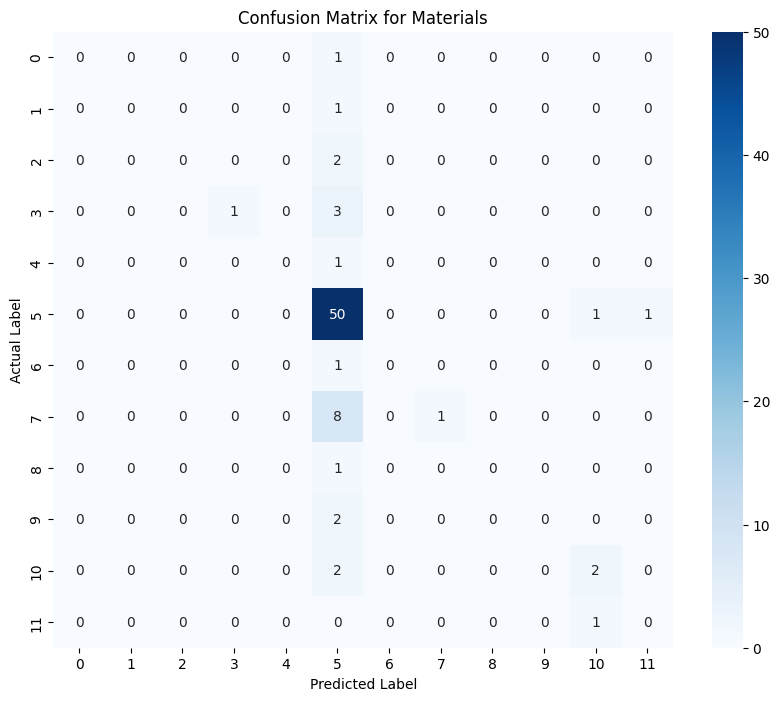

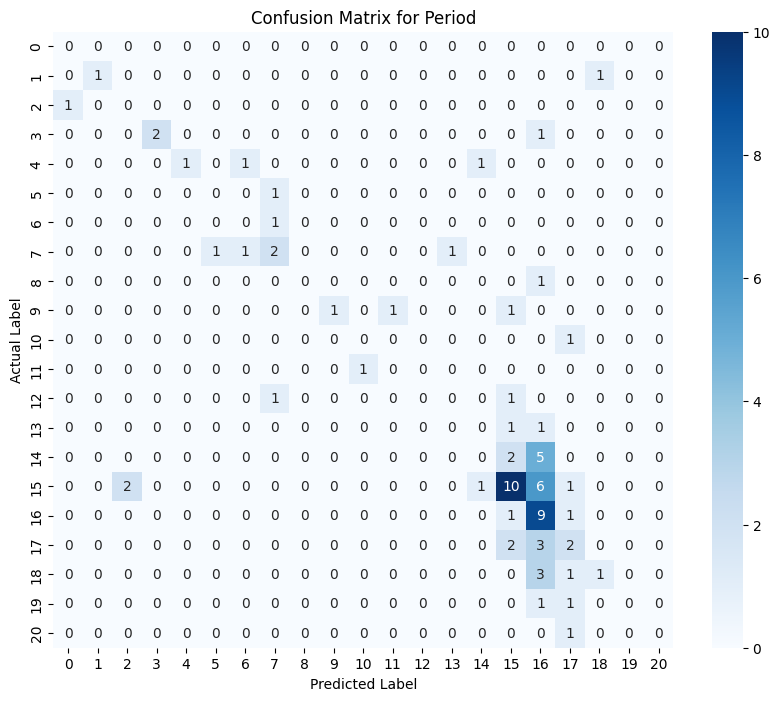

In [ ]:
plot_confusion_matrix(conf_matrix_artist, 'Confusion Matrix for Artist')
plot_confusion_matrix(conf_matrix_subject, 'Confusion Matrix for Subject')
plot_confusion_matrix(conf_matrix_style, 'Confusion Matrix for Style')
plot_confusion_matrix(conf_matrix_materials, 'Confusion Matrix for Materials')
plot_confusion_matrix(conf_matrix_period, 'Confusion Matrix for Period')

In [ ]:
y_pred_artist = np.argmax(predictions[0], axis=1)
y_pred_subject = np.argmax(predictions[1], axis=1)
y_pred_style = np.argmax(predictions[2], axis=1)
y_pred_materials = np.argmax(predictions[3], axis=1)
y_pred_period = np.argmax(predictions[4], axis=1)

In [ ]:
y_true_artist = np.argmax(ytest_artist, axis=1)
y_true_subject = np.argmax(ytest_subject, axis=1)
y_true_style = np.argmax(ytest_style, axis=1)
y_true_materials = np.argmax(ytest_materials, axis=1)
y_true_period = np.argmax(ytest_period, axis=1)

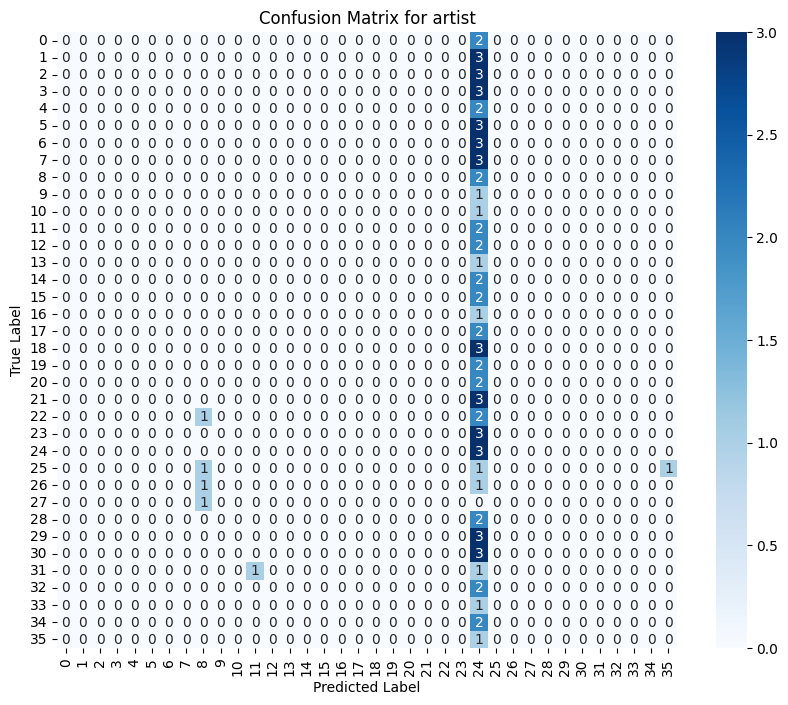

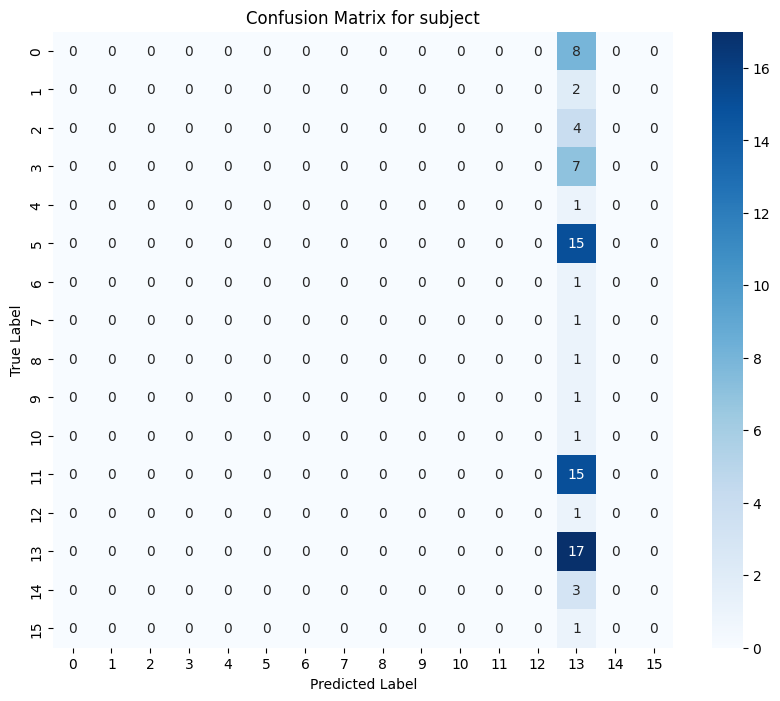

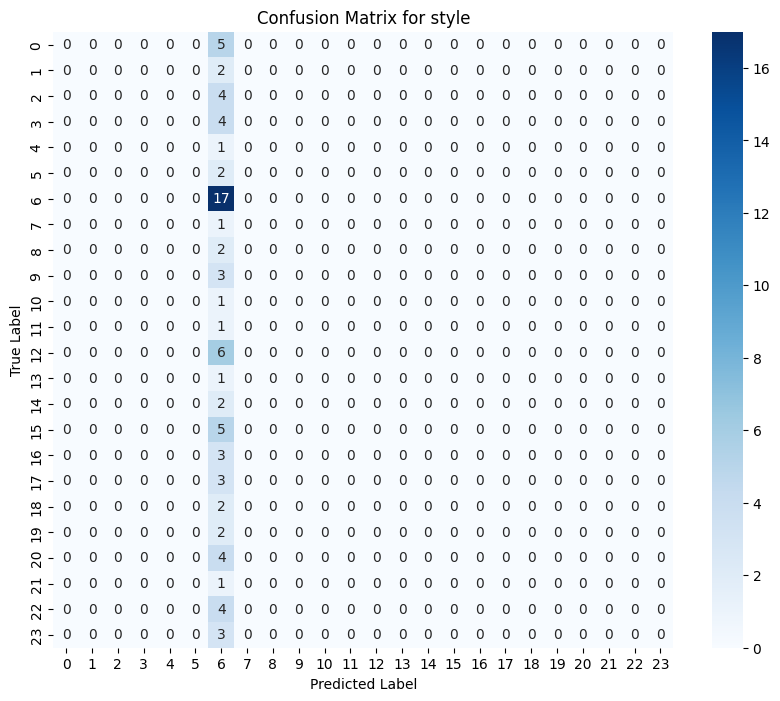

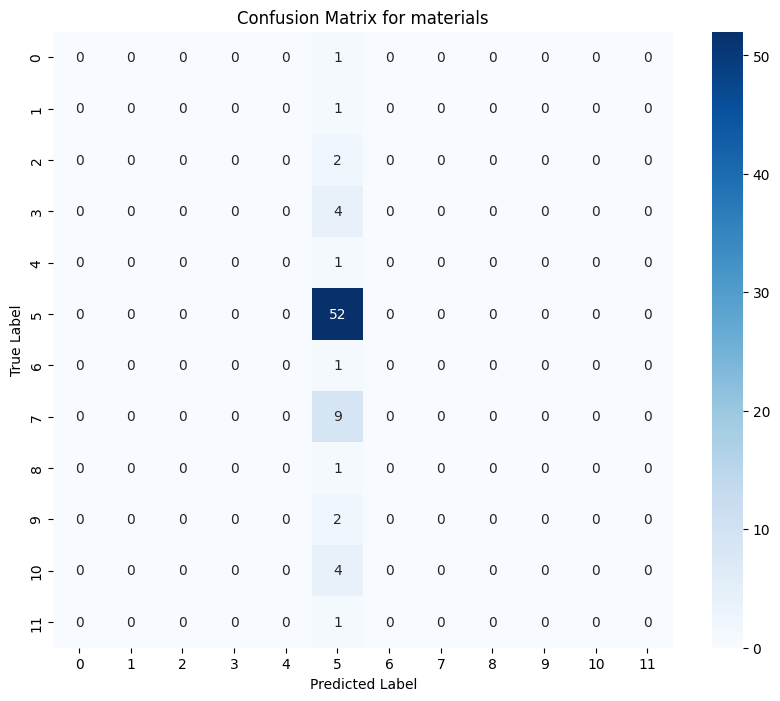

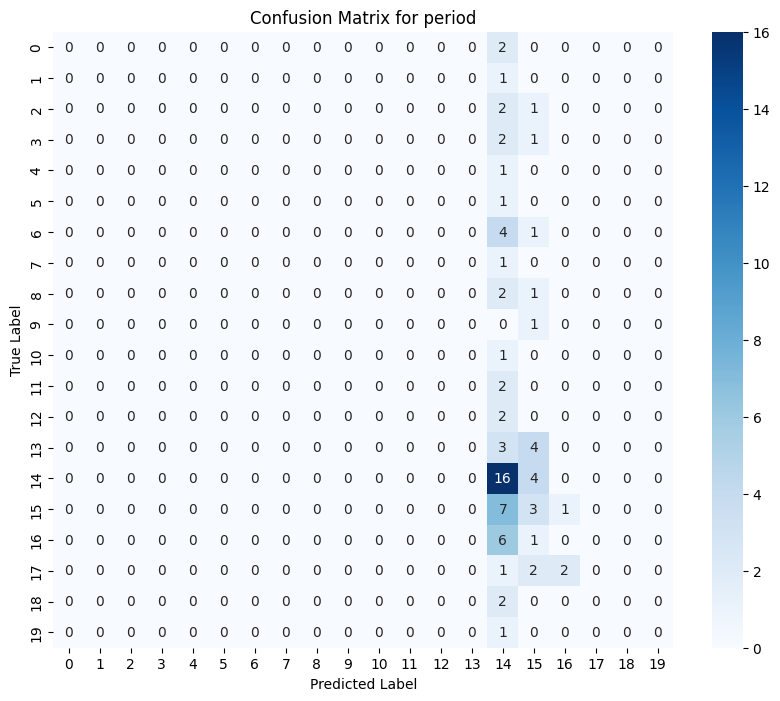

In [ ]:
labels = ['artist', 'subject', 'style', 'materials', 'period']

for i, (y_true, y_pred, label) in enumerate(zip([y_true_artist, y_true_subject, y_true_style, y_true_materials, y_true_period],
                                                [y_pred_artist, y_pred_subject, y_pred_style, y_pred_materials, y_pred_period],
                                                labels)):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {label}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Model Comparison with ROC Curves

## Model Comparison and Evaluation

We evaluate the performance of four different models:
- `EfficientNetB3`
- `VGG16`
- `VGG19`
- `Vision Transformer (ViT)`

on five different classification tasks: Artist, Subject, Style, Materials, and Period.

For each task, the models were tested using a set of images, and their predictions were compared to the actual labels. The evaluation was visualized using ROC (Receiver Operating Characteristic) curves, which illustrate how well each model distinguishes between the different categories.

<br/>

**Artist Classification:** In the task of identifying the artist behind a painting, the models showed varying degrees of accuracy. The ROC curves allowed us to see how well each model performed in classifying artists.

**Subject Classification:** The models were also tested on recognizing the subject matter of the paintings. Similar to the artist classification, we analyzed the performance using ROC curves.

**Style Classification:** For style classification, the models predicted which artistic style a painting belonged to. The results showed that some models performed better than others in this task.

**Materials Classification:** In this task, the models tried to identify the materials used in the paintings. Each model’s ability to correctly classify the materials was measured using ROC curves.

**Period Classification:** Finally, the models were evaluated on their ability to classify paintings by historical period. Again, we used ROC curves to assess the performance of each model.

<br/>

Among the four models, the Vision Transformer (ViT) outperformed the others across all five classification tasks, making it the best model for this painting recommendation system.


In [ ]:
eff_model.load_weights('/content/drive/MyDrive/eff_model_weights.weights.h5')
vgg16_model.load_weights('/content/drive/MyDrive/vgg16_model_weights.weights.h5')
vgg19_model.load_weights('/content/drive/MyDrive/vgg19_model_weights.weights.h5')
vit_model.load_weights('/content/drive/My Drive/vit_model_weights/model_epoch_50.weights.h5')

In [ ]:
efficientnet_probs = eff_model.predict(Xtest)
vgg16_probs = vgg16_model.predict(Xtest)
vgg19_probs = vgg19_model.predict(Xtest)
vit_probs = vit_model.predict(Xtest_preprocessed)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step


In [ ]:
n_classes = ytest_artist2.shape[1]
y_true = ytest_artist2

In [ ]:
ytest_labels = [ytest_artist2, ytest_subject2, ytest_style2, ytest_materials2, ytest_period2]
label_names = ['Artist', 'Subject', 'Style', 'Materials', 'Period']

In [ ]:
efficientnet_probs_artist = efficientnet_probs[0]
vgg16_probs_artist = vgg16_probs[0]
vgg19_probs_artist = vgg19_probs[0]
vit_probs_artist = vit_probs[0]

In [ ]:
model_probs_artist = {
    'EfficientNetB3': efficientnet_probs_artist,
    'VGG16': vgg16_probs_artist,
    'VGG19': vgg19_probs_artist,
    'ViT': vit_probs_artist
}

In [ ]:
def plot_roc_curves_for_label(y_true, model_probs, label_name):
    plt.figure(figsize=(10, 8))

    for model_name, probs in model_probs.items():
        # Calculate micro-average ROC curve and ROC area for each model
        fpr, tpr, _ = roc_curve(y_true.ravel(), probs.ravel())
        roc_auc = auc(fpr, tpr)

        # Plot the ROC curve for each model
        plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black', label='Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves - {label_name} Classification')
    plt.legend(loc='lower right')
    plt.show()

In [ ]:
ytest_artist_binarized = to_categorical(strat_test_set2['artist'], num_classes=40)

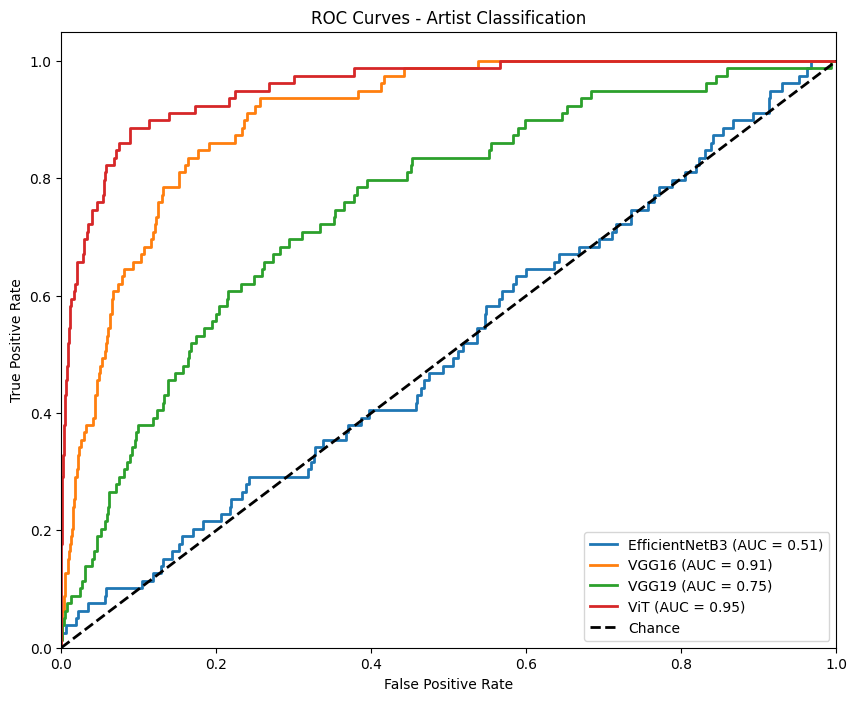

In [ ]:
from sklearn.metrics import roc_curve, auc

plot_roc_curves_for_label(ytest_artist_binarized, model_probs_artist, 'Artist')

In [ ]:
ytest_subject_binarized = to_categorical(strat_test_set2['subject'], num_classes=21)
ytest_style_binarized = to_categorical(strat_test_set2['style'], num_classes=28)
ytest_materials_binarized = to_categorical(strat_test_set2['materials'], num_classes=21)
ytest_period_binarized = to_categorical(strat_test_set2['period'], num_classes=25)

In [ ]:
efficientnet_probs_subject = efficientnet_probs[1]
vgg16_probs_subject = vgg16_probs[1]
vgg19_probs_subject = vgg19_probs[1]
vit_probs_subject = vit_probs[1]

model_probs_subject = {
    'EfficientNetB3': efficientnet_probs_subject,
    'VGG16': vgg16_probs_subject,
    'VGG19': vgg19_probs_subject,
    'ViT': vit_probs_subject
}

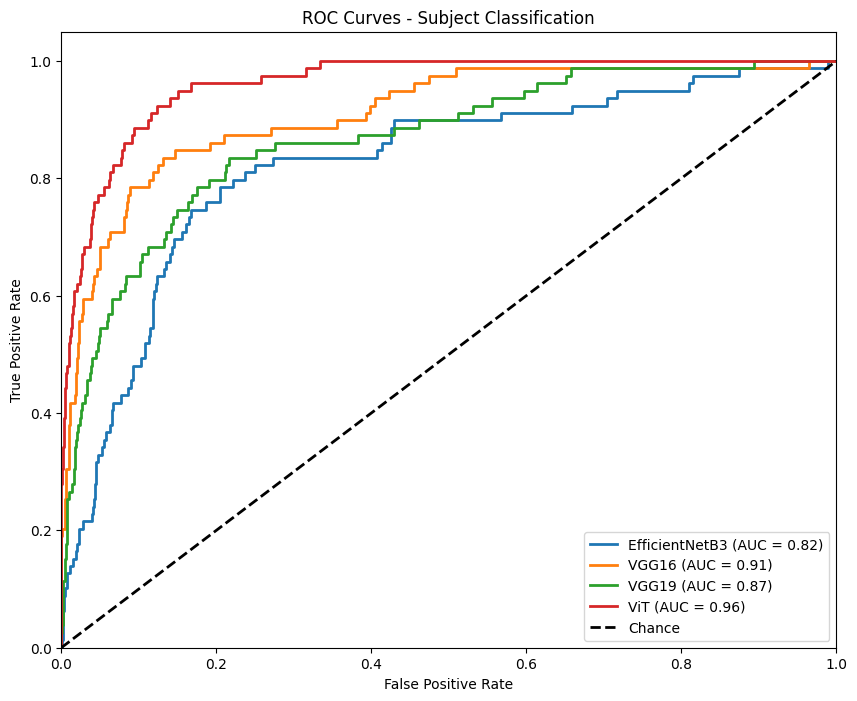

In [ ]:
plot_roc_curves_for_label(ytest_subject_binarized, model_probs_subject, 'Subject')

In [ ]:
efficientnet_probs_style = efficientnet_probs[2]
vgg16_probs_style = vgg16_probs[2]
vgg19_probs_style = vgg19_probs[2]
vit_probs_style = vit_probs[2]

In [ ]:
model_probs_style = {
    'EfficientNetB3': efficientnet_probs_style,
    'VGG16': vgg16_probs_style,
    'VGG19': vgg19_probs_style,
    'ViT': vit_probs_style
}

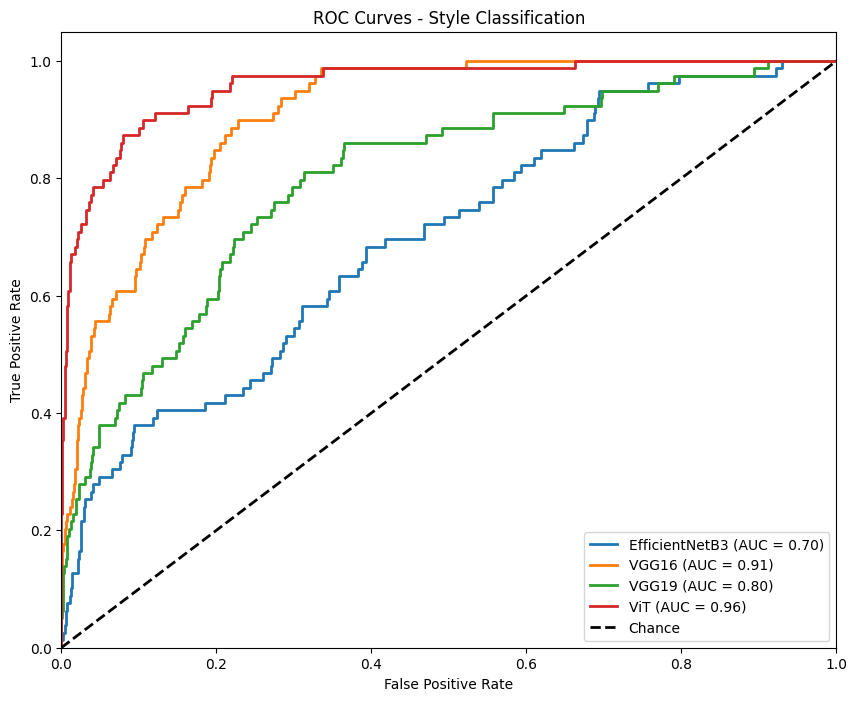

In [ ]:
plot_roc_curves_for_label(ytest_style_binarized, model_probs_style, 'Style')

In [ ]:
efficientnet_probs_materials = efficientnet_probs[3]
vgg16_probs_materials = vgg16_probs[3]
vgg19_probs_materials = vgg19_probs[3]
vit_probs_materials = vit_probs[3]

In [ ]:
model_probs_materials = {
    'EfficientNetB3': efficientnet_probs_materials,
    'VGG16': vgg16_probs_materials,
    'VGG19': vgg19_probs_materials,
    'ViT': vit_probs_materials
}

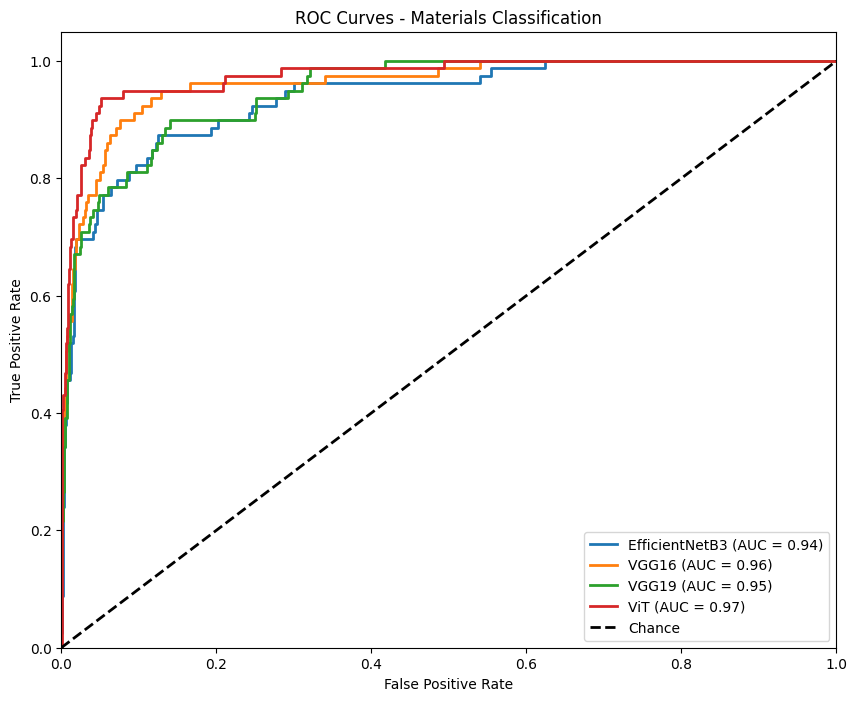

In [ ]:
plot_roc_curves_for_label(ytest_materials_binarized, model_probs_materials, 'Materials')

In [ ]:
efficientnet_probs_period = efficientnet_probs[4]
vgg16_probs_period = vgg16_probs[4]
vgg19_probs_period = vgg19_probs[4]
vit_probs_period = vit_probs[4]

In [ ]:
model_probs_period = {
    'EfficientNetB3': efficientnet_probs_period,
    'VGG16': vgg16_probs_period,
    'VGG19': vgg19_probs_period,
    'ViT': vit_probs_period
}

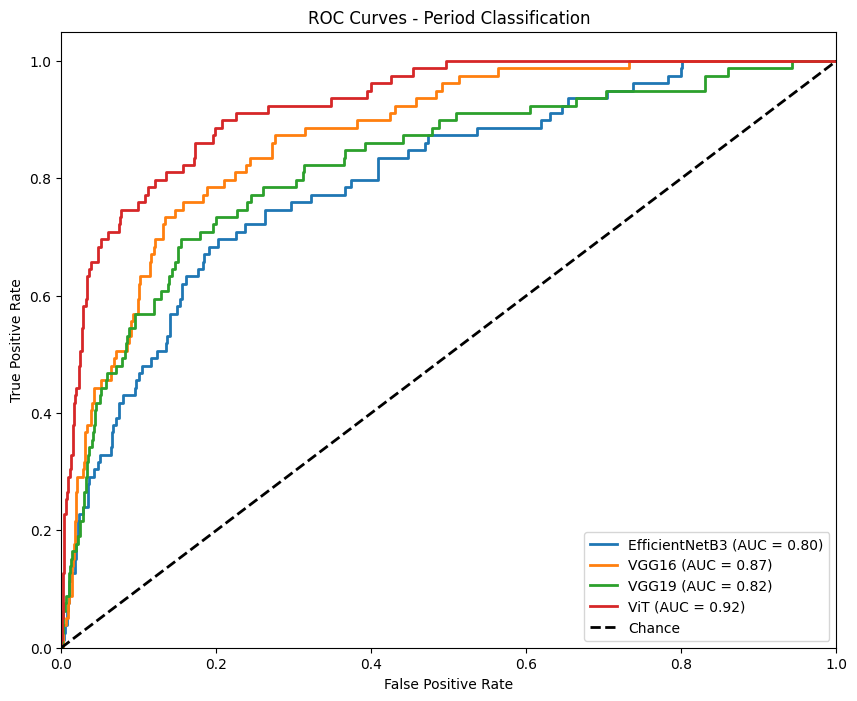

In [ ]:
plot_roc_curves_for_label(ytest_period_binarized, model_probs_period, 'Period')

# Fine-Tunning ViT Model

## Model Architecture Overview

The architecture of the custom Vision Transformer (ViT) model includes the following components:

- **Input Layer**: The model takes input images of shape (3, 224, 224), indicating three color channels (RGB) and a size of 224x224 pixels.

- **ViT Layer**: The custom ViT layer processes the input images using a pre-trained ViT model. This layer extracts features from the input images, which serve as the foundation for the subsequent classification tasks.

- **Dense Layer**: A dense layer with 512 units and a ReLU activation function is applied to the output from the ViT layer. This layer learns to combine the extracted features effectively.

- **Dropout Layer**: A dropout layer with a rate of 0.3 is added after the dense layer. This layer helps prevent overfitting by randomly setting 30% of the neurons to zero during training.

- **Output Layers**: Five output layers are defined, each corresponding to different classification tasks.

This architecture allows the model to classify images into multiple categories based on the features extracted from the input images.


In [ ]:
input_layer = tf.keras.Input(shape=(3, 224, 224))
vit_layer = CustomViTLayer(vit_base_model)(input_layer)

In [ ]:
x_vit = Dense(512, activation='relu')(vit_layer)
x_vit = Dropout(0.3)(x_vit)

In [ ]:
vit_output_artist = Dense(40, activation='softmax', name='artist_output')(x_vit)
vit_output_subject = Dense(21, activation='softmax', name='subject_output')(x_vit)
vit_output_style = Dense(28, activation='softmax', name='style_output')(x_vit)
vit_output_materials = Dense(21, activation='softmax', name='materials_output')(x_vit)
vit_output_period = Dense(25, activation='softmax', name='period_output')(x_vit)

In [ ]:
vit_model2 = Model(inputs=input_layer, outputs=[vit_output_artist, vit_output_subject, vit_output_style, vit_output_materials, vit_output_period])

In [ ]:
for layer in vit_base_model.layers:
    layer.trainable = False

### Learning Rate Scheduler

A learning rate scheduler is implemented, adjusting the learning rate dynamically as training progresses. It starts with a learning rate of 1e-3 for the first 40 epochs, reduces to 1e-4 from epoch 40 to 80, and then to 1e-5 for epochs beyond 80. This is designed to improve convergence by lowering the learning rate in later epochs.

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
vit_model2.compile(optimizer=optimizer,
                  loss={'artist_output': 'categorical_crossentropy',
                        'subject_output': 'categorical_crossentropy',
                        'style_output': 'categorical_crossentropy',
                        'materials_output': 'categorical_crossentropy',
                        'period_output': 'categorical_crossentropy'},
                  metrics={'artist_output': 'accuracy',
                           'subject_output': 'accuracy',
                           'style_output': 'accuracy',
                           'materials_output': 'accuracy',
                           'period_output': 'accuracy'})

### Layers and Parameters

The Vision Transformer (ViT) model2 architecture consists of several key layers, including:

- **CustomViTLayer:** This layer processes the input image by dividing it into patches and applying self-attention mechanisms to extract features.
- **Dense:** Output layers for multi-class classification tasks, where each dense layer corresponds to a specific output category.

The model has a total of **462,983 parameters**, all of which are trainable.


In [ ]:
vit_model2.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 3, 224, 224)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_vi_t_layer_1       │ (None, 768)            │              0 │ input_layer_3[0][0]    │
│ (CustomViTLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 512)            │        393,728 │ custom_vi_t_layer_1[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ artist_output (Dense)     │ (None, 40)             │         20,520 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ subject_output (Dense)    │ (None, 21)             │         10,773 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ style_output (Dense)      │ (None, 28)             │         14,364 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ materials_output (Dense)  │ (None, 21)             │         10,773 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ period_output (Dense)     │ (None, 25)             │         12,825 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 462,983 (1.77 MB)

 Trainable params: 462,983 (1.77 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
def lr_schedule(epoch, lr):
    if epoch < 30:
        return 1e-3
    elif epoch < 50:
        return 1e-4
    else:
        return 1e-5

In [ ]:
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_schedule)

In [ ]:
vit_checkpoint_dir2 = '/content/drive/My Drive/vit_model2_weights/'
os.makedirs(vit_checkpoint_dir2, exist_ok=True)

vit_checkpoint_callback2 = ModelCheckpoint(
    filepath=os.path.join(vit_checkpoint_dir2, 'vit_model2_epoch_{epoch:02d}.weights.h5'),
    save_weights_only=True,
    save_best_only=False,
    verbose=1,
    monitor="val_loss",
    mode="min"
)

### Model Training Summary
The ViT model (`vit_model2`) is trained for 80 epochs using the training generator, with validation performed on the preprocessed test data. The model is compiled with the Adam optimizer set to a learning rate of \(1 \times 10^{-3}\). A learning rate scheduler is employed to adjust the learning rate throughout training. The training process includes callbacks for saving model weights and tracking the best epoch, which is then printed after training.

### Model Training Results Summary

- **Best Epoch:** 47

- **Training Metrics at Best Epoch:**
   - **Artist Output Accuracy**: 0.9940
   - **Materials Output Accuracy**: 0.9838
   - **Period Output Accuracy**: 0.9762
   - **Style Output Accuracy**: 0.9994
   - **Subject Output Accuracy**: 0.9474
  
- **Validation Metrics at Best Epoch:**
  - **Validation Artist Output Accuracy**: 0.5949
  - **Validation Loss**: 6.8095
  - **Validation Materials Output Accuracy**: 0.7722
  - **Validation Period Output Accuracy**: 0.4051
  - **Validation Style Output Accuracy**: 0.6203
  - **Validation Subject Output Accuracy**: 0.6962




In [ ]:
vit_model2.fit(
    train_generator,
    epochs=80,
    validation_data=(Xtest_preprocessed, [ytest_artist2, ytest_subject2, ytest_style2, ytest_materials2, ytest_period2]),
    callbacks=[vit_checkpoint_callback2, best_epoch_tracker]
)

print(f"The best model was found at epoch: {best_epoch_tracker.best_epoch + 1}")

Epoch 1/80
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - artist_output_accuracy: 0.0404 - loss: 15.7638 - materials_output_accuracy: 0.4029 - period_output_accuracy: 0.1329 - style_output_accuracy: 0.0908 - subject_output_accuracy: 0.0928
Epoch 1: saving model to /content/drive/My Drive/vit_model2_weights/vit_model2_epoch_01.weights.h5
10/10 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - artist_output_accuracy: 0.0405 - loss: 15.6371 - materials_output_accuracy: 0.4285 - period_output_accuracy: 0.1389 - style_output_accuracy: 0.0913 - subject_output_accuracy: 0.1061 - val_artist_output_accuracy: 0.0633 - val_loss: 13.3616 - val_materials_output_accuracy: 0.6582 - val_period_output_accuracy: 0.2405 - val_style_output_accuracy: 0.2025 - val_subject_output_accuracy: 0.3671
Epoch 2/80
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - artist_output_accuracy: 0.0879 - loss: 12.8023 - materials_output_accuracy: 0.6704 - period_output_accuracy: 0.2893 - style_output_accuracy: 0.2129 - subject_output_accuracy: 0.3590

In [ ]:
weights_epoch47_path = os.path.join(vit_checkpoint_dir2, 'vit_model2_epoch_47.weights.h5')

In [ ]:
vit_model2.load_weights(weights_epoch47_path)

### Model Evaluation

In [ ]:
yvit_pred_artist, yvit_pred_subject, yvit_pred_style, yvit_pred_materials, yvit_pred_period = vit_model2.predict(Xtest_resized, batch_size=32)

3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step


In [ ]:
yvit_pred_artist_classes = np.argmax(yvit_pred_artist, axis=1)
yvit_pred_subject_classes = np.argmax(yvit_pred_subject, axis=1)
yvit_pred_style_classes = np.argmax(yvit_pred_style, axis=1)
yvit_pred_materials_classes = np.argmax(yvit_pred_materials, axis=1)
yvit_pred_period_classes = np.argmax(yvit_pred_period, axis=1)

In [ ]:
y_true_artist_classes = np.argmax(ytest_artist, axis=1)
y_true_subject_classes = np.argmax(ytest_subject, axis=1)
y_true_style_classes = np.argmax(ytest_style, axis=1)
y_true_materials_classes = np.argmax(ytest_materials, axis=1)
y_true_period_classes = np.argmax(ytest_period, axis=1)

### Evaluation Results

The evaluation of the ViT2 model yielded the following accuracy scores for each classification task:

- **Total Loss:** 6.1589
- **Artist Output Accuracy:** 62.50%
- **Materials Output Accuracy:** 78.12%
- **Period Output Accuracy:** 43.75%
- **Style Output Accuracy:** 62.50%
- **Subject Output Accuracy:** 71.87%










In [ ]:
datagen = ImageDataGenerator(data_format='channels_last')

test_generator = CustomDataGenerator(
    images=Xtest_preprocessed,
    labels=[ytest_artist2, ytest_subject2, ytest_style2, ytest_materials2, ytest_period2],
    batch_size=32,
    datagen=datagen
)

results = vit_model2.evaluate(
    test_generator,
    batch_size=32,
    verbose=1
)

print(results)

/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:619: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (32, 3, 224, 224) (224 channels).
  warnings.warn(


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - artist_output_accuracy: 0.6250 - loss: 6.2179 - materials_output_accuracy: 0.7917 - period_output_accuracy: 0.4479 - style_output_accuracy: 0.6042 - subject_output_accuracy: 0.7083
[6.158963680267334, 0.625, 0.78125, 0.4375, 0.625, 0.71875]


In [ ]:
predictions = vit_model2.predict(test_generator, batch_size=32)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


In [ ]:
conf_matrix_artist = confusion_matrix(y_true_artist_classes, yvit_pred_artist_classes)
conf_matrix_subject = confusion_matrix(y_true_subject_classes, yvit_pred_subject_classes)
conf_matrix_style = confusion_matrix(y_true_style_classes, yvit_pred_style_classes)
conf_matrix_materials = confusion_matrix(y_true_materials_classes, yvit_pred_materials_classes)
conf_matrix_period = confusion_matrix(y_true_period_classes, yvit_pred_period_classes)

def plot_confusion_matrix(conf_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues')
    plt.title(title)
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

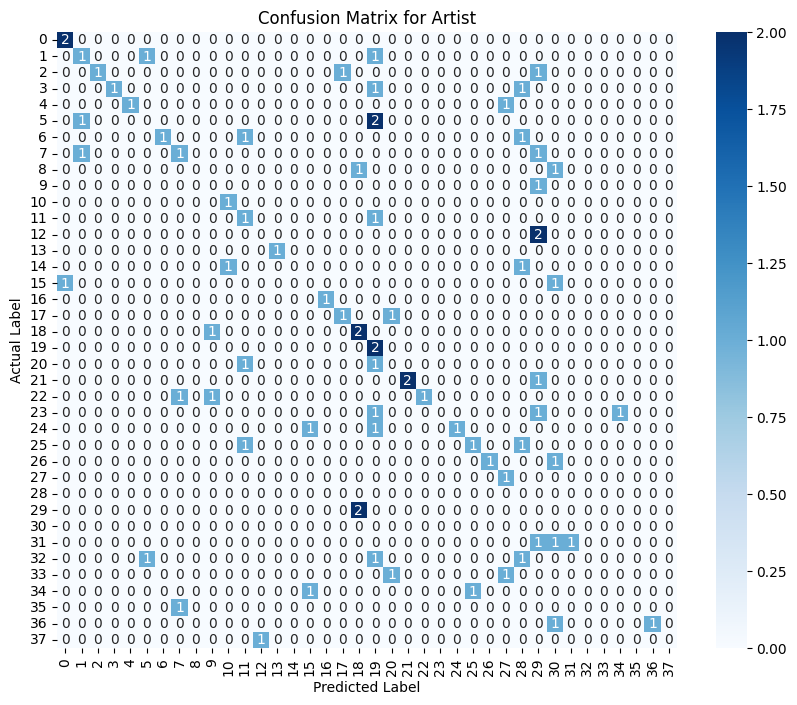

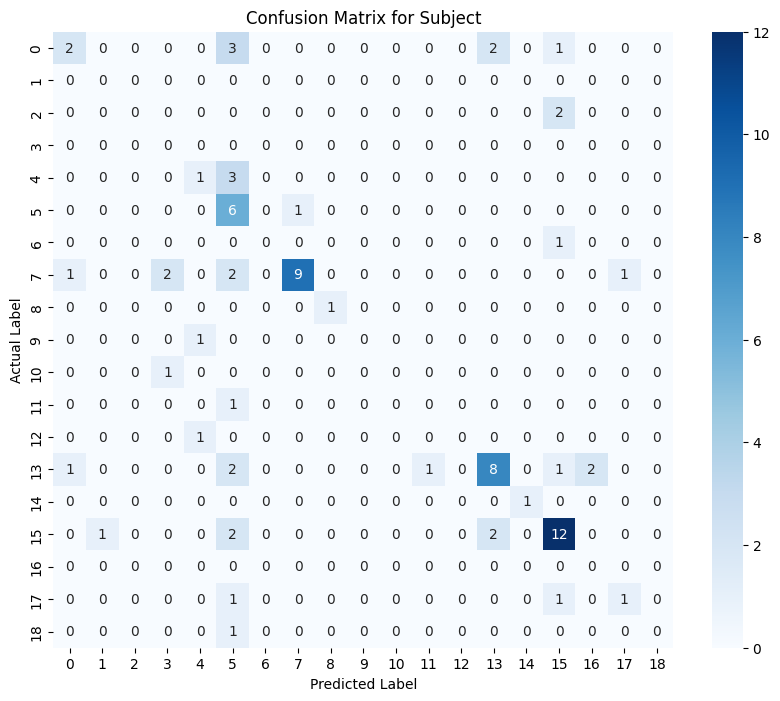

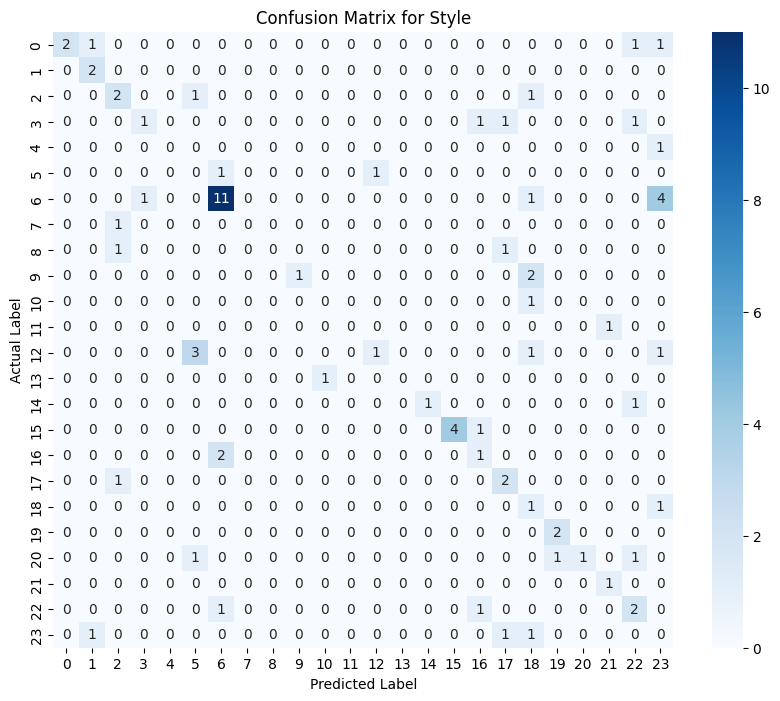

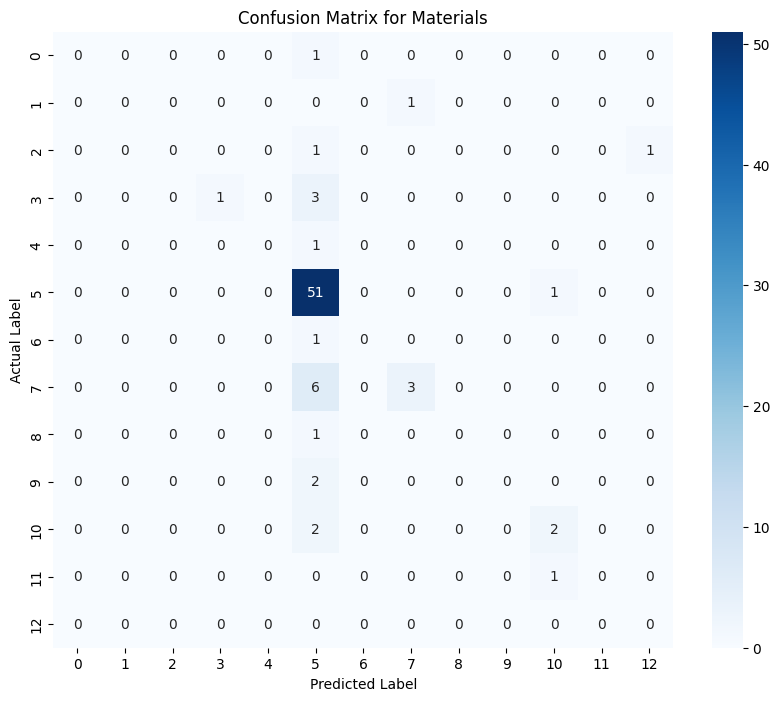

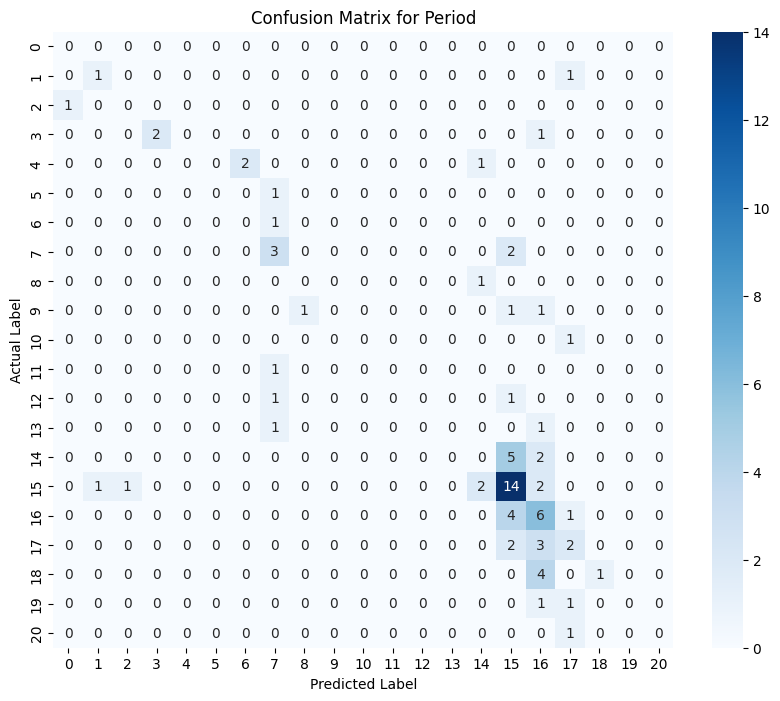

In [ ]:
plot_confusion_matrix(conf_matrix_artist, 'Confusion Matrix for Artist')
plot_confusion_matrix(conf_matrix_subject, 'Confusion Matrix for Subject')
plot_confusion_matrix(conf_matrix_style, 'Confusion Matrix for Style')
plot_confusion_matrix(conf_matrix_materials, 'Confusion Matrix for Materials')
plot_confusion_matrix(conf_matrix_period, 'Confusion Matrix for Period')


In [ ]:
y_pred_artist = np.argmax(predictions[0], axis=1)
y_pred_subject = np.argmax(predictions[1], axis=1)
y_pred_style = np.argmax(predictions[2], axis=1)
y_pred_materials = np.argmax(predictions[3], axis=1)
y_pred_period = np.argmax(predictions[4], axis=1)

In [ ]:
y_true_artist = np.argmax(ytest_artist, axis=1)
y_true_subject = np.argmax(ytest_subject, axis=1)
y_true_style = np.argmax(ytest_style, axis=1)
y_true_materials = np.argmax(ytest_materials, axis=1)
y_true_period = np.argmax(ytest_period, axis=1)

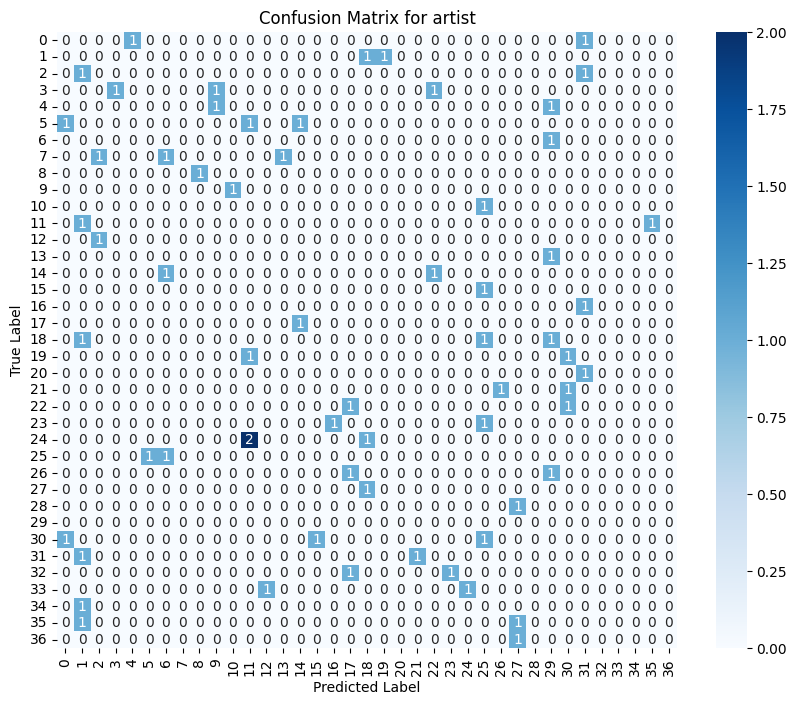

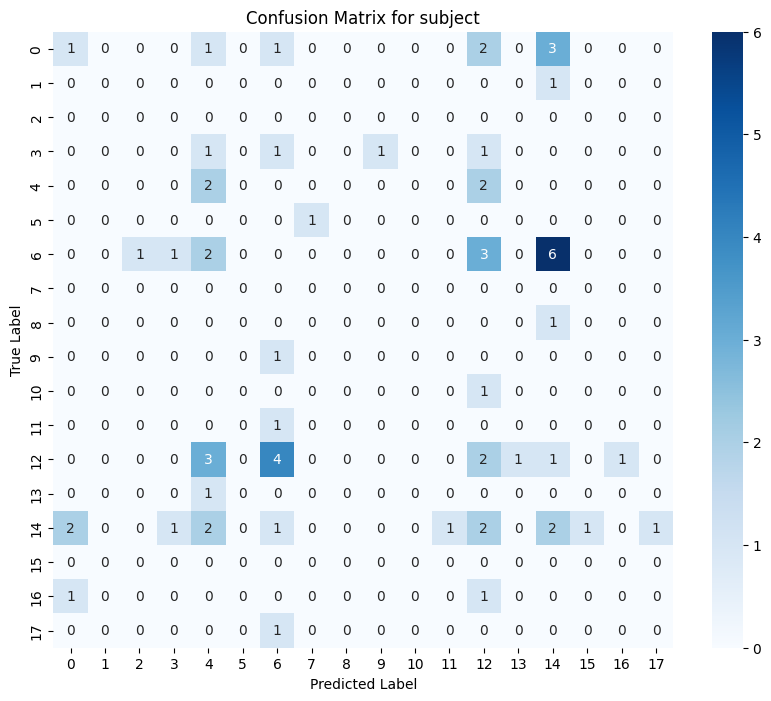

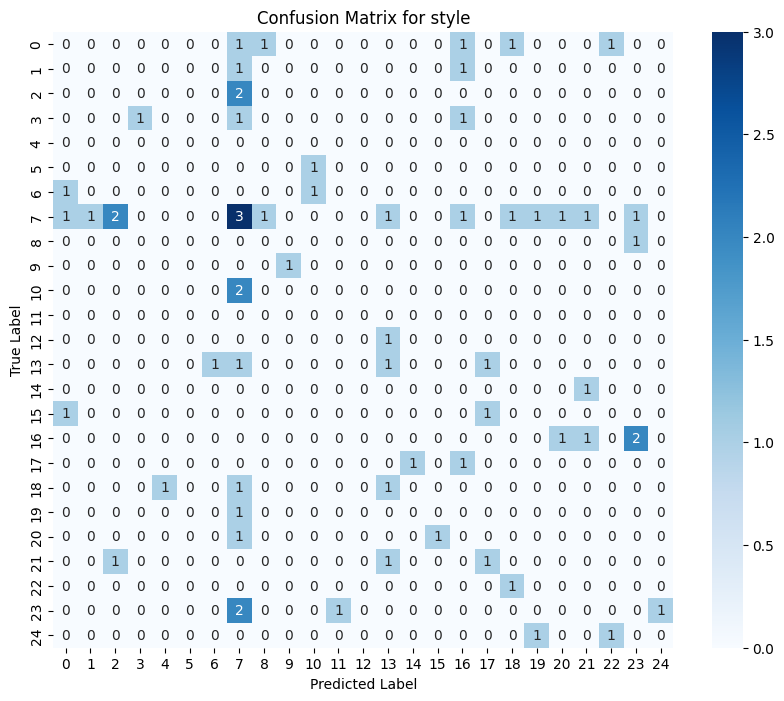

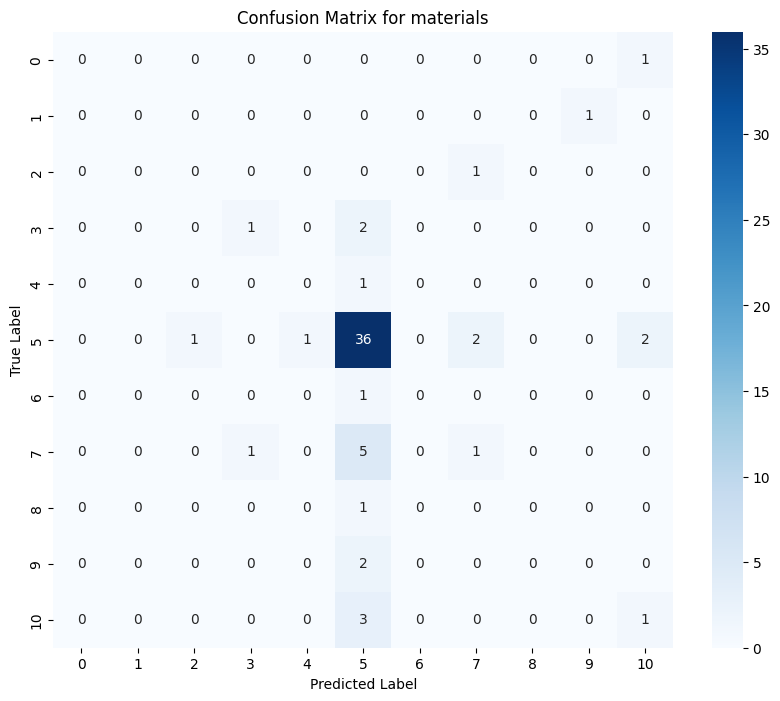

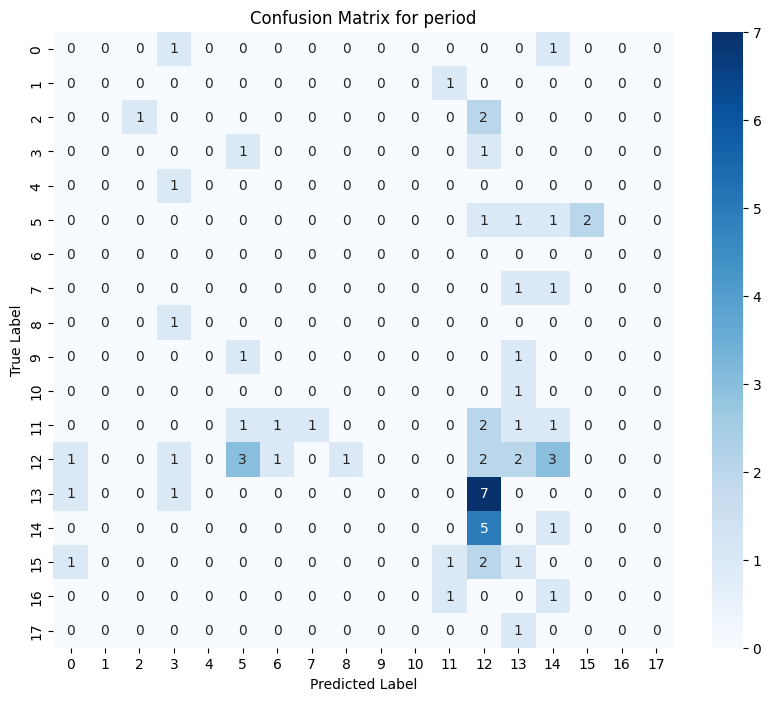

In [ ]:
for i, (y_true, y_pred, label) in enumerate(zip([y_true_artist, y_true_subject, y_true_style, y_true_materials, y_true_period],
                                                [y_pred_artist, y_pred_subject, y_pred_style, y_pred_materials, y_pred_period],
                                                labels)):
    # Trim the data to have the same length
    min_len = min(len(y_true), len(y_pred))
    y_true = y_true[:min_len]
    y_pred = y_pred[:min_len]

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {label}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Recommendation System development

## Generating Image Embeddings

- **Loading Model Weights**: The model weights from the best epoch are loaded into the `vit_model`. This allows the model to retain the learned features up to that point.

- **Creating an Embedding Model**: A new Keras model named `embedding_model` is created. This model takes the same input as `vit_model` but outputs the activations from the second-to-last layer. This layer serves as a feature extractor, providing embeddings for the input images.

- **Generating Embeddings**: The `predict` method of the `embedding_model` is used to generate embeddings for the training images (`Xtrain_preprocessed`). This process runs across all training samples, producing a set of high-dimensional feature vectors that represent the content of each image.

- **Saving Embeddings**: The generated image embeddings are saved as a NumPy array to a specified path (`train_image_embeddings.npy`). This allows for easy retrieval and use in future tasks, such as classification or clustering.

- **Loading Embeddings**: The saved embeddings are loaded back into memory using `np.load`, making them ready for further analysis or model training.

In [ ]:
vit_model2.load_weights('/content/drive/My Drive/vit_model2_weights/vit_model2_epoch_59.weights.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 26 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
input_layer = tf.keras.Input(shape=(3, 224, 224))
embedding_model = tf.keras.Model(inputs=vit_model.input, outputs=vit_model.layers[-2].output)

In [ ]:
image_embeddings_train = embedding_model.predict(Xtrain_preprocessed)

11/11 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step


In [ ]:
np.save('/content/drive/MyDrive/train_image_embeddings.npy', image_embeddings_train)

In [ ]:
image_embeddings_train=np.load('/content/drive/MyDrive/train_image_embeddings.npy')

## Generating Test Image Embeddings and Combining Labels

A combined label array named `train_labels_combined` is created using `np.vstack`. This array vertically stacks the encoded labels for subjects, styles, and materials from the training dataset, forming a 2D array where each row corresponds to a training sample. The resulting array is transposed to ensure that each sample's labels are in a single row.

<br/>

The `predict` method of the `embedding_model` is called again, but this time it is used to generate embeddings for the test images (`Xtest_preprocessed`). This process captures the features of the test images, producing a corresponding set of high-dimensional embeddings.

<br/>

The generated test image embeddings are saved as a NumPy array to a specified path (`test_image_embeddings.npy`). This allows for easy access to the test embeddings for later evaluation or analysis.


In [ ]:
train_labels_combined = np.vstack([
    strat_train_set2['subject'].values,
    strat_train_set2['style'].values,
    strat_train_set2['materials'].values
]).T

In [ ]:
image_embeddings_test = embedding_model.predict(Xtest_preprocessed)

3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 5s/step


In [ ]:
np.save('/content/drive/MyDrive/test_image_embeddings.npy', image_embeddings_test)

In [ ]:
test_labels_combined = np.vstack([
    strat_test_set2['subject'].values,
    strat_test_set2['style'].values,
    strat_test_set2['materials'].values
]).T

## Preparing Combined Embeddings and Calculating Similarity

- **Combining Test Labels**: A combined label array named `test_labels_combined` is created using `np.vstack`. This array vertically stacks the encoded labels for subjects, styles, and materials from the test dataset, forming a 2D array where each row corresponds to a test sample. The resulting array is transposed to ensure that each sample's labels are in a single row.

- **Encoding Labels**: The `OneHotEncoder` is instantiated to transform the combined training labels (`train_labels_combined`) into one-hot encoded vectors. The encoder is fit on the training labels and then applied to the test labels (`test_labels_combined`), resulting in two one-hot encoded arrays: `label_embeddings_train` and `label_embeddings_test`.

- **Combining Image and Label Embeddings**: The image embeddings for both the training and testing datasets are combined with their corresponding one-hot encoded label embeddings. The `np.concatenate` function is used to stack the image embeddings and label embeddings along the last axis, resulting in `combined_embeddings_train` and `combined_embeddings_test`.

- **Calculating Similarity Matrix**: The cosine similarity between the combined test embeddings (`combined_embeddings_test`) is computed using the `cosine_similarity` function. This results in a similarity matrix that captures the pairwise similarity scores between all test samples, which can be useful for tasks such as clustering, retrieval, or classification.


In [ ]:
encoder = OneHotEncoder(sparse_output=False)

In [ ]:
label_embeddings_train = encoder.fit_transform(train_labels_combined)
label_embeddings_test = encoder.transform(test_labels_combined)

In [ ]:
combined_embeddings_train = np.concatenate([image_embeddings_train, label_embeddings_train], axis=1)
combined_embeddings_test = np.concatenate([image_embeddings_test, label_embeddings_test], axis=1)

In [ ]:
similarity_matrix = cosine_similarity(combined_embeddings_test)

## Function Definitions for Painting Recommendation

1. **Decoding Labels**:
   - The `decode_labels` function takes in painting details and label encoders to decode categorical labels for a painting. It creates a dictionary `decoded_labels` where each key corresponds to a label category (subject, style, materials, artist). The function uses the `inverse_transform` method of the label encoders to convert encoded labels back to their original form.

2. **Finding Similar Paintings**:
   - The `get_similar_paintings_from_train` function retrieves similar paintings from the training dataset based on the cosine similarity of their embeddings.
   - **Parameters**:
     - `painting_index`: Index of the test painting for which similar paintings are sought.
     - `test_image_embeddings`: Precomputed embeddings for test images.
     - `combined_embeddings_train`: Combined embeddings of training images and their labels.
     - `strat_train_set2`: DataFrame containing encoded training labels.
     - `label_encoders1`: Dictionary of label encoders for decoding artist names.
     - `max_artist_recommendations`: Maximum number of recommendations allowed per artist (default is 1).
     - `top_n`: Total number of similar paintings to recommend (default is 5).

   - **Process**:
     - The function retrieves the embedding for the specified test painting and computes the cosine similarity between this embedding and all training embeddings.
     - It sorts the similarity scores in descending order and identifies the base painting's artist using the label encoder.
     - It tracks the count of recommendations per artist to avoid recommending multiple paintings from the same artist beyond the specified limit.
     - The function then constructs lists of recommended painting indices and their corresponding similarity scores based on the similarity calculations.

   - **Return**:
     - The function returns two lists: `recommended_paintings`, which contains the indices of the recommended paintings, and `recommended_similarities`, which contains their similarity scores.


In [ ]:
def decode_labels(painting_details, label_encoders):
    decoded_labels = {}
    for column in ['subject', 'style', 'materials', 'artist']:
        decoded_labels[column] = label_encoders[column].inverse_transform([painting_details[column]])[0]
    return decoded_labels

In [ ]:
def get_similar_paintings_from_train(painting_index, test_image_embeddings, combined_embeddings_train, strat_train_set2, label_encoders, max_artist_recommendations=1, top_n=5):
    test_embedding = test_image_embeddings[painting_index]

    similarity_scores = cosine_similarity([test_embedding], combined_embeddings_train)[0]
    sorted_indices = np.argsort(similarity_scores)[::-1]
    base_painting_artist = label_encoders['artist'].inverse_transform([strat_test_set2.iloc[painting_index]['artist']])[0]

    artist_count = {}

    recommended_paintings = []
    recommended_similarities = []

    for idx in sorted_indices:
        if len(recommended_paintings) >= top_n:
            break
        painting = strat_train_set2.iloc[idx]
        painting_artist = label_encoders['artist'].inverse_transform([painting['artist']])[0]

        if painting_artist not in artist_count:
            artist_count[painting_artist] = 0

        if artist_count[painting_artist] < max_artist_recommendations:
            artist_count[painting_artist] += 1
            recommended_paintings.append(idx)
            recommended_similarities.append(similarity_scores[idx])

    return recommended_paintings, recommended_similarities

## Functions for Plotting and Printing Painting Recommendations

1. **Plotting Recommendations**:
   - The `plot_recommendations` function visualizes the base painting along with its recommended similar paintings.
   - **Parameters**:
     - `base_painting_idx`: Index of the base painting.
     - `similar_painting_indices`: Indices of the recommended similar paintings.
     - `strat_test_set2`: DataFrame containing information about test paintings.
     - `strat_train_set2`: DataFrame containing information about training paintings.
     - `label_encoders`: Encoders used to decode labels (not utilized in this function).
     - `similarity_scores`: List of similarity scores for the recommendations.

   - **Process**:
     - The function reads the image of the base painting using its path stored in the `strat_test_set2` DataFrame and displays it.
     - It then iterates over the indices of similar paintings and their similarity scores, reading and displaying each recommended painting alongside its similarity score.
     - The images are arranged in a grid layout for easy comparison.

   - **Output**: Displays the base painting and its top recommendations in a single figure.

2. **Printing Recommendations**:
   - The `print_recommendations` function provides a textual summary of the base painting and its recommendations.
   - **Parameters**:
     - `base_painting_idx`: Index of the base painting.
     - `similar_paintings`: List of indices for the recommended paintings.
     - `similarity_scores`: List of similarity scores for the recommendations.
     - `strat_test_set2`: DataFrame containing information about test paintings.
     - `strat_train_set2`: DataFrame containing information about training paintings.
     - `label_encoders1`: Dictionary of label encoders for decoding categorical labels.

   - **Process**:
     - The function retrieves and prints details (subject, style, materials, artist) for the base painting using the specified index.
     - It then iterates through the recommended painting indices, decoding and printing their corresponding details along with their similarity scores.

   - **Output**: Outputs a summary of the base painting and detailed information about each recommended painting in the console.


In [ ]:
def plot_recommendations(base_painting_idx, similar_painting_indices, strat_test_set2, strat_train_set2, label_encoders, similarity_scores):
    base_painting_path = strat_test_set2.iloc[base_painting_idx]['image_path']
    base_painting_img = mpimg.imread(base_painting_path)

    plt.figure(figsize=(12, 8))
    plt.subplot(2, 3, 1)
    plt.imshow(base_painting_img)
    plt.axis('off')
    plt.title("Base Painting")

    for i, (idx, similarity) in enumerate(zip(similar_painting_indices, similarity_scores)):
        painting_path = strat_train_set2.iloc[idx]['image_path']  # Use training data
        painting_img = mpimg.imread(painting_path)
        plt.subplot(2, 3, i + 2)
        plt.imshow(painting_img)
        plt.axis('off')
        plt.title(f"Recommendation {i + 1} (Similarity: {similarity:.2f})")

    plt.show()

In [ ]:
def print_recommendations(base_painting_idx, similar_paintings, similarity_scores, strat_test_set2, strat_train_set2, label_encoders):
    base_painting = strat_test_set2.iloc[base_painting_idx]
    print(f"Base Painting (ID: {base_painting_idx}):")
    print(f"   Subject: {label_encoders['subject'].inverse_transform([base_painting['subject']])[0]}")
    print(f"   Style: {label_encoders['style'].inverse_transform([base_painting['style']])[0]}")
    print(f"   Materials: {label_encoders['materials'].inverse_transform([base_painting['materials']])[0]}")
    print(f"   Artist: {label_encoders['artist'].inverse_transform([base_painting['artist']])[0]}")
    print()

    print("Recommended Paintings:")
    for idx, similarity in zip(similar_paintings, similarity_scores):
        painting = strat_train_set2.iloc[idx]
        print(f"Painting {idx}: Subject: {label_encoders['subject'].inverse_transform([painting['subject']])[0]}, "
              f"Style: {label_encoders['style'].inverse_transform([painting['style']])[0]}, "
              f"Materials: {label_encoders['materials'].inverse_transform([painting['materials']])[0]}, "
              f"Artist: {label_encoders['artist'].inverse_transform([painting['artist']])[0]} "
              f"(Similarity Score: {similarity:.2f})")

## Example 1

In [ ]:
base_painting_idx = 0
similar_paintings, similarity_scores = get_similar_paintings_from_train(
    base_painting_idx,
    combined_embeddings_test,
    combined_embeddings_train,
    strat_train_set2,
    label_encoders,
    max_artist_recommendations=1,
    top_n=5
)

In [ ]:
similarity_scores = [cosine_similarity([combined_embeddings_test[base_painting_idx]], [combined_embeddings_train[idx]])[0][0] for idx in similar_paintings]

In [ ]:
print_recommendations(base_painting_idx, similar_paintings, similarity_scores, strat_test_set2, strat_train_set2, label_encoders)

Base Painting (ID: 0):
   Subject: landscape
   Style: post-impressionism
   Materials: oil on canvas
   Artist: vincent van gogh

Recommended Paintings:
Painting 106: Subject: landscape, Style: post-impressionism, Materials: oil on canvas, Artist: vincent van gogh (Similarity Score: 1.00)
Painting 195: Subject: landscape, Style: post-impressionism, Materials: oil on canvas, Artist: paul gauguin (Similarity Score: 1.00)
Painting 202: Subject: landscape, Style: post-impressionism, Materials: oil on canvas, Artist: piet mondrian (Similarity Score: 1.00)
Painting 133: Subject: landscape, Style: art nouveau, Materials: oil on canvas, Artist: gustav klimt (Similarity Score: 0.67)
Painting 75: Subject: landscape, Style: impressionism, Materials: oil on canvas, Artist: claude monet (Similarity Score: 0.67)


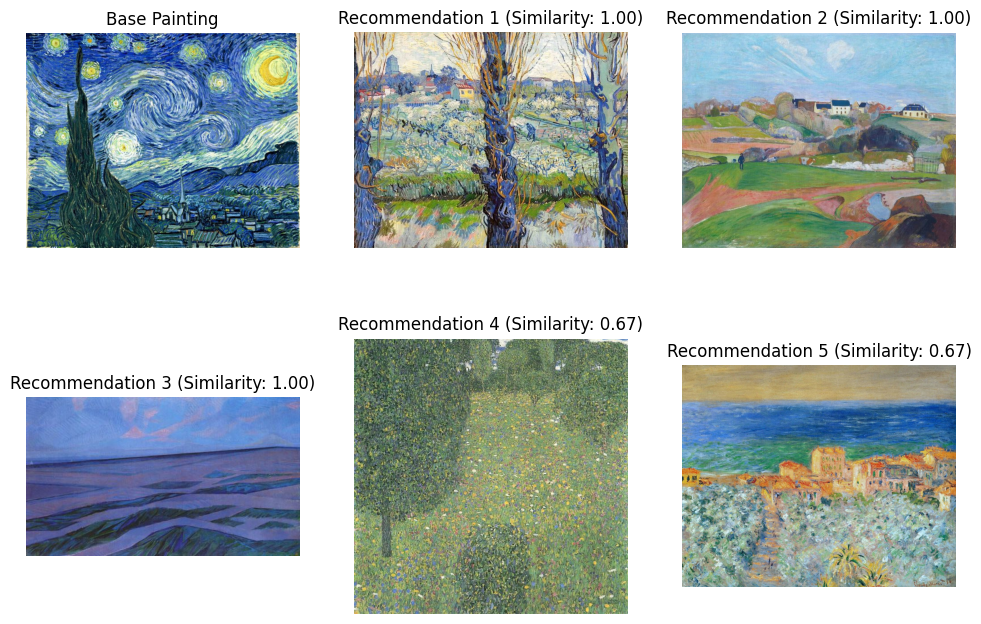

In [ ]:
plot_recommendations(base_painting_idx, similar_paintings, strat_test_set2, strat_train_set2, label_encoders, similarity_scores)

## Example 2

In [ ]:
base_painting_idx = 58
similar_paintings, similarity_scores = get_similar_paintings_from_train(
    base_painting_idx,
    combined_embeddings_test,
    combined_embeddings_train,
    strat_train_set2,
    label_encoders,
    max_artist_recommendations=1,
    top_n=5
)

In [ ]:
similarity_scores = [cosine_similarity([combined_embeddings_test[base_painting_idx]], [combined_embeddings_train[idx]])[0][0] for idx in similar_paintings]

In [ ]:
print_recommendations(base_painting_idx, similar_paintings, similarity_scores, strat_test_set2, strat_train_set2, label_encoders)

Base Painting (ID: 58):
   Subject: historical painting
   Style: mexican muralism
   Materials: fresco
   Artist: diego rivera

Recommended Paintings:
Painting 8: Subject: historical painting, Style: mexican muralism, Materials: fresco, Artist: diego rivera (Similarity Score: 1.00)
Painting 40: Subject: religious painting, Style: proto-renaissance, Materials: fresco, Artist: giotto di bondone (Similarity Score: 0.34)
Painting 264: Subject: historical painting, Style: realism, Materials: oil on canvas, Artist: edouard manet (Similarity Score: 0.34)
Painting 318: Subject: historical painting, Style: renaissance, Materials: woodcut, Artist: albrecht durer (Similarity Score: 0.34)
Painting 300: Subject: historical painting, Style: romanticism, Materials: oil on canvas, Artist: eugene delacroix (Similarity Score: 0.34)


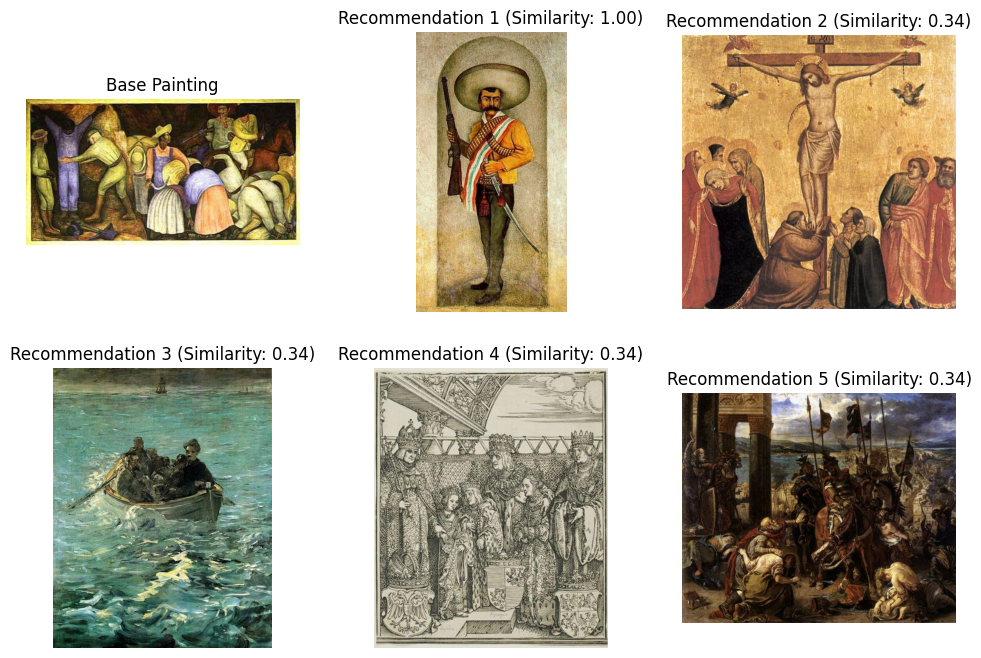

In [ ]:
plot_recommendations(base_painting_idx, similar_paintings, strat_test_set2, strat_train_set2, label_encoders, similarity_scores)

## Example 3

In [ ]:
base_painting_idx = 60
similar_paintings, similarity_scores = get_similar_paintings_from_train(
    base_painting_idx,
    combined_embeddings_test,
    combined_embeddings_train,
    strat_train_set2,
    label_encoders,
    max_artist_recommendations=1,
    top_n=5
)

In [ ]:
similarity_scores = [cosine_similarity([combined_embeddings_test[base_painting_idx]], [combined_embeddings_train[idx]])[0][0] for idx in similar_paintings]

In [ ]:
print_recommendations(base_painting_idx, similar_paintings, similarity_scores, strat_test_set2, strat_train_set2, label_encoders)

Base Painting (ID: 60):
   Subject: landscape
   Style: impressionism
   Materials: oil on canvas
   Artist: claude monet

Recommended Paintings:
Painting 76: Subject: landscape, Style: impressionism, Materials: oil on canvas, Artist: camille pissarro (Similarity Score: 1.00)
Painting 14: Subject: landscape, Style: impressionism, Materials: oil on canvas, Artist: claude monet (Similarity Score: 1.00)
Painting 94: Subject: landscape, Style: impressionism, Materials: oil on canvas, Artist: piet mondrian (Similarity Score: 1.00)
Painting 261: Subject: landscape, Style: impressionism, Materials: oil on canvas, Artist: pierre-auguste renoir (Similarity Score: 1.00)
Painting 236: Subject: landscape, Style: impressionism, Materials: oil on canvas, Artist: paul gauguin (Similarity Score: 1.00)


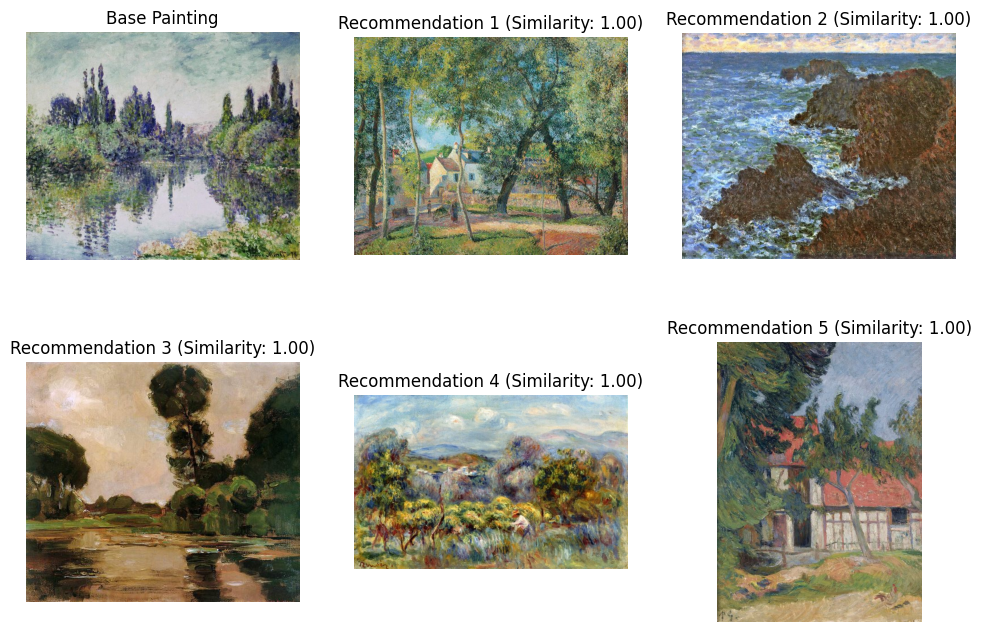

In [ ]:
plot_recommendations(base_painting_idx, similar_paintings, strat_test_set2, strat_train_set2, label_encoders, similarity_scores)

## Example 4

In [ ]:
base_painting_idx = 52
similar_paintings, similarity_scores = get_similar_paintings_from_train(
    base_painting_idx,
    combined_embeddings_test,
    combined_embeddings_train,
    strat_train_set2,
    label_encoders,
    max_artist_recommendations=1,
    top_n=5
)

In [ ]:
similarity_scores = [cosine_similarity([combined_embeddings_test[base_painting_idx]], [combined_embeddings_train[idx]])[0][0] for idx in similar_paintings]

In [ ]:
print_recommendations(base_painting_idx, similar_paintings, similarity_scores, strat_test_set2, strat_train_set2, label_encoders)

Base Painting (ID: 52):
   Subject: religious painting
   Style: mannerism
   Materials: oil on canvas
   Artist: el greco

Recommended Paintings:
Painting 47: Subject: religious painting, Style: mannerism, Materials: oil on canvas, Artist: el greco (Similarity Score: 1.00)
Painting 182: Subject: religious painting, Style: surrealism, Materials: oil on canvas, Artist: salvador dali (Similarity Score: 0.67)
Painting 297: Subject: religious painting, Style: expressionism, Materials: oil on canvas, Artist: edvard munch (Similarity Score: 0.67)
Painting 93: Subject: religious painting, Style: baroque, Materials: oil on canvas, Artist: caravaggio (Similarity Score: 0.67)
Painting 69: Subject: religious painting, Style: baroque, Materials: oil on canvas, Artist: diego velázquez (Similarity Score: 0.67)


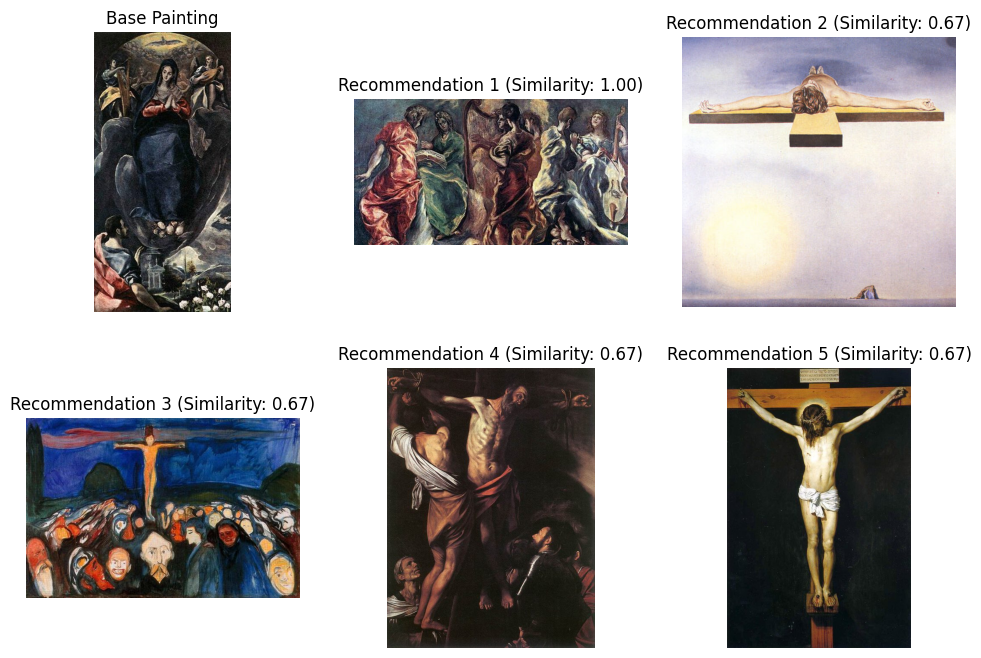

In [ ]:
plot_recommendations(base_painting_idx, similar_paintings, strat_test_set2, strat_train_set2, label_encoders, similarity_scores)

## Example 5

In [ ]:
base_painting_idx = 27
similar_paintings, similarity_scores = get_similar_paintings_from_train(
    base_painting_idx,
    combined_embeddings_test,
    combined_embeddings_train,
    strat_train_set2,
    label_encoders,
    max_artist_recommendations=1,
    top_n=5
)

In [ ]:
similarity_scores = [cosine_similarity([combined_embeddings_test[base_painting_idx]], [combined_embeddings_train[idx]])[0][0] for idx in similar_paintings]

In [ ]:
print_recommendations(base_painting_idx, similar_paintings, similarity_scores, strat_test_set2, strat_train_set2, label_encoders)

Base Painting (ID: 27):
   Subject: caricature
   Style: romanticism
   Materials: etching
   Artist: francisco goya

Recommended Paintings:
Painting 20: Subject: caricature, Style: romanticism, Materials: etching, Artist: francisco goya (Similarity Score: 1.00)
Painting 238: Subject: mythological painting, Style: surrealism, Materials: etching, Artist: pablo picasso (Similarity Score: 0.34)
Painting 206: Subject: portrait, Style: symbolism, Materials: etching, Artist: edvard munch (Similarity Score: 0.34)
Painting 300: Subject: historical painting, Style: romanticism, Materials: oil on canvas, Artist: eugene delacroix (Similarity Score: 0.34)
Painting 252: Subject: landscape, Style: romanticism, Materials: oil on canvas, Artist: paul cezanne (Similarity Score: 0.34)


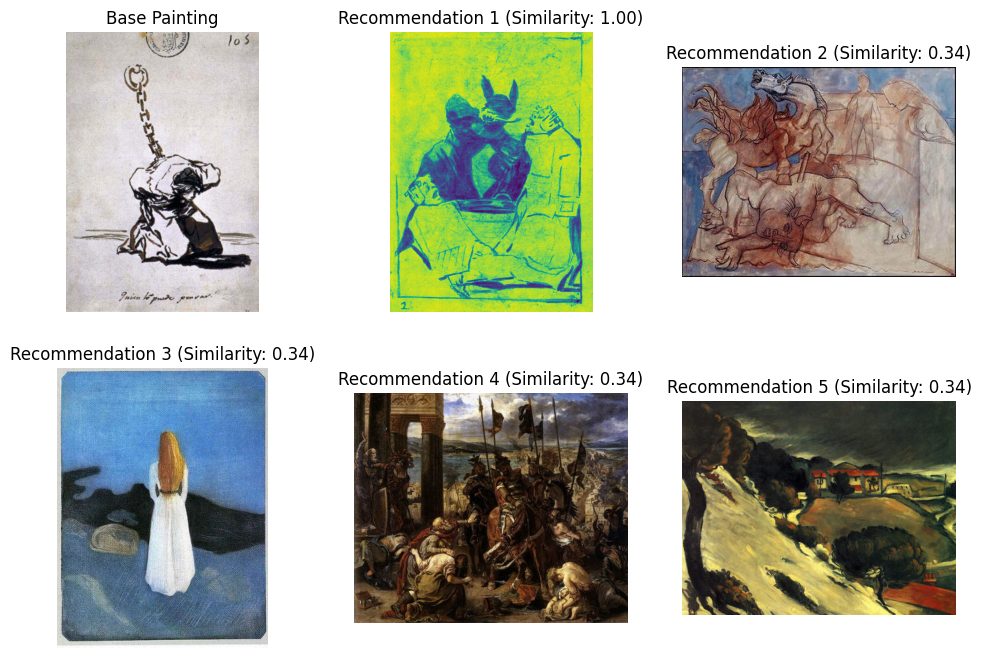

In [ ]:
plot_recommendations(base_painting_idx, similar_paintings, strat_test_set2, strat_train_set2, label_encoders, similarity_scores)

## Recommendation System Evaluation

In [ ]:
def calculate_precision_recall_cosine(base_painting_idx, similar_paintings, combined_embeddings_test, combined_embeddings_train):
    base_painting_embedding = combined_embeddings_test[base_painting_idx]

    relevant_and_retrieved = 0
    relevant_total = 0

    similarity_scores = cosine_similarity([base_painting_embedding], combined_embeddings_train)[0]
    relevant_total = np.sum(similarity_scores > 0.55)

    for rec_idx in similar_paintings:
        test_embedding = combined_embeddings_test[base_painting_idx].reshape(1, -1)
        train_embedding = combined_embeddings_train[rec_idx].reshape(1, -1)

        similarity = cosine_similarity(test_embedding, train_embedding)[0][0]

        if similarity > 0.55:
            relevant_and_retrieved += 1

    precision = relevant_and_retrieved / len(similar_paintings) if len(similar_paintings) > 0 else 0
    recall = relevant_and_retrieved / relevant_total if relevant_total > 0 else 0

    return precision, recall

In [ ]:
def calculate_average_precision_cosine(base_painting_idx, similar_paintings, combined_embeddings_test, combined_embeddings_train):
    relevant_and_retrieved = 0
    cumulative_precision = 0

    base_painting_embedding = np.squeeze(combined_embeddings_test[base_painting_idx])

    for rank, rec_idx in enumerate(similar_paintings, start=1):
        test_embedding = np.squeeze(combined_embeddings_test[base_painting_idx])
        train_embedding = np.squeeze(combined_embeddings_train[rec_idx])
        test_embedding = test_embedding.reshape(1, -1)
        train_embedding = train_embedding.reshape(1, -1)

        similarity = cosine_similarity(test_embedding, train_embedding)[0][0]

        if similarity > 0:
            relevant_and_retrieved += 1
            precision_at_rank = relevant_and_retrieved / rank
            cumulative_precision += precision_at_rank

    average_precision = cumulative_precision / relevant_and_retrieved if relevant_and_retrieved > 0 else 0
    return average_precision

In [ ]:
def evaluate_recommendation_system_on_test(combined_embeddings_test, combined_embeddings_train, top_n=5):
    precisions = []
    recalls = []
    average_precisions = []

    for base_painting_idx in range(len(combined_embeddings_test)):
        similar_paintings, _ = get_similar_paintings_from_train(
            base_painting_idx,
            combined_embeddings_test,
            combined_embeddings_train,
            strat_train_set2,
            label_encoders,
            max_artist_recommendations=1,
            top_n=top_n
        )

        precision, recall = calculate_precision_recall_cosine(base_painting_idx, similar_paintings, combined_embeddings_test, combined_embeddings_train)
        precisions.append(precision)
        recalls.append(recall)

        average_precision = calculate_average_precision_cosine(base_painting_idx, similar_paintings, combined_embeddings_test, combined_embeddings_train)
        average_precisions.append(average_precision)

    avg_precision = np.mean(precisions)
    avg_recall = np.mean(recalls)
    mean_average_precision = np.mean(average_precisions)

    return avg_precision, avg_recall, mean_average_precision

In [ ]:
avg_precision, avg_recall, mean_average_precision = evaluate_recommendation_system_on_test(combined_embeddings_test, combined_embeddings_train, top_n=5)

In [ ]:
print(f"Average Precision: {avg_precision}")
print(f"Average Recall: {avg_recall}")
print(f"Mean Average Precision (MAP): {mean_average_precision}")

Average Precision: 0.8430379746835442
Average Recall: 0.19406158550418642
Mean Average Precision (MAP): 1.0
